# New Version of Basic Analysis: Changing Detrending to rspline 
- can work on other edits as needed

# Basic Figures for Each Source
- I and V band LCs
- color-mag with time stamps (another option that I've tried is also putting the interpolated I points, with time colors, onto the LC)
    - or plot V-I vs. time
- three basic periodograms with fixed bounds for each source
    - can inset periodogram searching closer to established orbital period
    - searches each OGLE epoch
- two more searches closer to established period, if there is one
    - one without detrending, one with
    - can add (or add option) to separate into years or parts with good sampling
    
- To do
    - try different kind of phase-folding
    - can delete extra V-I plot -- always same intercept and slope off by 1; was just confused when seeing one pos, one neg, etc.
    - ~**folded LCs as hisstep rather than scatter plots?**~
        - but need to discuss error
    - add summary table column for other features having comparable amp to orbital
        - **and for orbital amplitude changing**
    - output Corbet prediction based on spin period
    - ~add option to save figures (save all or particular ones)~
    - ~make table that can be read in and out of jupyter with important values (periods, mag ranges, etc.)~
    - ~put peaks from periodograms into dictionary automatically so that not overwritten~
    - correct alias approach?
        - ~but expand function to more automatically evaluate multiple peaks (i.e. array of peaks)~ and then use for more useful output
    
    

In [1]:
from uncertainties import ufloat
from uncertainties.umath import *
import math
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from astropy.stats import LombScargle
from scipy import signal
%matplotlib inline
import warnings
warnings.filterwarnings("ignore")
import scipy.optimize
import glob
from astropy.table import Table,join,vstack,unique
from importlib import reload
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
import seaborn as sb
import scipy.stats as st
import wotan

import ogle as o #module

blue = 'cornflowerblue'
navy = 'navy'
purple = 'rebeccapurple'
pink = '#CF6275'
maroon = 'maroon'

In [2]:
cross = Table.read('sourcefiles.csv')
full = Table.read('smc_x_m03_zar_match_OGLE_v2.ascii',format='ascii')

In [3]:
full[:3]

src_n,OGLE,RA_OGLE,DEC_OGLE,ra_deg,dec_deg,perr,period,Porb,_RAJ2000_1,_DEJ2000_1,__M2002_,Vmag_1,Separation_1,_RAJ2000_2,_DEJ2000_2,Vmag_2,recno,Separation
int64,str38,str11,str11,float64,float64,float64,float64,float64,float64,float64,int64,float64,float64,float64,float64,float64,int64,float64
1,OGLE,RA,DEC,19.271511,-73.443405,0.5,0.717,3.892,19.27120833333333,-73.44333333333334,77458,13.15,0.4041071611446303,19.271369999999997,-73.44318999999999,13.152,5068334,0.7879504646408463
2,SMC732.03 \#3540,01:21:40.61,-72:57:30.9,20.41893,-72.95907,2.0,2.165,84.0,20.418999999999993,-72.95847222222221,80352,14.28,2.147142505236131,--,--,--,--,--
3,SMC720.17 \#50,00:54:33.44,-73:41:01.3,13.639167,-73.68364,0.8,2.37,18.38,13.639333333333331,-73.68369444444444,30492,14.51,0.2597014565010407,13.639544999999995,-73.68356999999999,14.729,2675272,0.4570936647419033


# Make Table for Important Quantities
- **comment out once written out the first time and instead read in and write as needed**

In [4]:
#summary table: include many but not all rows from full
# up to sep from full table

# pandas DataFrame b/c easier with data types
# summ = pd.DataFrame(columns=['src_n','ra_deg','dec_deg','spin period','perr','est. period','sep',
#                     'name','mean I','stdev I','max I','min I','I range','mean V','stdev V','max V','min V','V range',
#                    'est. period method','best period','best superorbital','other period','period shape','big dip',
#                    'orbital cont','superorbital cont','mult superorbital','changing superorbital amp',
#                    'redder when brighter','I V-I corr','V V-I corr','I V-I slope','I V-I int','V V-I slope','V V-I int',
#                     'V-I transition','Type II amp','note'])
#separate tables for all significant peaks

In [5]:
#read in summary table, which was first initialized above
summ = pd.read_csv('summtab.csv') #can decide whether to switch indexing to src_n

In [7]:
summ[5:10]

,src_n,ra_deg,dec_deg,spin period,perr,est. period,sep,name,mean I,stdev I,...,V-I transition,Type II amp,note,I skew,I kurtosis,V skew,V kurtosis,best auto det pd,Part,I IQR
5,6,14.259583,-72.43188,5.050,0.5,17.13,0.902515,SXP 5.05,15.905905,0.095154,...,yes,0.30,changed est. 17.2 to 17.13,-1.266705,0.786946,-1.381626,0.596449,17.347929,1.0,NaN
6,7,15.722455,-72.74299,6.850,0.5,21.90,0.421283,NaN,14.721636,0.219999,...,NaN,NaN,3 epochs,1.011883,0.099615,0.927689,-0.508443,23.961722,1.0,NaN
7,8,13.541667,-72.42889,6.878,204.0,0.00,0.000000,NaN,16.444344,0.043925,...,NaN,NaN,NaN,-0.101434,-1.653546,-0.182664,-1.080367,6.228457,2.0,0.08375
8,9,13.023750,-72.43445,7.780,0.6,44.92,0.136825,NaN,14.768247,0.063653,...,yes,0.34,identical with established,-2.198561,8.803889,-2.319572,10.989067,44.901697,1.0,NaN
9,10,14.493333,-72.37486,7.920,1.5,40.03,1.214530,SXP 7.92,15.863079,0.060680,...,yes,NaN,bootstrap stdev 0.009d,-1.586341,3.237692,0.982469,0.053194,39.834982,1.0,NaN


In [8]:
#add skew, kurtosis to table -- initialized with zeros
# summ['I skew'] = np.zeros(len(summ))
# summ['I kurtosis'] = np.zeros(len(summ))
# summ['V skew'] = np.zeros(len(summ))
# summ['V kurtosis'] = np.zeros(len(summ))

#add best period from basic function (after detrending)
# summ['best auto det pd'] = np.zeros(len(summ))

**some name explanations** -- decide how to do categorical variables (e.g. 'yes' or 'no')
added some for first six sources but do another round with final methodology

- est period method: method for determination of established period (X-ray or optical)
- superorbital cont: continuous superorbital trend (rather than base value with flares) -- same goes for orbital cont
- mult. superorbital: multiple superorbital periods (i.e. epochs with different periods)
- I V-I corr, V V-I corr: correlation coefficient in each plot (negative is redder when brighter and closer to one less scatter)
    - can discuss value to use; for now: np.corrcoeff
    - for now, 'yes' to redder when brighter iff both coeffs less than -0.5
    - only 'no' if coeff greater than 0.5
    - otherwise: 'check'
- I V-I slope, I V-I int: coefficients for best fit line of interp I vs. V-I
- V-I transition: for now, any sort of separate features or transition
- Type II amp: amplitude (max-~min) of Type II outburst if there is one
    - once modeling, add FWHM (same for other flares)
- note: any quick notes (e.g. important to 'see summary')
- big dip: big superorbital dip (but not part of sinusoidal trend/not symmetrical)

> - **future: add flare parameters from fitting (e.g. amplitude, FWHM, quantified asymmetry**

In [9]:
summ.columns

Index(['src_n', 'ra_deg', 'dec_deg', 'spin period', 'perr', 'est. period',
       'sep', 'name', 'mean I', 'stdev I', 'max I', 'min I', 'I range',
       'mean V', 'stdev V', 'max V', 'min V', 'V range', 'est. period method',
       'best period', 'best superorbital', 'other period', 'period shape',
       'big dip', 'orbital cont', 'superorbital cont', 'mult superorbital',
       'changing superorbital amp', 'redder when brighter', 'I V-I corr',
       'V V-I corr', 'I V-I slope', 'I V-I int', 'V V-I slope', 'V V-I int',
       'V-I transition', 'Type II amp', 'note', 'I skew', 'I kurtosis',
       'V skew', 'V kurtosis', 'best auto det pd', 'Part', 'I IQR'],
      dtype='object')

In [10]:
#get all source numbers
nums = cross['src_n']

In [11]:
# summ['src_n'] = full['src_n']
# summ['ra_deg'] = full['ra_deg']
# summ['dec_deg'] = full['dec_deg']
# summ['spin period'] = full['period']
# summ['perr'] = full['perr']
# summ['est. period'] = full['Porb']
# summ['sep'] = full['Separation_1']

## Initialize Dictionary for Tables of Peaks in Periodograms
- each source has peaks from three periodograms to save, in tables with period and peak


In [12]:
#initialize dictionary with a list for each source number
#that list will then be a list of three tables
peak_dict = dict.fromkeys(nums, [])

In [13]:
peak_dict[7] 

[]

In [14]:
def aliasarr(arr,nrange=1,cutzero=True):
    '''Find aliases above 1 (or given value mina) using array of periods
    arr: array of period (peaks)
    nrange: maximum n to use in alias calculation
            n's used: -1*nrange to nrange'''
    n = np.arange(-1*nrange,nrange+1) #includes zero so returned array will include periods passed in
    #repeat range of n for # of periods passed in
    nt = np.tile(n,(len(arr),1))
    nt = np.swapaxes(nt,0,1)
    a = np.tile(arr,(len(n),1))
    farr = nt + 1/a 
    parr = np.abs(1/farr)
    #cut out array of original periods (from n=0)
    if cutzero:
        parr = np.concatenate([parr[:nrange],parr[nrange+1:]])
    return parr

see examples of aliasarr() after use of basic function
- can use with periods from peak_dict

In [15]:
def findbeat(p1,p2):
    '''Return beat period given two periods'''
    return 1/np.abs(1/p1 - 1/p2)

In [16]:
findbeat(.45,80.2)

0.452539184952978

# Summary Functions
- main function is basic(), two cells below
- addtotable() called in basic to populate summary table

In [18]:
def addtotable(iband,vband,tab,num,interp,bpdet):
    '''Automatically update some columns of summ table
    Called at the end of basic()
    function also in ogle.py but leaving here for now'''
    #row to update
    row = tab[tab['src_n']==num]
    #put in mean, stdev, max, min I and V band values
    row['mean I'] = np.mean(iband['I mag'])
    row['stdev I'] = np.std(iband['I mag'])
    row['min I'] = np.min(iband['I mag'])
    row['max I'] = np.max(iband['I mag'])
    row['I range'] = row['max I'] - row['min I']
    #repeat for V band
    row['mean V'] = np.mean(vband['V mag'])
    row['stdev V'] = np.std(vband['V mag'])
    row['min V'] = np.min(vband['V mag'])
    row['max V'] = np.max(vband['V mag'])
    row['V range'] = row['max V'] - row['min V']
    #add skew and kurtosis of I and V band mags
    row['I skew'] = st.skew(iband['I mag'])
    row['V skew'] = st.skew(vband['V mag'])
    row['I kurtosis'] = st.kurtosis(iband['I mag'])
    row['V kurtosis'] = st.kurtosis(vband['V mag'])
    row['I IQR'] = st.iqr(iband['I mag'])
    #best detrended period (close to established or 2 to 200 if no established)
    row['best auto det pd'] = bpdet
    
    #correlation coefficients for Iint vs. V-I and V vs. V-I 
    icorr = np.corrcoef(vband['V mag']-interp,interp)[1][0]
    row['I V-I corr'] = icorr
    vcorr = np.corrcoef(vband['V mag']-interp,vband['V mag'])[1][0]
    row['V V-I corr'] = vcorr
    
    #redder when brighter(update criteria as needed)
    if icorr < -0.5 and vcorr < -0.5: row['redder when brighter'] = 'yes'
    elif icorr > 0.5 and vcorr > -0.5: row['redder when brighter'] = 'no'
    else: row['redder when brighter'] = 'check'
        
    #best fit lines to Iint vs. V-I and V vs. V-I 
    vi = vband['V mag']-interp
    imod = np.polyfit(vi,interp,1)
    #use coefficients to make string of equation
    #can decide if other format better and easier to use when pulling from table (e.g. breaking up into slope and int)
    row['I V-I slope'] = imod[0]
    row['I V-I int'] = imod[1] 
    #can add full = True to np.polyfit to also get sum of squares of residuals
    
    vmod = np.polyfit(vi,vband['V mag'],1)
    row['V V-I slope'] = vmod[0]
    row['V V-I int'] = vmod[1] 

    #update table
    tab[tab['src_n']==num] = row
    
    #calculate I vs. V-I correlation to determine if redder when brighter
    #for now, redder when brighter just based on I vs. V-I, not both
    return 

In [19]:
#make color map for color-mag diagrams
# import matplotlib.colors as colors
# def truncate_colormap(cmap, minval=0.0, maxval=1.0, n=100):
#     new_cmap = colors.LinearSegmentedColormap.from_list(
#         'trunc({n},{a:.2f},{b:.2f})'.format(n=cmap.name, a=minval, b=maxval),
#         cmap(np.linspace(minval, maxval, n)))
#     return new_cmap
# cmap = plt.get_cmap('plasma')
# new_cmap = truncate_colormap(cmap, 0.0, 0.7)

to-dos/questions/notes with new detrending
- sometimes extreme outlier -- for now replacing with the mean I band
- replacing nans with zeros, but figure out if there's a way to just ignore nans in periodogram
    - otherwise can also drop them

In [30]:
def basic(index,inset=True,pbins=10,det=False,color=pink,sigmas=[100,30,20],dists=[100,100,30],medlim=True,rettabs=False,saveall=False,cmap='viridis',window=701,spline=True,btol=50):
    '''Carry out basic anaylis of a single source
    To do: put peak frames into dictionary based on source number (as part of function rather than return statement)
    medlim: limits on detrended phase-fold 0.06 from median rather than showing all data points
    rettabs: return three peak tables, rather than adding them to dictionary peak_dict
    window: window to use in plotted detrended LC
    spline: use rspline from wotan to detrend LC
    btol: break tolerance for spline'''
    #get source number using index
    srcn = nums[index]
    #grab row for source number from full table
    row = full[full['src_n']==srcn]
    print('Source number: '+str(srcn))
    print('RA,Dec (deg): '+ str(float(row['ra_deg']))+', '+str(float(row['dec_deg'])))
    print('Established period: '+str(float(row['Porb'])))
    print('NS spin period: '+str(float(row['period'])))
    #check on this
    print('Separation: '+str(float(row['Separation_1'])))
    
    orb = float(row['Porb'])
    
    #get I and V band LCs
    ilist,vlist = o.getIV(srcn,cross,plot=True,zooms=False,figsize=(8,4),mult=(3,8),offset=10,stack=False,save=saveall,file=f'AutoFigs/src{srcn}lc')
    iband,vband = vstack(ilist),vstack(vlist)
    
    #rspline detrending
    if spline:
        flatten, trend = wotan.flatten(iband['MJD-50000'],iband['I mag'],method='rspline',window_length=window,break_tolerance=btol,return_trend=True)
        
        #add detrended column: original - trend + mean
        mean = np.mean(iband['I mag'])
        detr = iband['I mag'] - trend + mean
        iband['I detrend'] = detr
        #for periodogram, use temp table that takes out nan detrended values
        itemp = iband[np.isnan(iband['I detrend'])==False]
        #also ignore outliers by greater than a mag
#         detr[np.abs(detr-mean)>1] = mean #other option: set outliers equal to mean...
        itemp = itemp[np.abs(itemp['I detrend']-mean)<1]
    else: #use Savitzy-Golay detrending
        o.detrend(iband,window=window)
        itemp = iband
        print(f'window for detrended LC: {window}')
    plt.figure(figsize=(8,4))
    plt.scatter(itemp['MJD-50000'],itemp['I detrend'],color=color,s=4)
    plt.ylabel('detrended I mag',fontsize=14)
    plt.xlabel('MJD-50000',fontsize=14)
    maxdet,mindet = np.max(itemp['I detrend']),np.min(itemp['I detrend'])
    plt.ylim(maxdet+0.02,mindet-0.02)
    
    #color-mag plots
    interp = o.colormag(iband,vband,ctime=True,retint=True,figsize=(9,4),save=saveall,file=f'AutoFigs/src{srcn}colormag',cmap=cmap,both=False) 
    
    #plot two window functions (but don't save these plots)
    wfreq1, wpow1, wbp1 = o.periodogram(iband,minp=0.1,maxp=2,wfunc=True,plot=False,more=True)
    #if power isn't all nans, plot window functions
    if False in np.isnan(wpow1):
        fig,ax = plt.subplots(1,2,figsize=(9,4))
        ax[0].plot(1/wfreq1,wpow1,color='black')
        ax[0].set_ylabel('LS Power',fontsize=14)
        ax[0].set_xlabel('Period (days)',fontsize=14)
        #repeat 2-2000 days
        wfreq2, wpow2, wbp2 = o.periodogram(iband,minp=2,maxp=2000,wfunc=True,plot=False,more=True)
        fig.suptitle('Window Function Less and Greater than 2 Days',fontsize=14)
        ax[1].plot(1/wfreq2,wpow2,color='black')
        
    #get start and end dates
    stdate = iband['MJD-50000'][:1]
    endate = iband['MJD-50000'][-1:]
    trange = endate-stdate
    #three ranges for periodograms: less than 2, 2-200, 200-4000?
    #for each, save main peaks
    freq1,power1,bp1 = o.periodogram(iband,minp=0.1,maxp=2,more=True,plot=False)
    pf1 = o.findpeaks(freq1,power1,sigma=sigmas[0],distance=dists[0],pkorder=True)
    
    freq2,power2,bp2 = o.periodogram(iband,minp=2.01,maxp=200,more=True,plot=False)
    pf2 = o.findpeaks(freq2,power2,sigma=sigmas[1],distance=dists[1],pkorder=True)
    freq3,power3,bp3 = o.periodogram(iband,minp=200,maxp=trange/3,more=True,plot=False)
    pf3 = o.findpeaks(freq3,power3,sigma=sigmas[2],distance=dists[2],pkorder=True)

    if orb>0:
        #get periodogram local max within 10 days of established period
        if orb > 200:  #est. period in third periodogram
            near = pf3[np.abs(orb-pf3['period'])<orb/10]
            freq,power = freq3,power3
        #est. period between 2 and 200 days
        else: 
            near = pf2[np.abs(orb-pf2['period'])<orb/10]
            freq,power = freq2,power2
        i = 0
        #adjust distance and sigma until nearby peak identified
        while len(near)<1 and i<sigmas[1]/5:
            pf = o.findpeaks(freq,power,sigma=sigmas[1]-i*5,distance=dists[1]-i*5,pkorder=True)
            near = pf[np.abs(orb-pf['period'])<orb/10]
            i+=1
    #plot side-by-side
    fig,ax = plt.subplots(1,3,figsize=(14,4))
    #plot each periodogram with best period in text
    ax[0].plot(1/freq1,power1,color='black')
    ax[0].text(0.1+(2-0.1)/2,0.8*np.max(power1),f'best: {bp1:.2f}')

    ax[1].plot(1/freq2,power2,color='black')
    ax[1].text(2.01+(200-2.01)/200,0.8*np.max(power2),f'{bp2:.2f}')
    
    ax[2].plot(1/freq3,power3,color='black')
    ax[2].text(200+(trange/3-200)/2,0.8*np.max(power3),f'{bp3:.2f}')

    ax[0].set_ylabel('LS Power',fontsize=14)
    ax[0].set_xlabel('Period (days)',fontsize=14)
    #inset periodogram search closer to established period; one periodogram per OGLE epoch
    if not np.isnan(orb) and inset:
        #find ax for inset based in whether or not est. period > 200 days
        if orb>200: axind = 2
        else: axind = 1
        ax[axind].axvline(orb,color='darkseagreen',alpha=0.4)
        #inset search closer to orbital period for each OGLE epoch
        axins = inset_axes(ax[axind], width=1.4, height=1.4,loc='upper right',borderpad=0.4)
        colors = ['navy','maroon','darkgreen']
        labels = ['OII','OIII','OIV']
        if len(ilist)==2: #no OII
            labels=labels[1:]
            colors = colors[1:]
        elif len(ilist)==1: #no OIII either; better way to do this but didn't see some are only OIV
            labels=labels[2:]
            colors = colors[2:]
        c = 0
        low = orb-orb/10
        up = orb+orb/10
        for i in ilist:
            f,p,bp = o.periodogram(i,minp=low,maxp=up,more=True,plot=False)
            axins.plot(1/f,p,color=colors[c],label=labels[c])
            axins.set_yticks([])

            c+=1
        axins.axvline(orb,color='darkseagreen',alpha=0.4)
        axins.legend()
    if saveall: plt.savefig(f'AutoFigs/src{srcn}_3gram',dpi=200,bbox_inches='tight')
        
        
    #compare phase-fold of best peak near orbital period and established orbital period
    if orb>0:
        plt.rcParams['lines.linewidth'] = 2

        print('Phase-folding with established orbital period and highest peak within five days of that value...')
        orb = np.float(orb)

        if len(near)>0: 
            #highest peak within 10 days of established
            np1 = float(near['period'][:1]) 
            #set label
            nearlab = f'LS peak near est.:{np1:.2f}'
        else: 
            np1 = bp2
            nearlab = f'LS peak 2-200.:{np1:.2f}'
        fig,ax = plt.subplots(1,2,figsize=(10,4),sharey=True)
        plt.subplots_adjust(wspace=0.04)
        #commenting out plotting of points since not detrended
#         ax[0].errorbar((iband['MJD-50000']%orb)/orb,iband['I mag'],yerr=iband['I mag err'],linestyle='none',marker='o',markersize=4,color=color,label=f'est. pd: {orb}',zorder=1,alpha=0.4)
#         ax[0].errorbar(1+(iband['MJD-50000']%orb)/orb,iband['I mag'],yerr=iband['I mag err'],linestyle='none',marker='o',markersize=4,color=color,zorder=1,alpha=0.4)
        mid,avg,err = o.meanphase(iband,orb,pbins=pbins,det=det,double=True,divide=True,stdev=True,sterr=True)
        ax[0].step(mid,avg,where='mid',color='black',label=f'est. pd: {orb}')
        #add standard error
        ax[0].errorbar(mid,avg,yerr=err,color='black',alpha=0.4,ls='none')
        
        
        #commenting out plotting of points since not detrended
#         ax[1].errorbar((iband['MJD-50000']%np1)/np1,iband['I mag'],yerr=iband['I mag err'],linestyle='none',marker='o',markersize=3,color=color,label=f'LS peak near est.: {np1:.2f}',zorder=1,alpha=0.4)
#         ax[1].errorbar(1+(iband['MJD-50000']%np1)/np1,iband['I mag'],yerr=iband['I mag err'],linestyle='none',marker='o',markersize=3,color=color,zorder=1,alpha=0.4)
        mid,avg,err = o.meanphase(iband,np1,pbins=pbins,det=det,double=True,divide=True,sterr=True,stdev=True)

        ax[1].step(mid,avg,where='mid',color='black',zorder=10,label=nearlab)
        ax[1].errorbar(mid,avg,yerr=err,color='black',alpha=0.4,ls='none')

        
        ax[0].legend(loc='lower left')
        ax[1].legend(loc='lower left')
        ax[0].set_ylabel('I mag',fontsize=13)
        ax[0].set_xlabel('Phase',fontsize=13)
        maxi,mini = np.max(avg),np.min(avg)

        ax[0].set_ylim(maxi+.02,mini-.02)

        if saveall: plt.savefig(f'AutoFigs/src{srcn}_fold',dpi=200,bbox_inches='tight')

        
        #repeat but after detrending
        print('Repeating periodogram and phase-fold after detrending')
        window = np.arange(int(1.4*orb),orb*3,10,dtype='int16')
        #go up to higher windows when using spline; ~10 steps
        if spline: window = np.arange(2*orb,700,int((700-2*orb)/10),dtype='int16')
        if window[0]%2 == 0: window += 1
        fig,ax = plt.subplots(1,4,figsize=(20,4))
        plt.subplots_adjust(wspace=0.25)

        bps = []
        maxpow = []
        for w in window:
            if spline:
                flatten, trend = wotan.flatten(iband['MJD-50000'],iband['I mag'],method='rspline',window_length=w,break_tolerance=btol,return_trend=True)
                #add detrended column: original - trend + mean
                iband['I detrend'] = iband['I mag'] - trend + np.mean(iband['I mag'])
                #use table where nan rows are taken out: itemp
                itemp = iband[np.isnan(iband['I detrend'])==False]
                #also ignore outliers by greater than a mag
                itemp = itemp[np.abs(itemp['I detrend']-mean)<1] 
            else: 
                o.detrend(iband,window=w)
                itemp = iband
            freq,power,bp = o.periodogram(itemp,minp=low,maxp=up,det=True,more=True,plot=False)
            ax[0].plot(1/freq,power,color='black')
            bps.append(bp)
            maxpow.append(np.max(power))
        #final detrend used in phase-folded plots
        finwin = window[np.argmax(maxpow)]
        if spline:
            flatten, trend = wotan.flatten(iband['MJD-50000'],iband['I mag'],method='rspline',window_length=finwin,break_tolerance=btol,return_trend=True)
            #add detrended column: original - trend + mean
            iband['I detrend'] = iband['I mag'] - trend + np.mean(iband['I mag'])
            itemp = iband[np.isnan(iband['I detrend'])==False]
            #also ignore outliers by greater than a mag
            itemp = itemp[np.abs(itemp['I detrend']-mean)<1]
        else: 
            o.detrend(iband,window=finwin)
            itemp = iband
        print(f'Window shown in phase-fold: {finwin}')

        #highest-powered best period
        np1 = bps[np.argmax(maxpow)]
        ax[0].axvline(orb,color='darkseagreen',alpha=0.4,label=f'est. pd: {orb}')
        ax[0].legend()
        im = ax[3].scatter(window,bps,c=maxpow)
        fig.colorbar(im,label='Power')
        ax[3].axhline(orb,color='darkseagreen',alpha=0.4)
        
        #now phase-fold
        ax[1].errorbar((itemp['MJD-50000']%orb)/orb,itemp['I detrend'],yerr=itemp['I mag err'],linestyle='none',marker='o',markersize=2,color=color,alpha=0.4,label=f'est. pd: {orb}',zorder=1)
        ax[1].errorbar(1+(itemp['MJD-50000']%orb)/orb,itemp['I detrend'],yerr=itemp['I mag err'],linestyle='none',marker='o',markersize=2,color=color,alpha=0.4,zorder=1)
        mido,avgo,erro = o.meanphase(itemp,orb,pbins=pbins,det=True,double=True,divide=True,sterr=True,stdev=True)
        #plot as step function
        ax[1].step(mido,avgo,where='mid',color='black')
        ax[1].errorbar(mido,avgo,yerr=erro,color='black',alpha=0.4,ls='none')


        maxi,mini = np.max(itemp['I detrend']),np.min(itemp['I detrend'])
        medi = np.median(itemp['I detrend'])
        #cut out outliers
        maxa,mina = np.max(avgo)+np.max(erro),np.min(avgo)-np.max(erro)
        medi = np.median(itemp['I detrend'])
        #cut out outliers
        if medlim:
            ax[1].set_ylim(maxa+.01,mina-.01)
            #ax[2].set_ylim(medi+.06,medi-.06)
        else:
            ax[1].set_ylim(maxi+.01,mini-.01)
            ax[2].set_ylim(maxi+.01,mini-.01)

        ax[2].errorbar((itemp['MJD-50000']%np1)/np1,itemp['I detrend'],yerr=itemp['I mag err'],linestyle='none',marker='o',markersize=2,alpha=0.4,color=color,label=f'LS peak near est.: {np1:.2f}',zorder=1)
        ax[2].errorbar(1+(itemp['MJD-50000']%np1)/np1,itemp['I detrend'],yerr=itemp['I mag err'],linestyle='none',marker='o',markersize=2,color=color,zorder=1,alpha=0.4)
        midn,avgn,errn = o.meanphase(itemp,np1,pbins=pbins,det=True,double=True,divide=True,sterr=True,stdev=True)
        maxa,mina = np.max(avgn)+np.max(errn),np.min(avgn)-np.max(errn)
        medi = np.median(itemp['I detrend'])
        #cut out outliers
        if medlim:
            ax[2].set_ylim(maxa+.01,mina-.01)
        ax[2].step(midn,avgn,where='mid',color='black')
        ax[2].errorbar(midn,avgn,yerr=errn,color='black',alpha=0.4,ls='none')

        ax[1].legend(loc='lower left')
        ax[2].legend(loc='lower left')
        ax[1].set_ylabel('I detrended',fontsize=13)
        ax[1].set_xlabel('Phase',fontsize=13)   
        ax[0].set_ylabel('LS Power',fontsize=13)
        ax[0].set_xlabel('Period (days)',fontsize=13)
        ax[3].set_ylabel('Peak Period',fontsize=13)
        ax[3].set_xlabel('Detrending Window',fontsize=13)
        if saveall: plt.savefig(f'AutoFigs/src{srcn}_folddet',dpi=200,bbox_inches='tight')
        #for table: best automatically-found detrended period (in range of normal orbital periods)
        bpdet = np1
    #if no established period        
    else:
        fig,ax = plt.subplots(1,3,figsize=(15,4))
        plt.subplots_adjust(wspace=0.25)
        #detrend and fold with peak from middle periodogram
        print(f'using best period from middle periodogram to phase-fold data, after detrending with {window}')
        ax[0].errorbar((itemp['MJD-50000']%bp2)/bp2,itemp['I mag'],yerr=itemp['I mag err'],linestyle='none',marker='o',markersize=4,color=color,label=f'peak pd: {bp2:.2f}',zorder=1,alpha=0.4)
        ax[0].errorbar(1+(itemp['MJD-50000']%bp2)/bp2,itemp['I mag'],yerr=itemp['I mag err'],linestyle='none',marker='o',markersize=4,color=color,zorder=1,alpha=0.4)
        mid,avg,err = o.meanphase(itemp,bp2,pbins=pbins,det=False,double=True,divide=True,sterr=True,stdev=True)
        ax[0].step(mid,avg,where='mid',color='black')
        ax[0].errorbar(mid,avg,yerr=err,ls='none',color='black',alpha=0.4)
        maxa,mina = np.max(avg)+np.max(err),np.min(avg)-np.max(err)
        maxi,mini = np.max(itemp['I mag']),np.min(itemp['I mag'])
        if medlim: ax[0].set_ylim(maxa+.01,mina-.01)
        else: ax[0].set_ylim(maxi+.02,mini-.02)
        ax[0].set_ylabel('I mag',fontsize=13)
        ax[0].set_xlabel('Phase',fontsize=13)
        ax[0].legend()

        #detrended periodogram and fold with peak
        print('running periodogram on detrended data')
        freq,power,bpdet = o.periodogram(itemp,det=True,minp=2,maxp=200,more=True,plot=False)
        #plot periodogram
        ax[1].plot(1/freq,power,color='black')
        ax[1].set_ylabel('LS Power (using detrended I mag)',fontsize=13)
        ax[1].set_xlabel('Period (days)',fontsize=13)
        
        #phase-fold with peak from detrended periodogram
        ax[2].errorbar((itemp['MJD-50000']%bpdet)/bpdet,itemp['I detrend'],yerr=itemp['I mag err'],linestyle='none',marker='o',markersize=4,color=color,label=f'det peak pd: {bpdet:.2f}',zorder=1,alpha=0.4)
        ax[2].errorbar(1+(itemp['MJD-50000']%bpdet)/bpdet,itemp['I detrend'],yerr=itemp['I mag err'],linestyle='none',marker='o',markersize=4,color=color,zorder=1,alpha=0.4)
        mid,avg,err = o.meanphase(iband,bpdet,pbins=pbins,det=True,double=True,divide=True,sterr=True,stdev=True)
        ax[2].step(mid,avg,where='mid',color='black') 
        ax[2].errorbar(mid,avg,yerr=err,ls='none',color='black',alpha=0.4) 
        maxa,mina = np.max(avg)+np.max(err),np.min(avg)-np.max(err)
        maxi,mini = np.max(itemp['I detrend']),np.min(itemp['I detrend'])
        if medlim: ax[2].set_ylim(maxa+.01,mina-.01)
        else:ax[2].set_ylim(maxi+.02,mini-.02)
        ax[2].set_ylabel('detrended I mag',fontsize=13)
        ax[2].set_xlabel('Phase',fontsize=13)
        ax[2].legend()
        if saveall: plt.savefig(f'AutoFigs/src{srcn}_folds',dpi=200,bbox_inches='tight')

    #I band histgoram
    plt.figure(figsize=(4,3))
    h = plt.hist(iband['I mag'],color=color,alpha=0.4,bins=30)
    plt.ylabel('# points')
    plt.xlabel('I mag')
    
    #print useful quantites
    print('\n')
    print('max I band: ',np.max(iband['I mag']))
    print('min I band: ',np.min(iband['I mag']))
    print('I range: ',np.max(iband['I mag'])-np.min(iband['I mag']))
    print('I stdev: ',np.std(iband['I mag']))

    
    print('max V band: ',np.max(vband['V mag']))
    print('min V band: ',np.min(vband['V mag']))
    print('V range: ',np.max(vband['V mag'])-np.min(vband['V mag']))
    print('V stdev: ',np.std(vband['V mag']))
    
    #add values to table
    addtotable(iband,vband,summ,srcn,interp,bpdet)

    if rettabs: return pf1,pf2,pf3
    else:
        peak_dict[srcn] = [pf1,pf2,pf3]

# Examples of Source Summaries

In [22]:
save = True #can just set here whether to resave figs below

Source number: 2
RA,Dec (deg): 20.41893, -72.95907
Established period: 84.0
NS spin period: 2.165
Separation: 2.147142505236131
I and V-I correlation: -0.9846799925699677
V and V-I correlation: -0.9546678612457401
Phase-folding with established orbital period and highest peak within five days of that value...
Repeating periodogram and phase-fold after detrending
Window shown in phase-fold: 169


max I band:  15.06
min I band:  13.983
I range:  1.077
I stdev:  0.3562511738415938
max V band:  14.753
min V band:  14.195
V range:  0.5579999999999998
V stdev:  0.1525440976517776


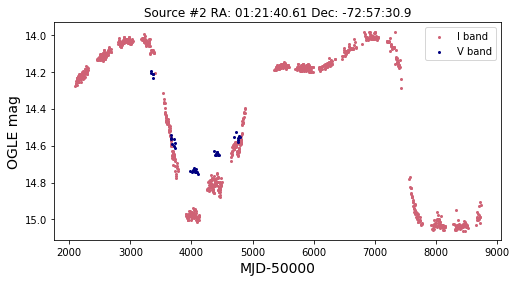

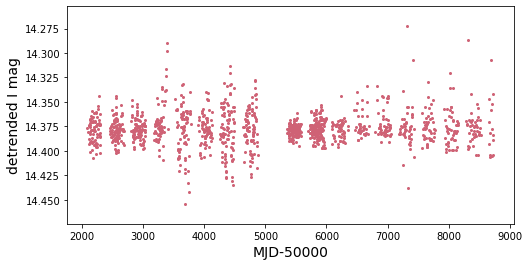

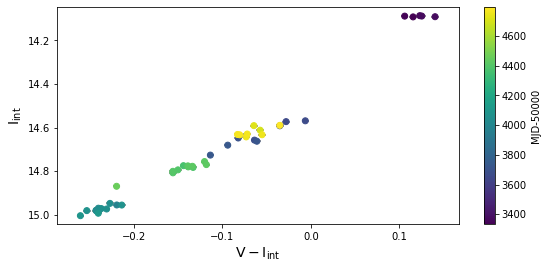

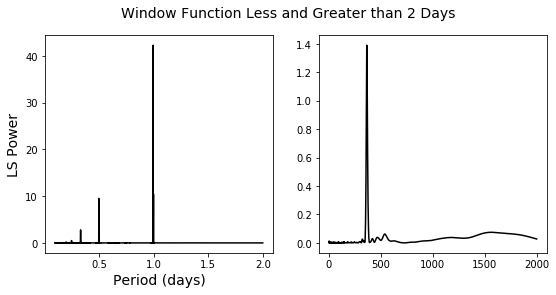

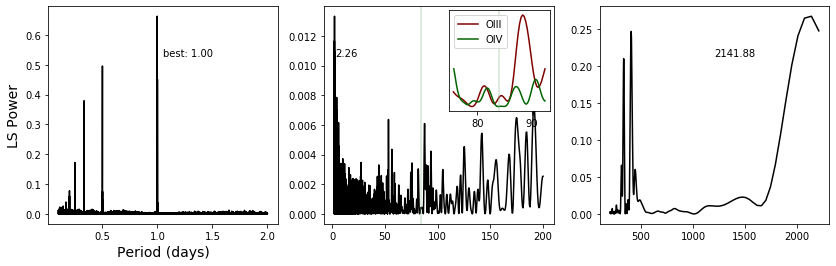

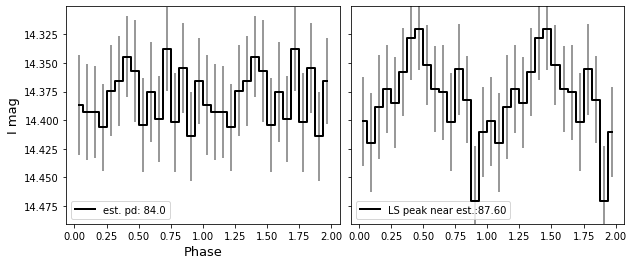

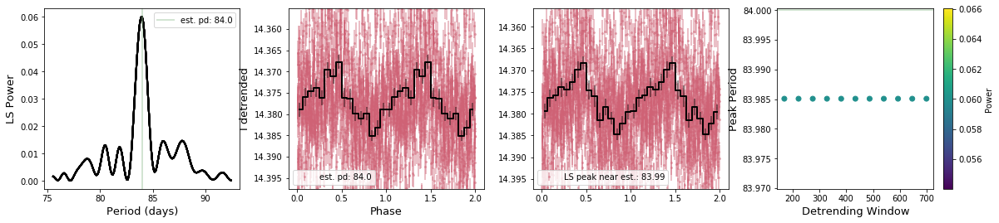

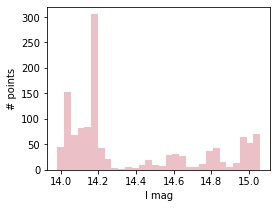

In [23]:
reload(o)
#outputs text and figs, adds to summary table, and puts three peak tables into peak_dict (with the key being source number)
basic(0,pbins=16,saveall=save,window=117)

In [24]:
summ[:3] #succesfully updated table

,src_n,ra_deg,dec_deg,spin period,perr,est. period,sep,name,mean I,stdev I,...,V-I transition,Type II amp,note,I skew,I kurtosis,V skew,V kurtosis,best auto det pd,Part,I IQR
0,1,19.271511,-73.443405,0.717,0.5,3.892,0.404107,NaN,NaN,NaN,...,NaN,NaN,NaN,0.000000,0.000000,0.000000,0.000000,0.000000,2.0,NaN
1,2,20.418930,-72.959070,2.165,2.0,84.000,2.147143,NaN,14.379506,0.356251,...,no,NaN,revisit alias and 6.8,0.768988,-1.033376,-1.537777,1.704585,83.985070,1.0,0.5845
2,3,13.639167,-73.683640,2.370,0.8,18.380,0.259701,NaN,14.877813,0.267369,...,yes,NaN,~1 day error on pd,1.698965,2.086592,1.458121,0.808846,17.404354,1.0,NaN


In [25]:
peak_dict[2][0][:3] #indexing is source number followed by table number (0 from 0,1,2) and then rows

,period,power
2,0.997522,0.662689
6,0.499380,0.495951
1,0.999730,0.451272


In [21]:
#first few periods from second periodogram
arrt = aliasarr(peak_dict[2][1][:5]['period'],nrange=1,cutzero=False)
arrt

array([[1.79211481, 1.87511549, 1.85251502, 1.6978947 , 1.52124775],
       [2.26244325, 2.14270632, 2.17299986, 2.43288092, 2.9184735 ],
       [0.69348126, 0.68180291, 0.68484083, 0.70869948, 0.74479858]])

In [22]:
#takes out array where n = 0 (so just original periods given)
arrt = aliasarr(peak_dict[2][1][:5]['period'],nrange=1)
arrt

array([[1.79211481, 1.87511549, 1.85251502, 1.6978947 , 1.52124775],
       [0.69348126, 0.68180291, 0.68484083, 0.70869948, 0.74479858]])

In [23]:
#periods from third periodogram
arrt = aliasarr(peak_dict[2][2][:5]['period'],nrange=2)
arrt #predicts the alias at .9975 and .49938

array([[0.50011675, 0.50061825, 0.50075417],
       [1.0004671 , 1.00247606, 1.00302123],
       [0.99953334, 0.99753614, 0.99699691],
       [0.49988331, 0.49938327, 0.4992481 ]])

Source number: 22
RA,Dec (deg): 17.785799, -73.279465
Established period: 90.5
NS spin period: 31.03
Separation: 0.23502474081500227
I and V-I correlation: -0.9136655015697079
V and V-I correlation: -0.42999300788629347
Phase-folding with established orbital period and highest peak within five days of that value...
Repeating periodogram and phase-fold after detrending
Window shown in phase-fold: 181


max I band:  15.429
min I band:  15.113
I range:  0.3160000000000007
I stdev:  0.05909596374360111
max V band:  15.576
min V band:  15.404
V range:  0.1720000000000006
V stdev:  0.025547074471517377


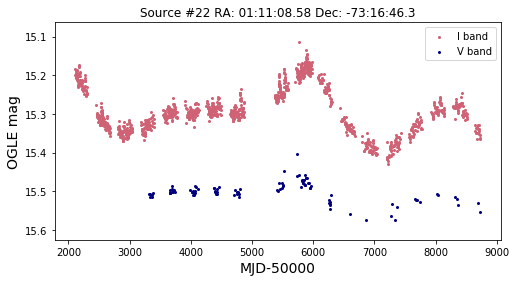

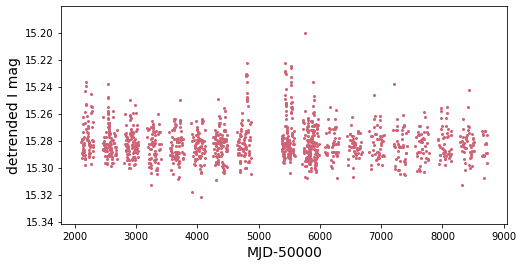

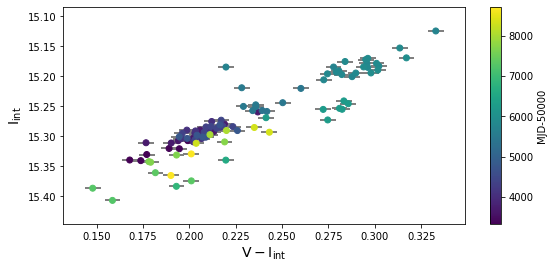

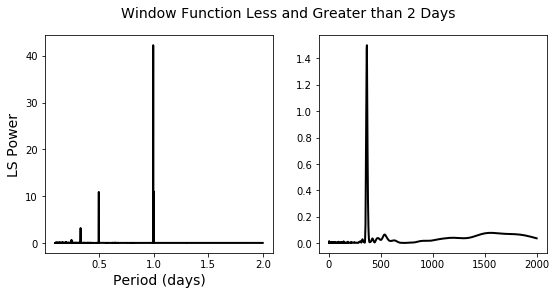

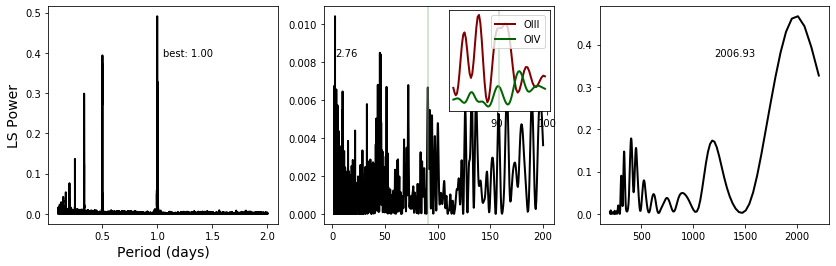

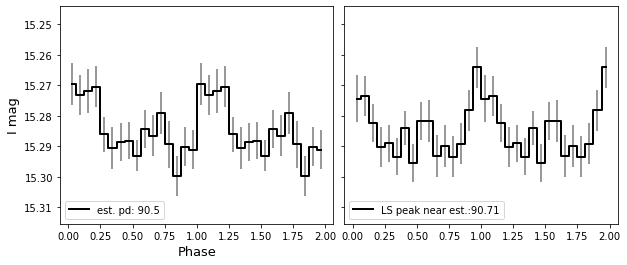

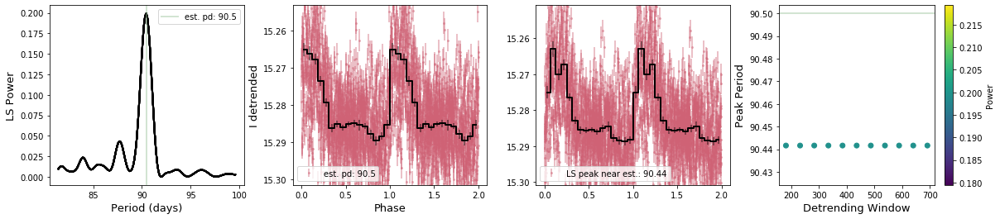

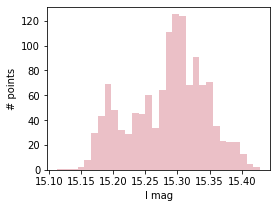

In [26]:
basic(17,pbins=16,saveall=save,window=101)

In [27]:
summ[20:25]

,src_n,ra_deg,dec_deg,spin period,perr,est. period,sep,name,mean I,stdev I,...,V-I transition,Type II amp,note,I skew,I kurtosis,V skew,V kurtosis,best auto det pd,Part,I IQR
20,22,17.785799,-73.279465,31.03,0.73,90.50,0.235025,NaN,15.284734,0.059096,...,NaN,NaN,NaN,-0.275565,-0.613649,0.115542,2.192630,90.441657,1.0,0.082
21,23,13.480083,-72.446030,46.63,0.60,137.36,0.647529,NaN,14.686190,0.093824,...,NaN,NaN,NaN,1.225550,1.478500,2.927194,10.507370,137.916601,1.0,NaN
22,24,13.734498,-72.446460,59.07,0.59,62.10,1.090329,NaN,15.332253,0.177328,...,NaN,NaN,NaN,0.549316,-0.272309,0.336276,-0.858391,60.913413,1.0,NaN
23,25,16.802626,-72.592720,65.78,0.87,110.60,0.295919,NaN,NaN,NaN,...,NaN,NaN,NaN,0.000000,0.000000,0.000000,0.000000,0.000000,1.0,NaN
24,26,12.263891,-72.847824,74.67,0.62,33.38,0.181334,NaN,16.696078,0.048745,...,NaN,NaN,NaN,0.851739,0.250392,1.418296,2.869675,33.406866,1.0,NaN


Source number: 31
RA,Dec (deg): 13.35, -72.454445
Established period: 103.6
NS spin period: 138.0
Separation: 1.1629397680176692
I and V-I correlation: -0.9926580142506026
V and V-I correlation: -0.9549740785369608
Phase-folding with established orbital period and highest peak within five days of that value...
Repeating periodogram and phase-fold after detrending
Window shown in phase-fold: 207


max I band:  16.374
min I band:  15.71
I range:  0.6639999999999979
I stdev:  0.14025190573691002
max V band:  16.287
min V band:  16.008
V range:  0.2789999999999999
V stdev:  0.06042549284753631


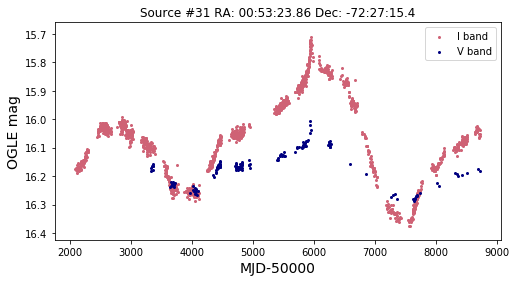

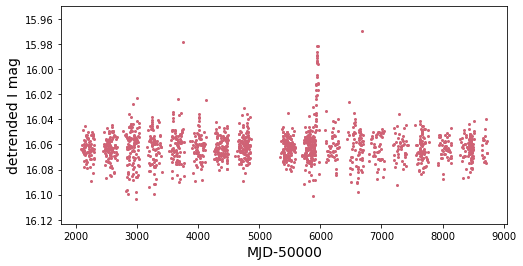

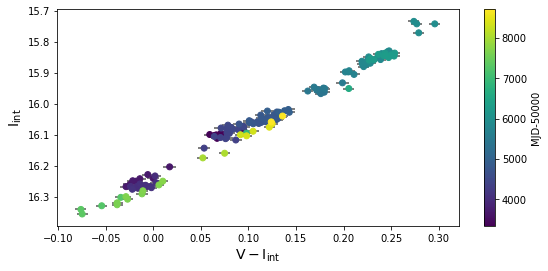

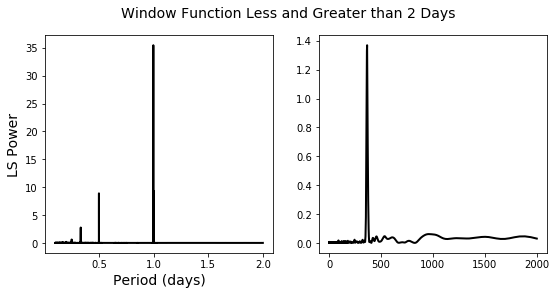

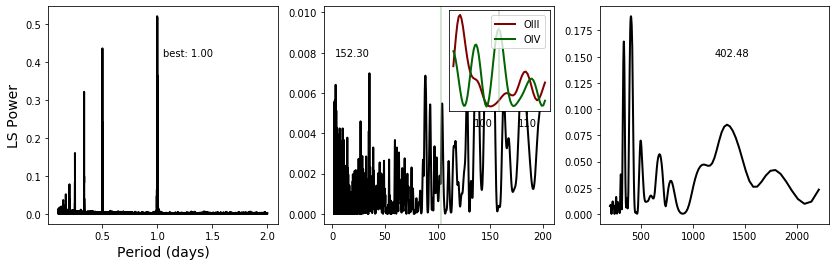

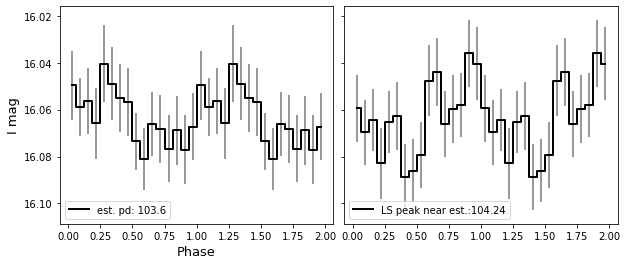

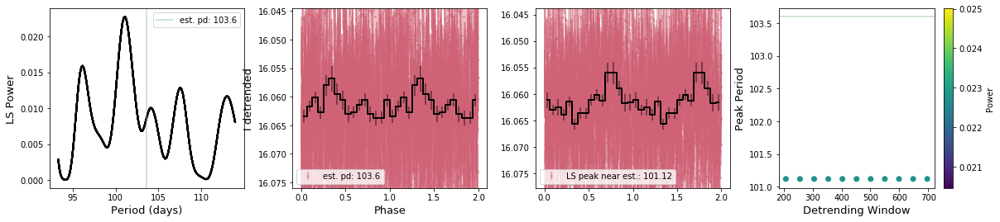

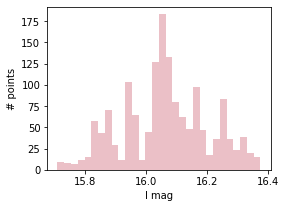

In [28]:
basic(25,pbins=16,window=300,spline=True,saveall=save) #compare to S-G detrending

Source number: 64
RA,Dec (deg): 15.906292, -72.0258
Established period: nan
NS spin period: 1323.0
Separation: 0.3875389193454174
I and V-I correlation: -0.4388904144939015
V and V-I correlation: 0.5195263979783094
using best period from middle periodogram to phase-fold data, after detrending with 701
running periodogram on detrended data


max I band:  14.665
min I band:  14.479
I range:  0.18599999999999994
I stdev:  0.02984407479612393
max V band:  14.727
min V band:  14.562
V range:  0.16500000000000092
V stdev:  0.03415353164324986


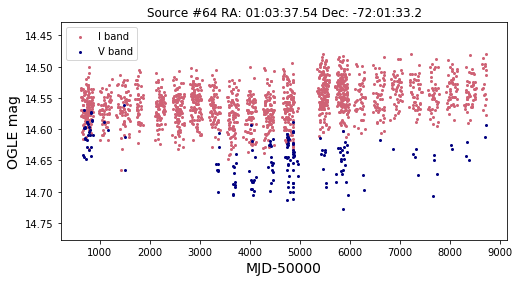

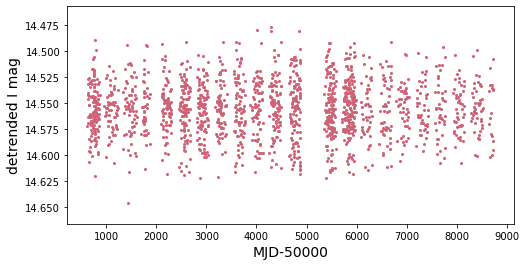

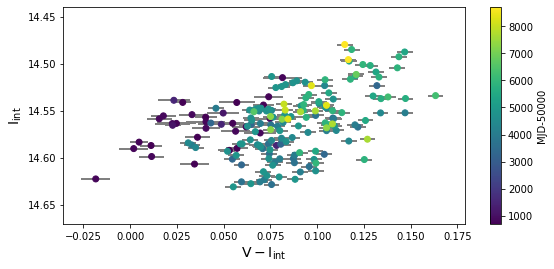

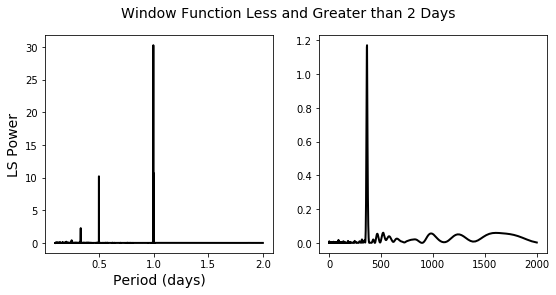

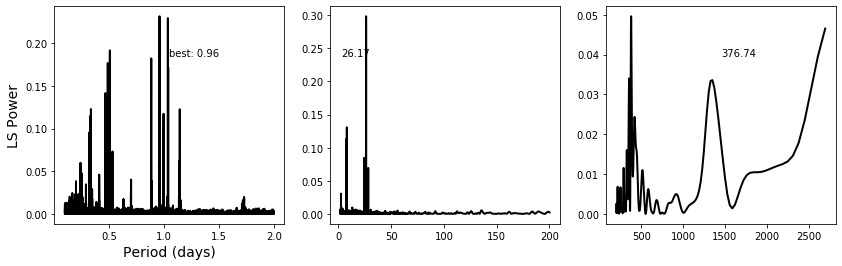

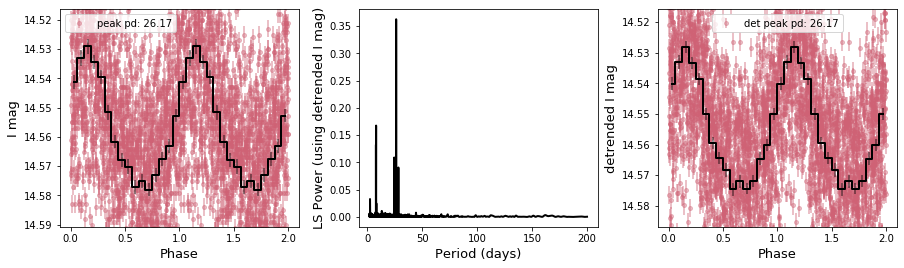

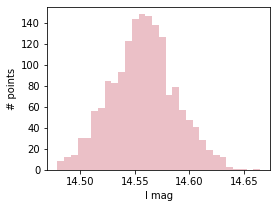

In [31]:
#example of source with no established period
basic(54,pbins=16,saveall=save)

In [32]:
summ[summ['src_n']==64]

,src_n,ra_deg,dec_deg,spin period,perr,est. period,sep,name,mean I,stdev I,...,V-I transition,Type II amp,note,I skew,I kurtosis,V skew,V kurtosis,best auto det pd,Part,I IQR
59,64,15.906292,-72.0258,1323.0,1.1,0.0,0.387539,NaN,14.557341,0.029844,...,NaN,NaN,NaN,0.078377,-0.114025,0.056166,-0.623509,26.170771,1.0,0.039


# Now Go Through Sources in Order
- above are good sort of test cases/random examples
- skip 54,25,17,0

In [33]:
save = True

Source number: 3
RA,Dec (deg): 13.639167, -73.68364
Established period: 18.38
NS spin period: 2.37
Separation: 0.2597014565010407
I and V-I correlation: -0.8002922261337712
V and V-I correlation: -0.6698593996852642
Phase-folding with established orbital period and highest peak within five days of that value...
Repeating periodogram and phase-fold after detrending
Window shown in phase-fold: 37


max I band:  15.687
min I band:  14.528
I range:  1.158999999999999
I stdev:  0.26736930281019916
max V band:  15.313
min V band:  14.724
V range:  0.5890000000000004
V stdev:  0.16383883256098614


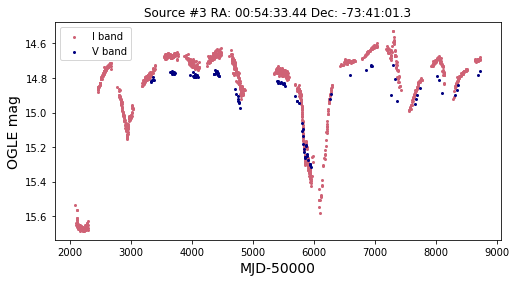

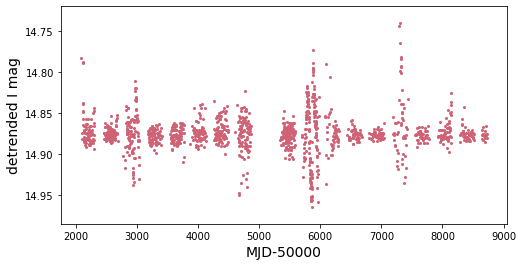

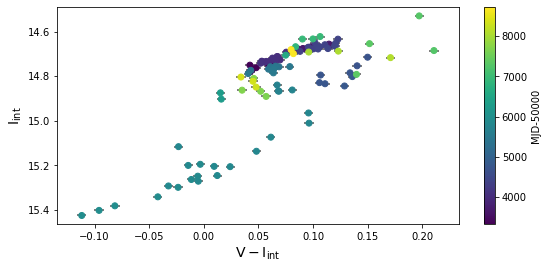

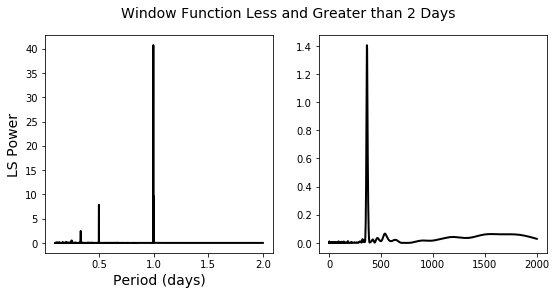

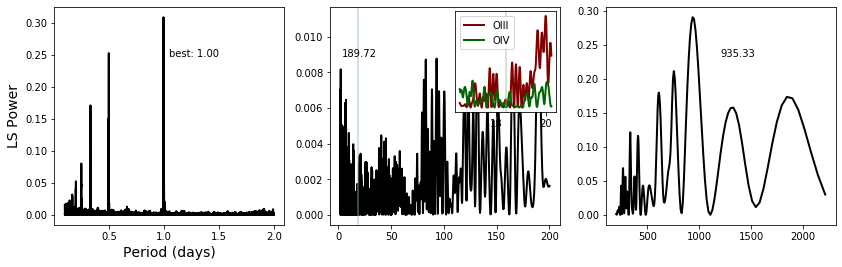

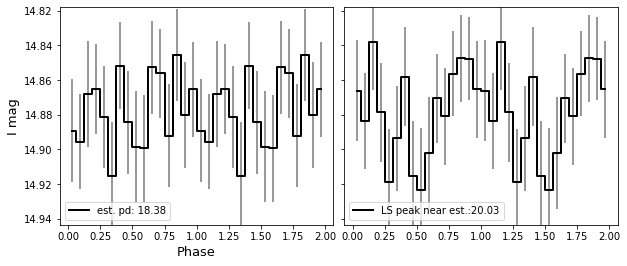

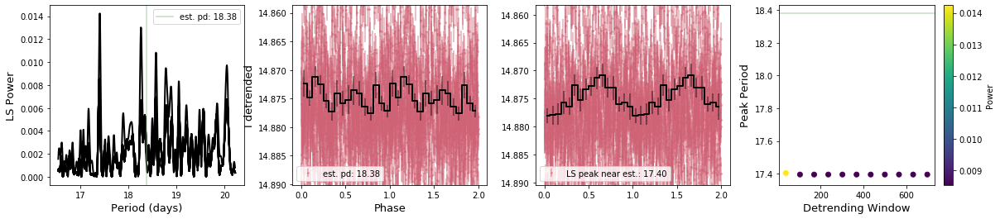

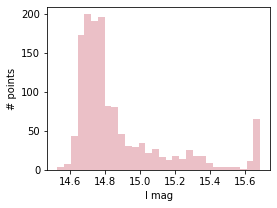

In [34]:
basic(1,pbins=16,saveall=save)

Source number: 4
RA,Dec (deg): 14.797429, -71.64596
Established period: 82.37
NS spin period: 2.763
Separation: nan
I and V-I correlation: -0.883934340856408
V and V-I correlation: 0.6471296353848744
Phase-folding with established orbital period and highest peak within five days of that value...
Repeating periodogram and phase-fold after detrending
Window shown in phase-fold: 165


max I band:  14.05
min I band:  13.857
I range:  0.1930000000000014
I stdev:  0.04226374636920003
max V band:  14.193
min V band:  14.046
V range:  0.14700000000000024
V stdev:  0.030116076714736872


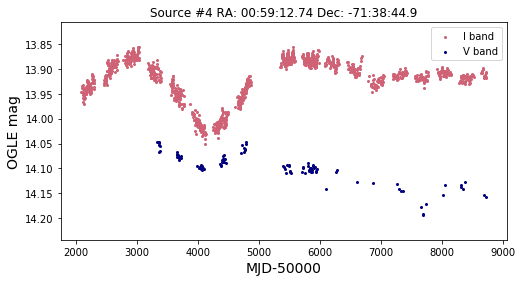

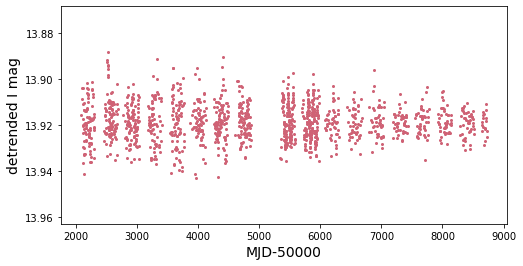

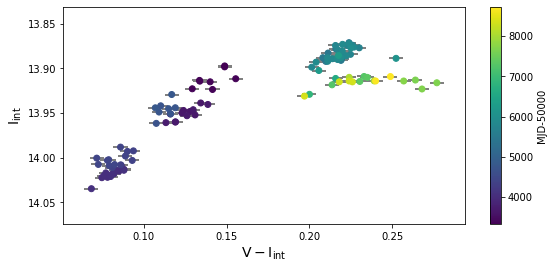

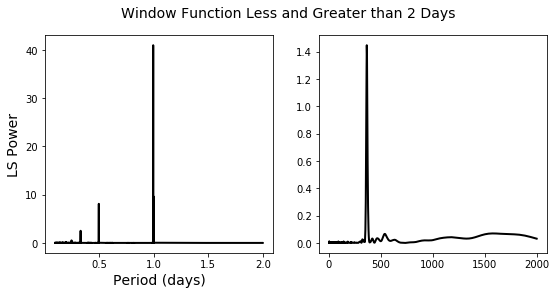

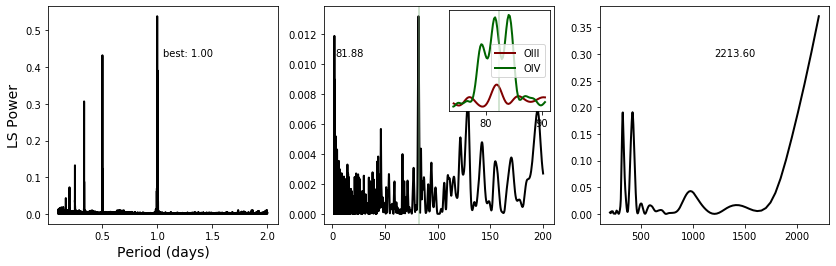

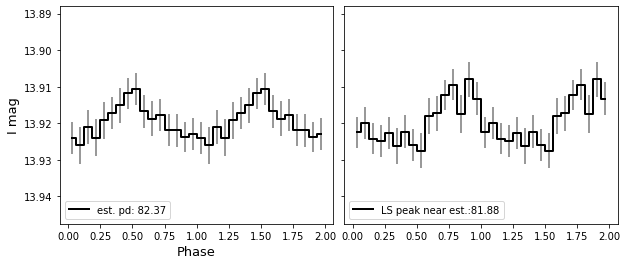

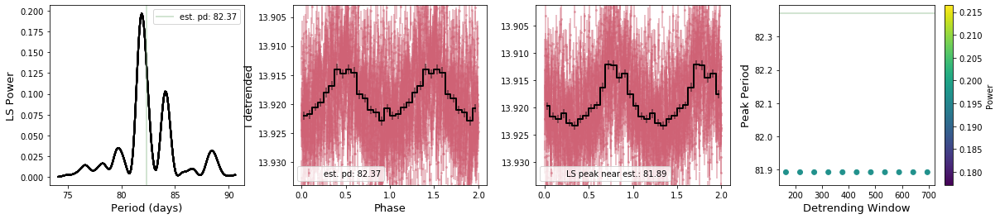

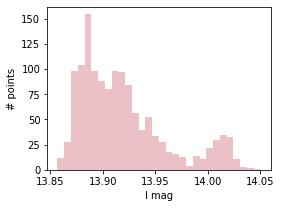

In [35]:
basic(2,pbins=16,saveall=save)

Source number: 5
RA,Dec (deg): 12.91333, -72.28433
Established period: nan
NS spin period: 4.78
Separation: nan
I and V-I correlation: -0.6677821537439047
V and V-I correlation: 0.17975703286765632
using best period from middle periodogram to phase-fold data, after detrending with 701
running periodogram on detrended data


max I band:  15.663
min I band:  15.388
I range:  0.27500000000000036
I stdev:  0.04474693458278388
max V band:  15.742
min V band:  15.626
V range:  0.11600000000000144
V stdev:  0.02089110998022684


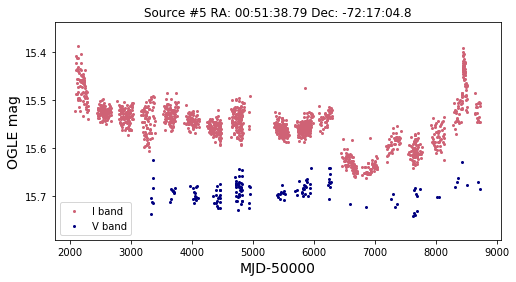

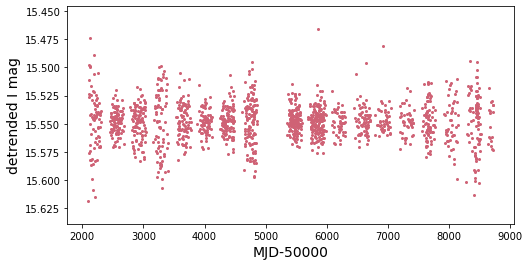

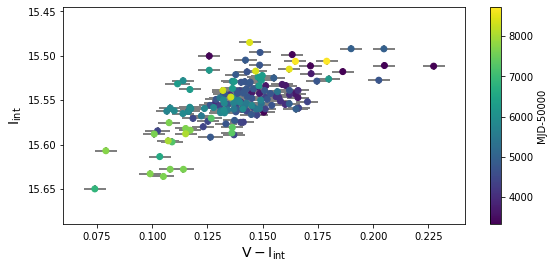

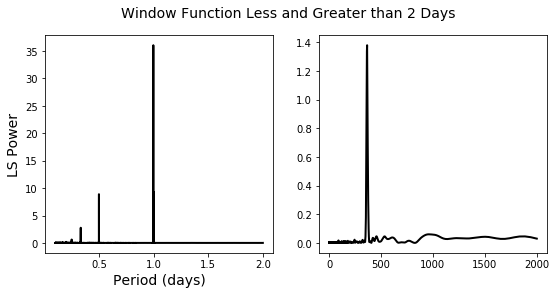

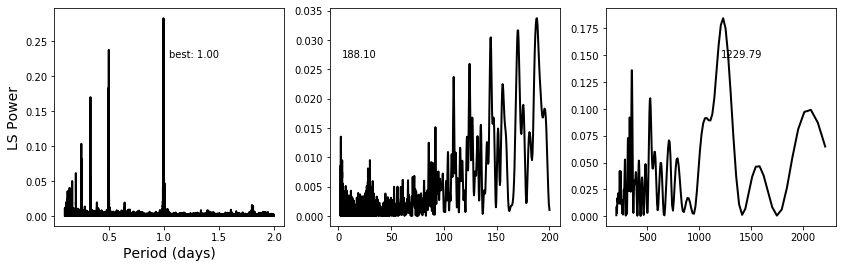

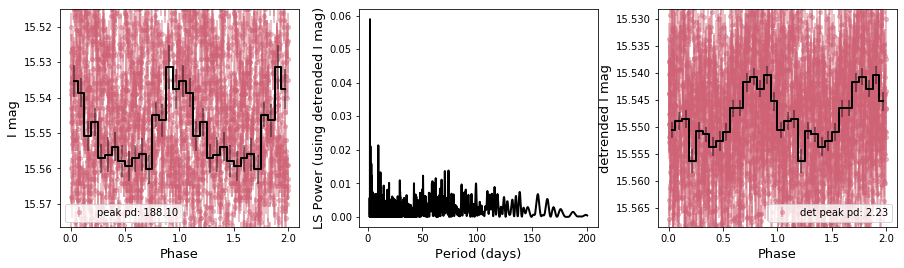

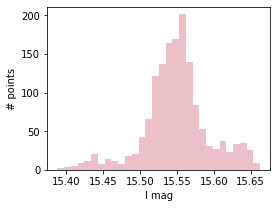

In [36]:
basic(3,pbins=16,saveall=save)

Source number: 6
RA,Dec (deg): 14.259583, -72.43188
Established period: 17.2
NS spin period: 5.05
Separation: 0.9025146211539117
I and V-I correlation: -0.7854401757019701
V and V-I correlation: -0.44726007362846626
Phase-folding with established orbital period and highest peak within five days of that value...
Repeating periodogram and phase-fold after detrending
Window shown in phase-fold: 35


max I band:  16.044
min I band:  15.609
I range:  0.4350000000000005
I stdev:  0.09515404772954368
max V band:  16.065
min V band:  15.77
V range:  0.2950000000000017
V stdev:  0.07522227055363925


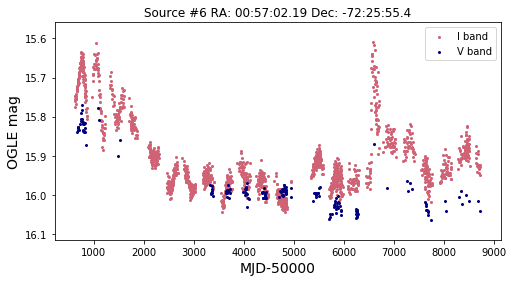

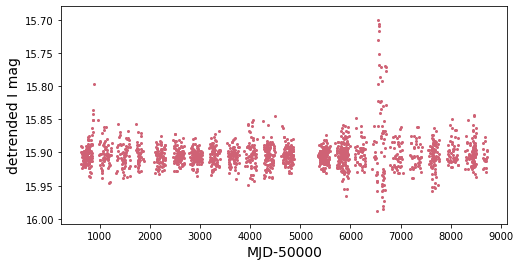

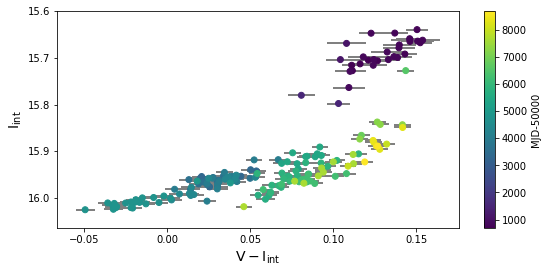

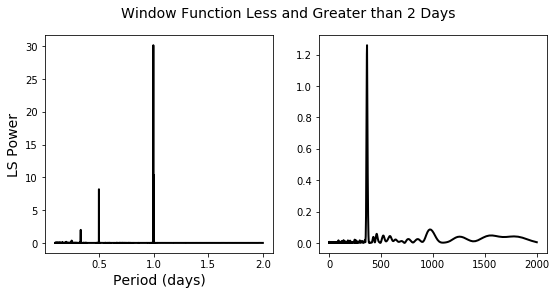

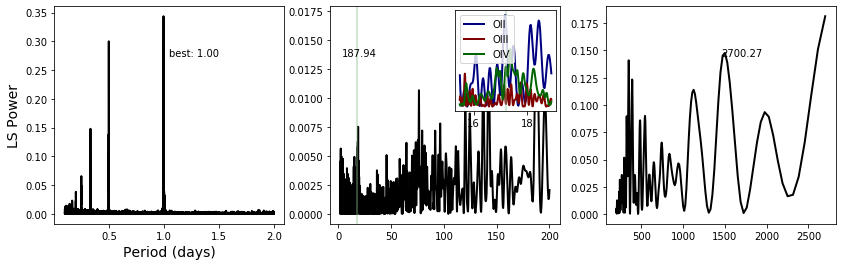

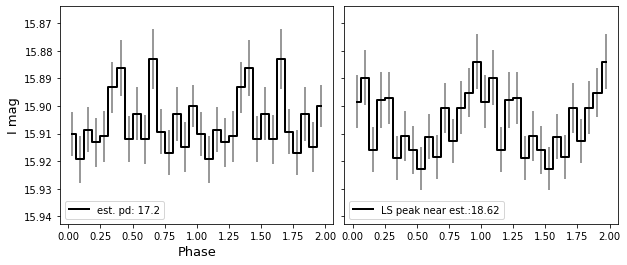

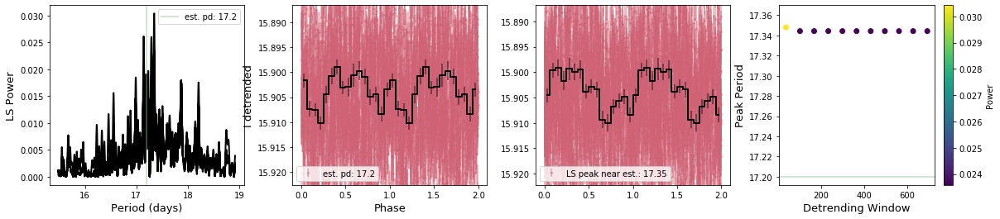

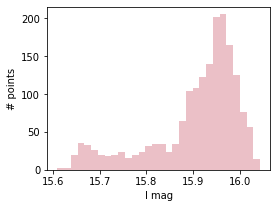

In [37]:
basic(4,pbins=16,saveall=save)

Source number: 7
RA,Dec (deg): 15.722455, -72.74299
Established period: 21.9
NS spin period: 6.85
Separation: 0.42128292815575763
I and V-I correlation: -0.9670343623561133
V and V-I correlation: -0.9225217209125162
Phase-folding with established orbital period and highest peak within five days of that value...
Repeating periodogram and phase-fold after detrending
Window shown in phase-fold: 43


max I band:  15.352
min I band:  14.471
I range:  0.8810000000000002
I stdev:  0.21999887544928126
max V band:  15.096
min V band:  14.578
V range:  0.5180000000000007
V stdev:  0.14997190629598203


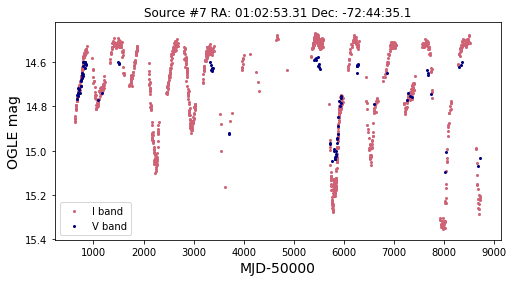

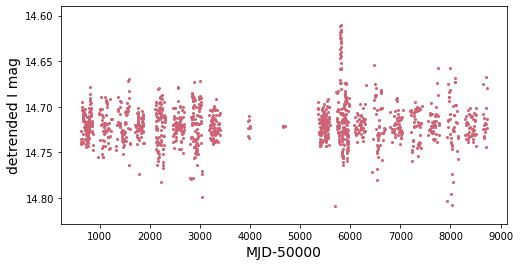

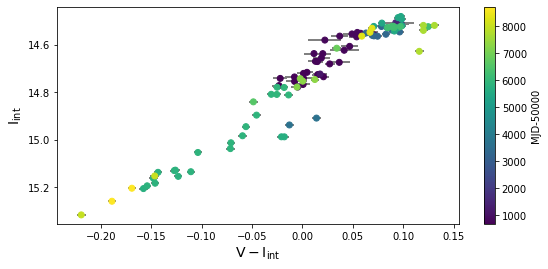

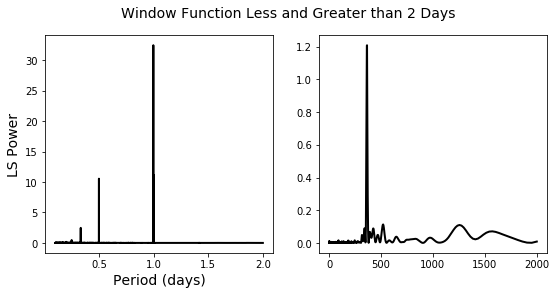

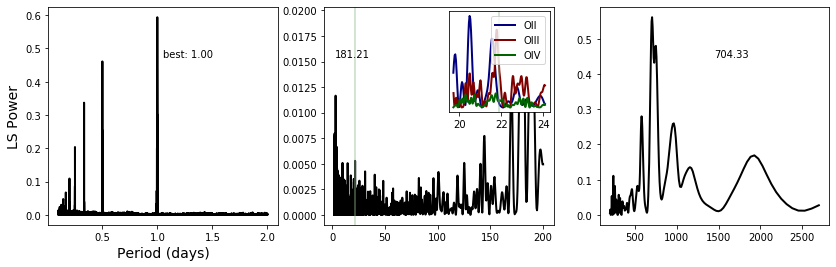

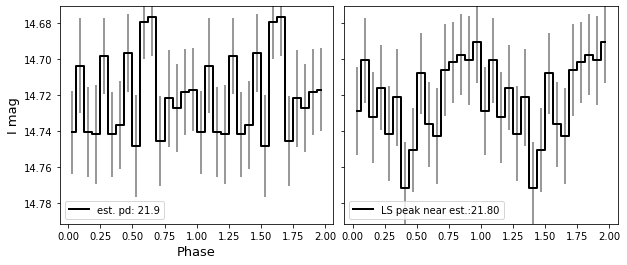

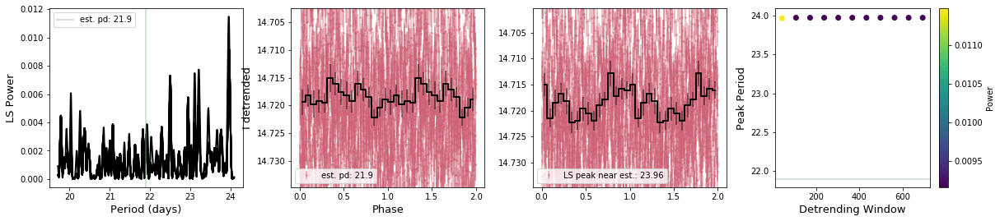

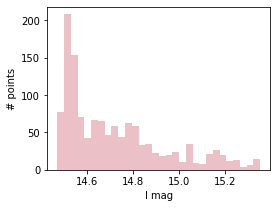

In [38]:
basic(5,pbins=16,saveall=save) 

Source number: 9
RA,Dec (deg): 13.02375, -72.43445
Established period: 44.92
NS spin period: 7.78
Separation: 0.1368248900378205
I and V-I correlation: -0.667340526448103
V and V-I correlation: -0.39477937412506486
Phase-folding with established orbital period and highest peak within five days of that value...
Repeating periodogram and phase-fold after detrending
Window shown in phase-fold: 89


max I band:  14.987
min I band:  14.415
I range:  0.572000000000001
I stdev:  0.06365301931505729
max V band:  15.144
min V band:  14.653
V range:  0.49099999999999966
V stdev:  0.05908053462518116


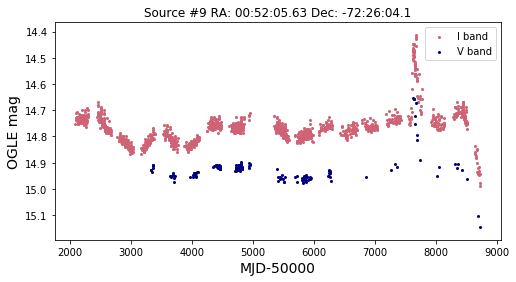

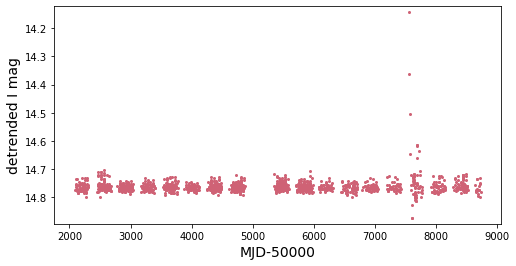

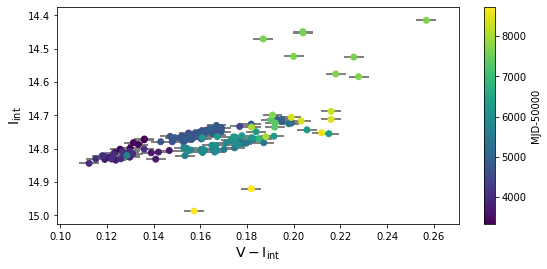

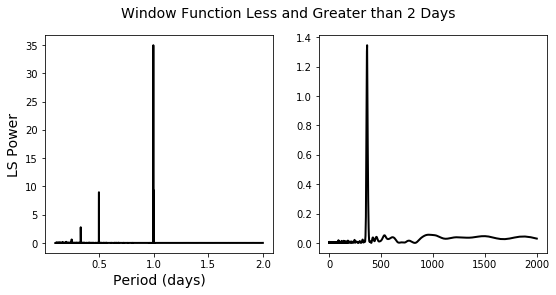

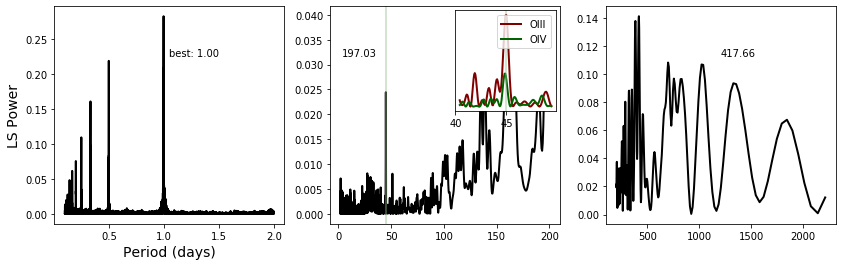

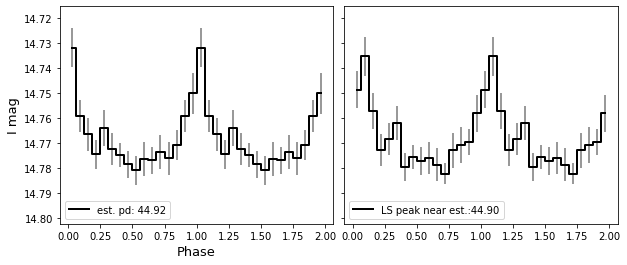

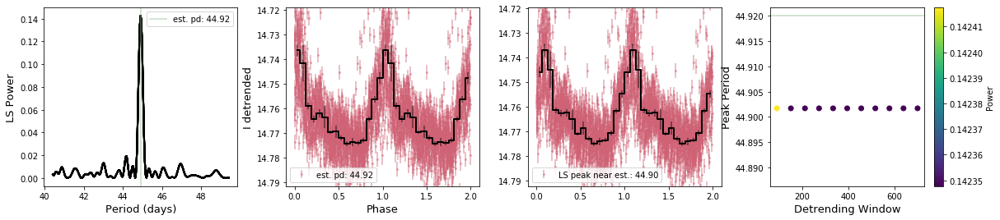

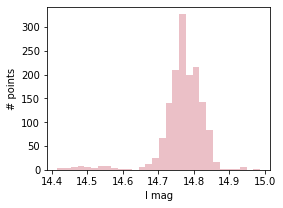

In [39]:
basic(6,pbins=16,saveall=save) 

Source number: 10
RA,Dec (deg): 14.493333, -72.37486
Established period: 40.03
NS spin period: 7.92
Separation: 1.2145301423329555
I and V-I correlation: -0.6832617411444406
V and V-I correlation: 0.7737722449334529
Phase-folding with established orbital period and highest peak within five days of that value...
Repeating periodogram and phase-fold after detrending
Window shown in phase-fold: 81


max I band:  16.053
min I band:  15.536
I range:  0.5170000000000012
I stdev:  0.06068029889096733
max V band:  15.973
min V band:  15.687
V range:  0.28600000000000136
V stdev:  0.06012007025959454


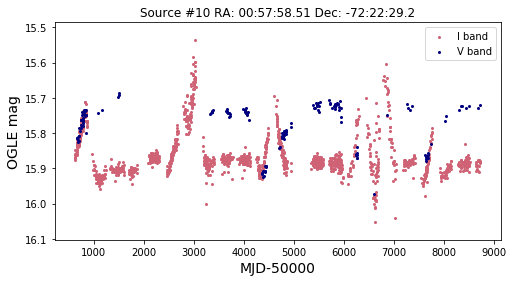

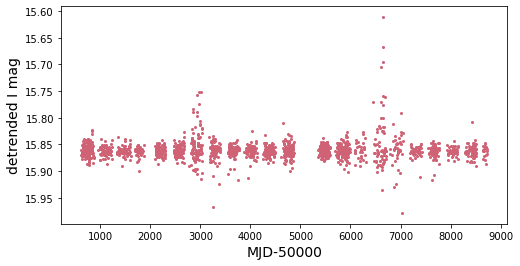

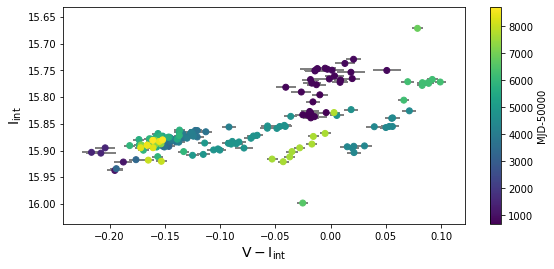

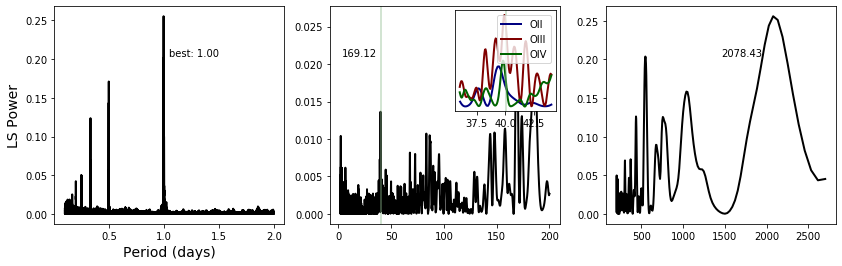

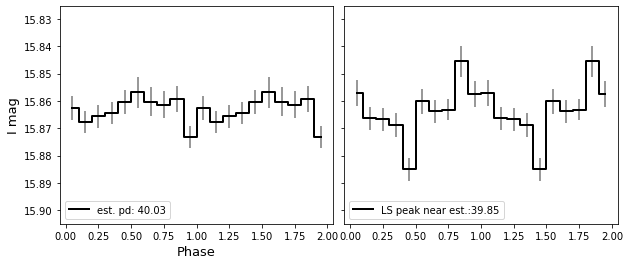

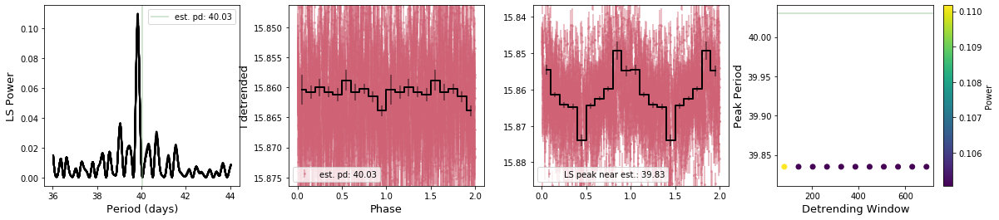

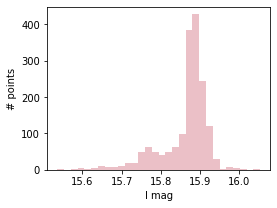

In [40]:
basic(7,pbins=10,saveall=save,window=300) 

Source number: 11
RA,Dec (deg): 12.971667, -72.53
Established period: 28.51
NS spin period: 8.9
Separation: 0.522346798389768
I and V-I correlation: -0.6772792774073827
V and V-I correlation: -0.42451937262899136
Phase-folding with established orbital period and highest peak within five days of that value...
Repeating periodogram and phase-fold after detrending
Window shown in phase-fold: 57


max I band:  15.304
min I band:  14.341
I range:  0.963000000000001
I stdev:  0.3037076832880229
max V band:  15.295
min V band:  14.411
V range:  0.8840000000000003
V stdev:  0.23600339965440648


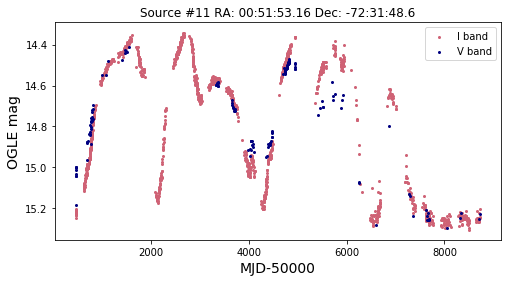

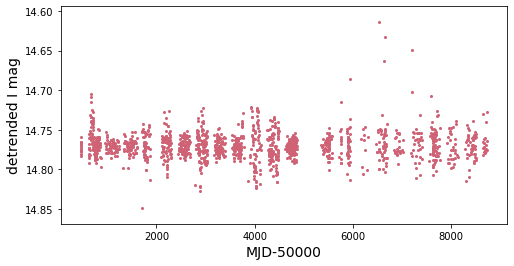

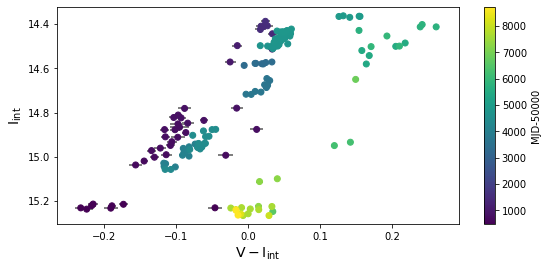

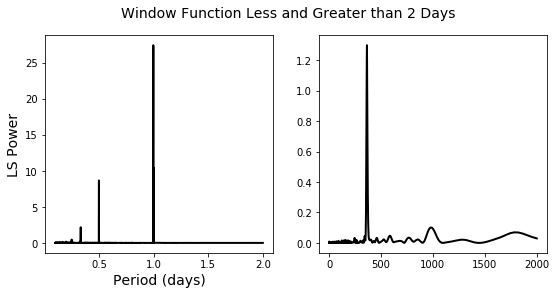

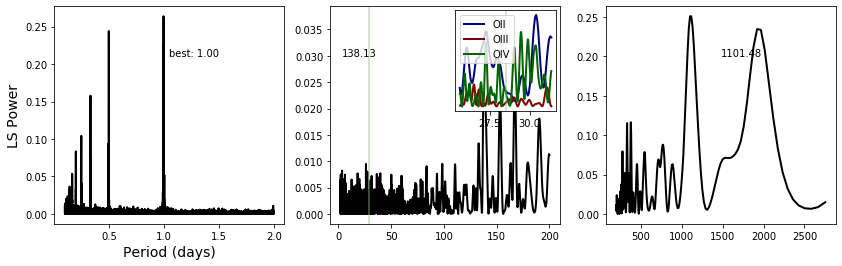

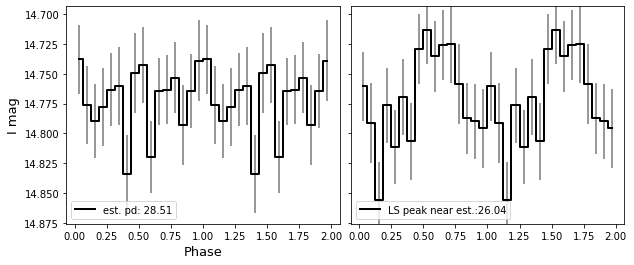

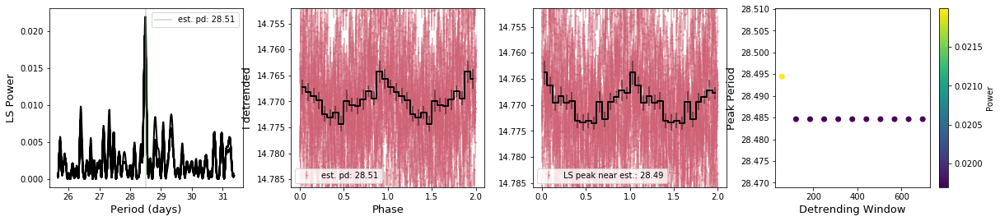

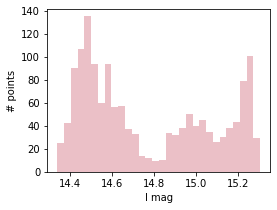

In [41]:
basic(8,pbins=16,saveall=save) 

Source number: 12
RA,Dec (deg): 12.327084, -73.20028
Established period: 77.2
NS spin period: 9.13
Separation: nan
I and V-I correlation: -0.932428467980274
V and V-I correlation: -0.2515816687525331
Phase-folding with established orbital period and highest peak within five days of that value...
Repeating periodogram and phase-fold after detrending
Window shown in phase-fold: 155


max I band:  16.469
min I band:  16.012
I range:  0.45700000000000074
I stdev:  0.08472090375763396
max V band:  16.59
min V band:  16.431
V range:  0.15899999999999892
V stdev:  0.031157660911993436


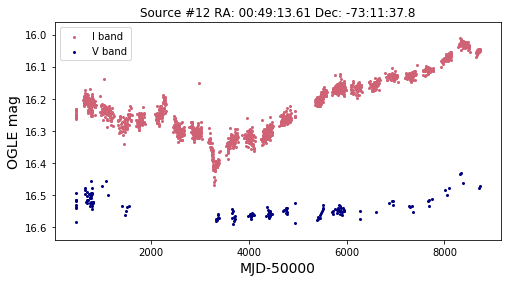

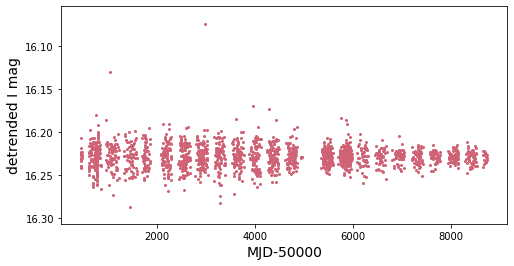

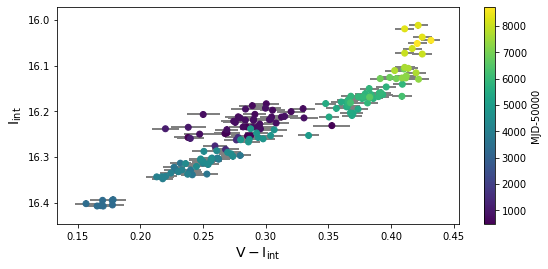

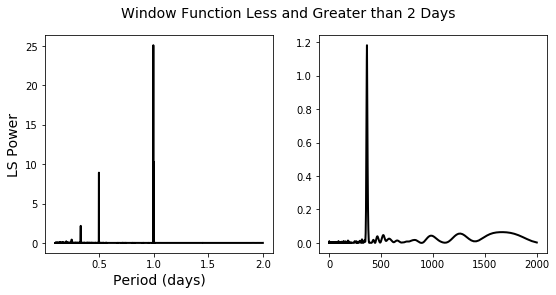

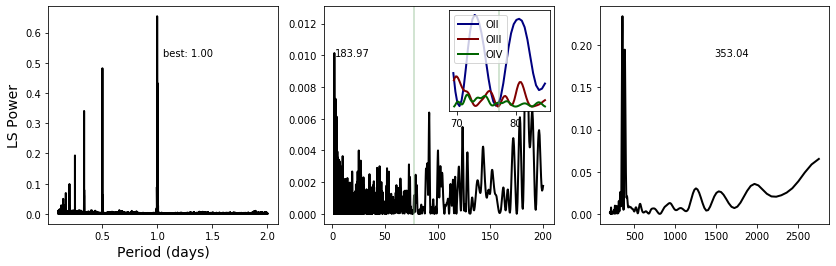

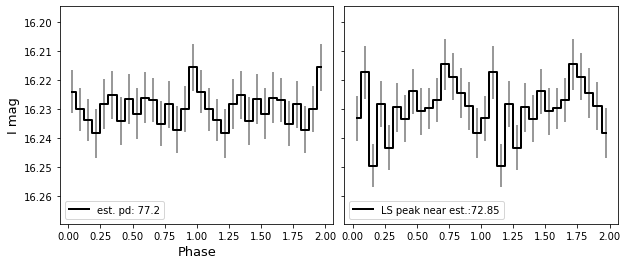

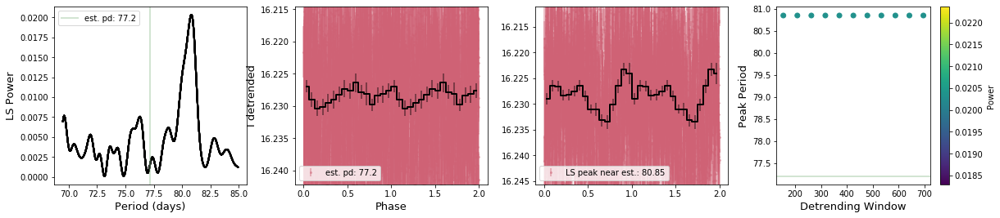

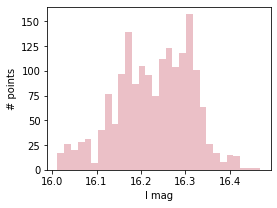

In [42]:
basic(9,pbins=16,saveall=save) 

Source number: 13
RA,Dec (deg): 16.176208, -72.90122
Established period: 36.3
NS spin period: 11.48
Separation: 0.5302892172750988
I and V-I correlation: -0.9222358982634402
V and V-I correlation: -0.8022991122992864
Phase-folding with established orbital period and highest peak within five days of that value...
Repeating periodogram and phase-fold after detrending
Window shown in phase-fold: 73


max I band:  15.844
min I band:  14.757
I range:  1.0869999999999997
I stdev:  0.26565631227298286
max V band:  15.569
min V band:  14.939
V range:  0.6300000000000008
V stdev:  0.1934910380070535


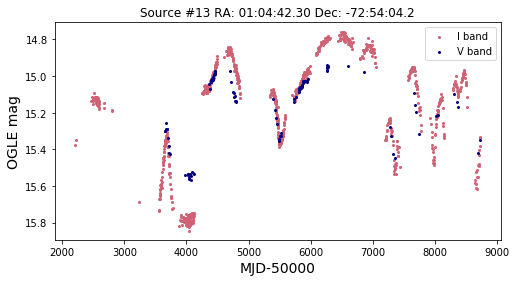

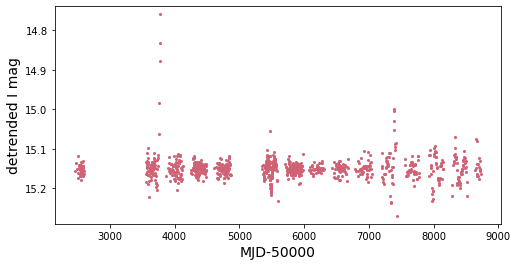

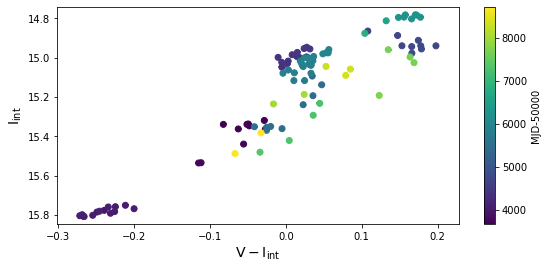

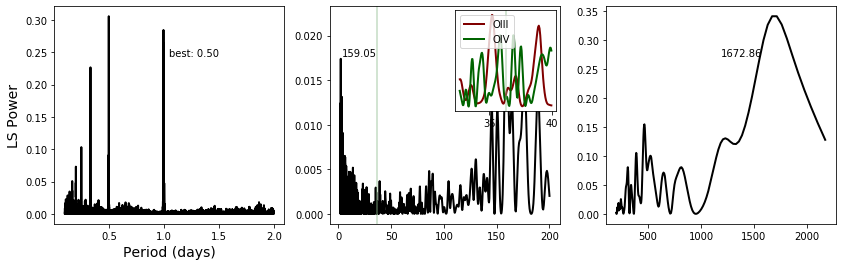

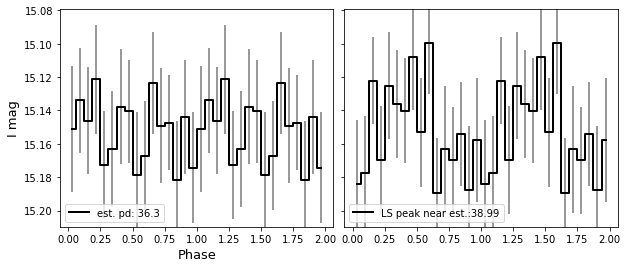

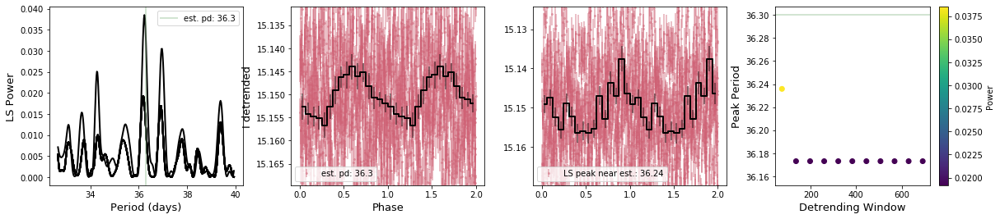

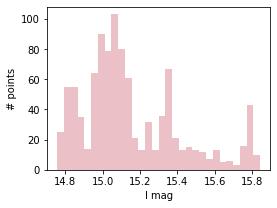

In [43]:
basic(10,pbins=16,saveall=save) 

Source number: 14
RA,Dec (deg): 29.316668, -72.97578
Established period: 35.6
NS spin period: 11.58
Separation: nan
I and V-I correlation: -0.9592415376392872
V and V-I correlation: -0.8788071255321857
Phase-folding with established orbital period and highest peak within five days of that value...
Repeating periodogram and phase-fold after detrending
Window shown in phase-fold: 133


max I band:  15.335
min I band:  14.338
I range:  0.9970000000000017
I stdev:  0.31485138419293546
max V band:  14.934
min V band:  14.387
V range:  0.5469999999999988
V stdev:  0.13211687979648618


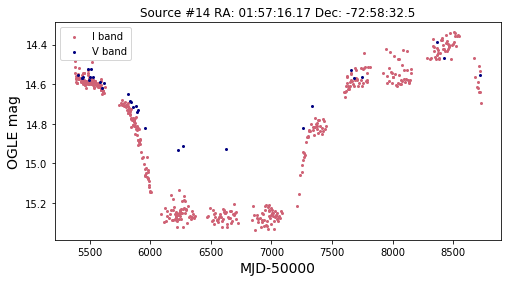

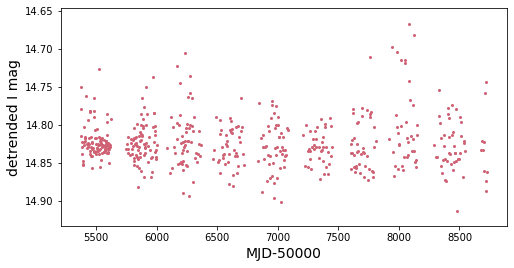

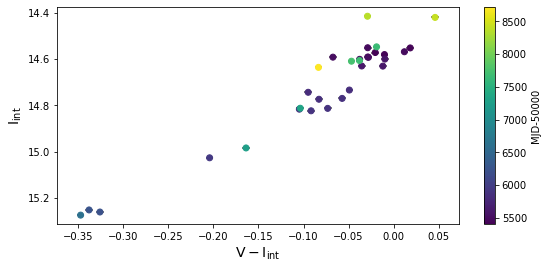

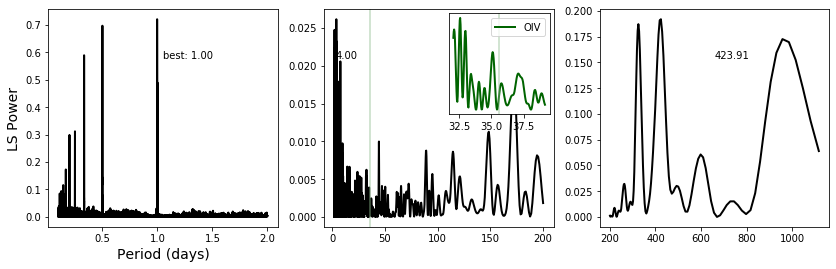

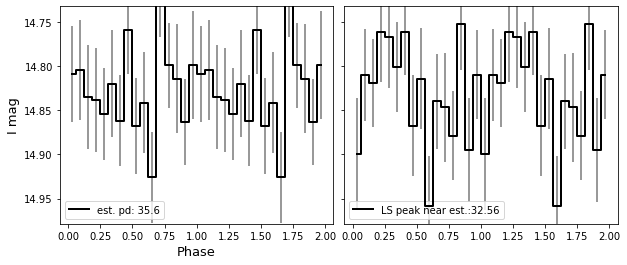

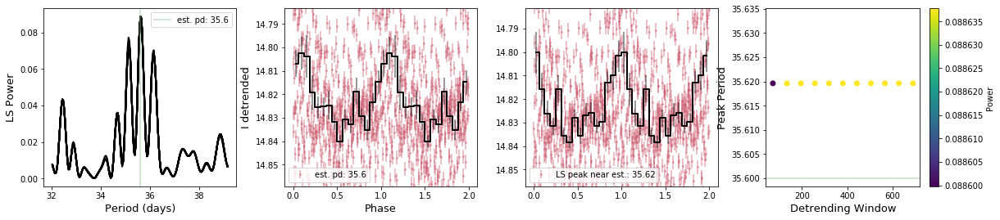

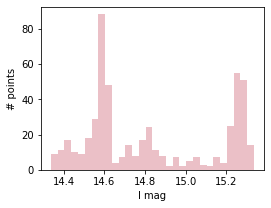

In [44]:
basic(11,pbins=16,saveall=save) 

Source number: 15
RA,Dec (deg): 12.058422, -73.367744
Established period: nan
NS spin period: 11.866
Separation: 0.9467066151201687
I and V-I correlation: -0.9372414483256165
V and V-I correlation: -0.8515095648198383
using best period from middle periodogram to phase-fold data, after detrending with 701
running periodogram on detrended data


max I band:  15.326
min I band:  14.341
I range:  0.9850000000000012
I stdev:  0.3014267833367876
max V band:  15.143
min V band:  14.436
V range:  0.7070000000000007
V stdev:  0.21919824034747304


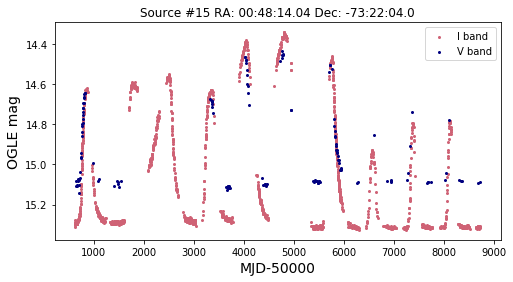

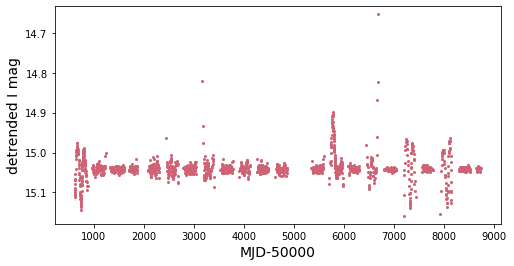

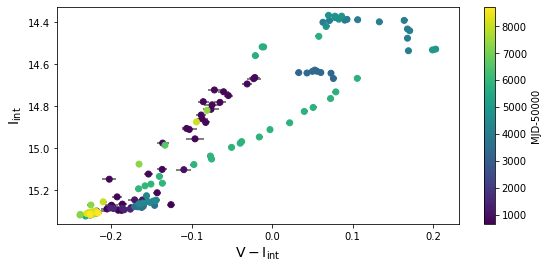

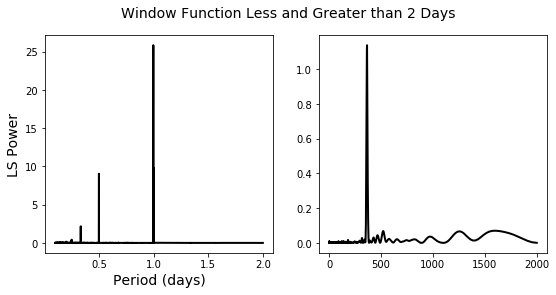

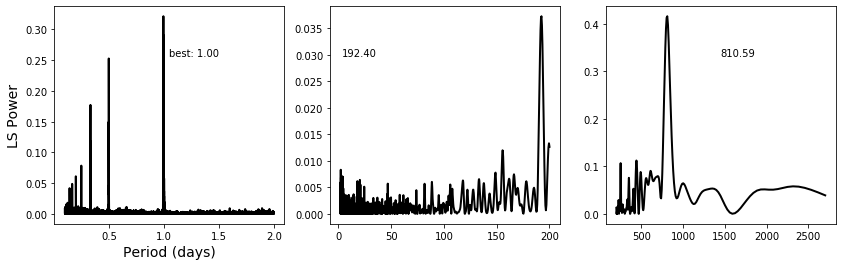

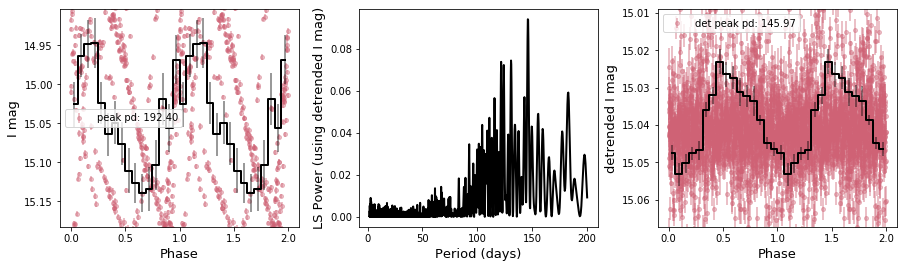

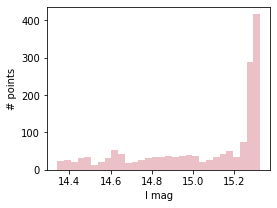

In [45]:
basic(12,pbins=16,saveall=save) 

Source number: 16
RA,Dec (deg): 13.058333, -73.32166
Established period: 74.51
NS spin period: 15.3
Separation: 0.3576915031662127
I and V-I correlation: -0.28392614544546685
V and V-I correlation: 0.1227097449647219
Phase-folding with established orbital period and highest peak within five days of that value...
Repeating periodogram and phase-fold after detrending
Window shown in phase-fold: 149


max I band:  15.035
min I band:  14.325
I range:  0.7100000000000009
I stdev:  0.17032282634135576
max V band:  15.16
min V band:  14.566
V range:  0.5939999999999994
V stdev:  0.17329854894564659


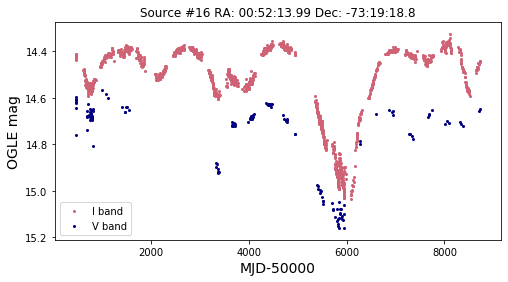

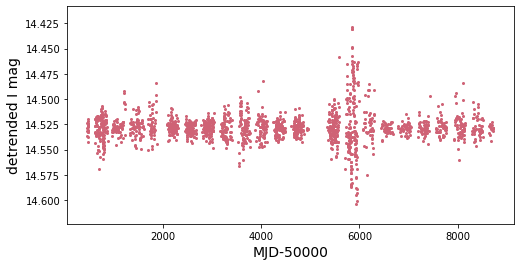

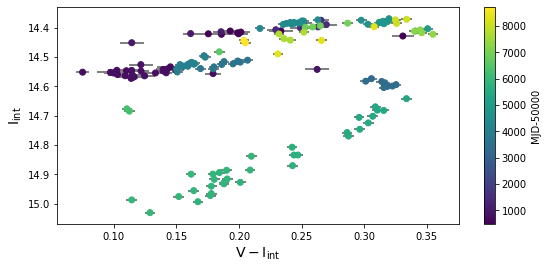

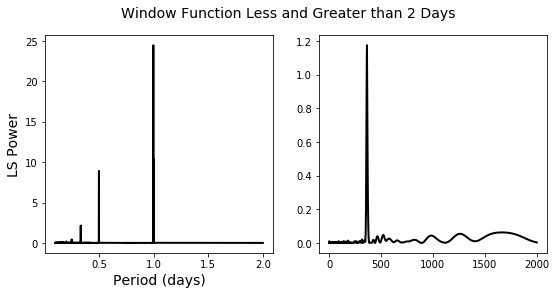

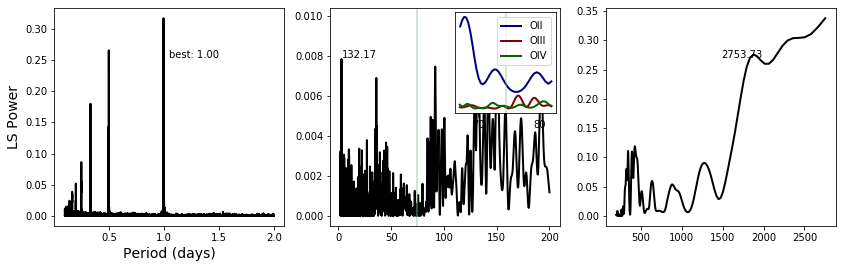

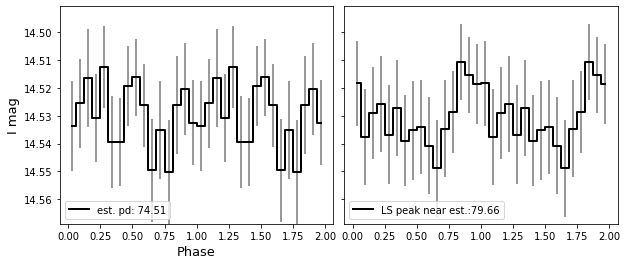

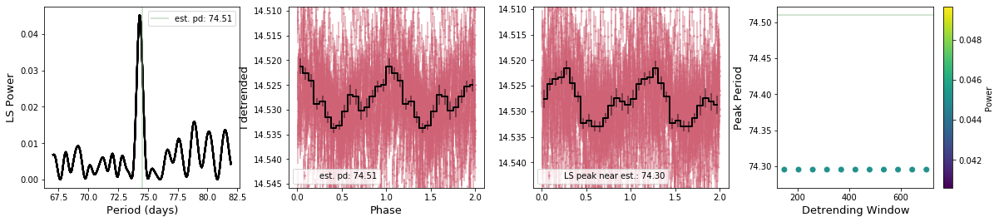

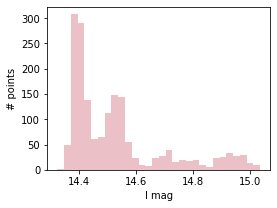

In [46]:
basic(13,pbins=16,saveall=save) 

Source number: 17
RA,Dec (deg): 12.23147, -73.82957
Established period: 36.43182
NS spin period: 15.64
Separation: 1.5997877936106613
I and V-I correlation: -0.9743333607524376
V and V-I correlation: -0.9241167283255649
Phase-folding with established orbital period and highest peak within five days of that value...
Repeating periodogram and phase-fold after detrending
Window shown in phase-fold: 73


max I band:  15.427
min I band:  14.462
I range:  0.9649999999999999
I stdev:  0.1689797049980143
max V band:  15.204
min V band:  14.722
V range:  0.4820000000000011
V stdev:  0.10559068452767831


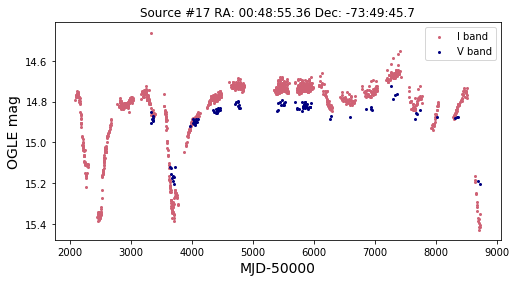

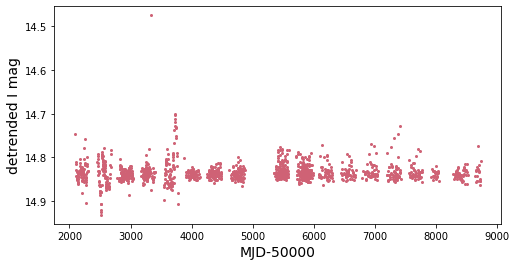

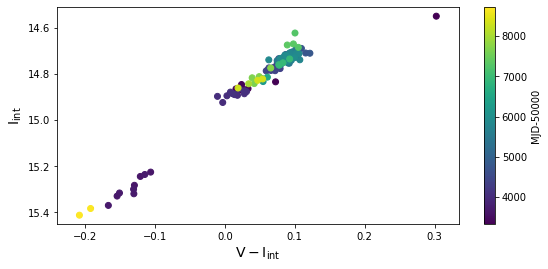

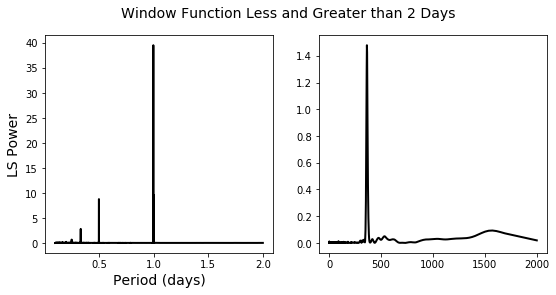

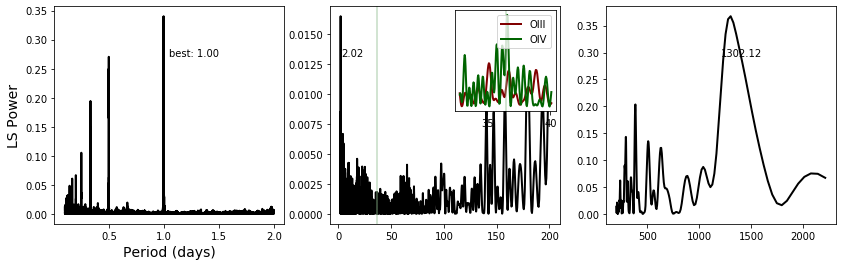

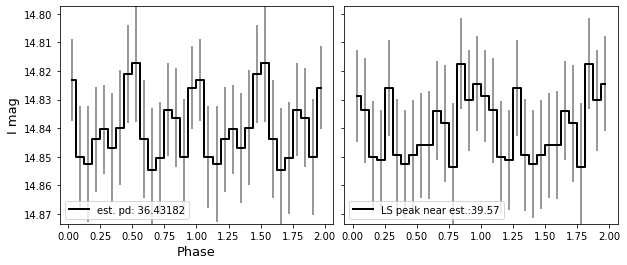

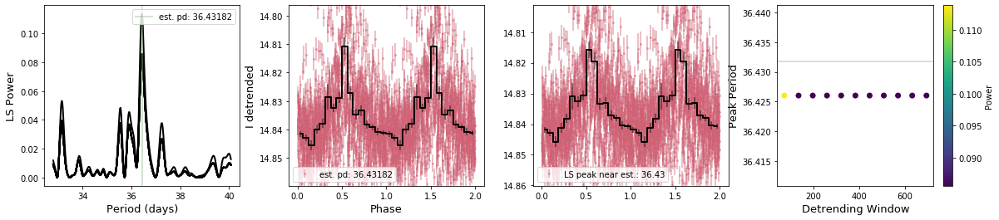

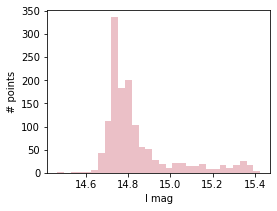

In [47]:
basic(14,pbins=16,saveall=save) 

Source number: 20
RA,Dec (deg): 19.41848, -73.51407
Established period: 75.97
NS spin period: 22.07
Separation: 1.3035255870924656
I and V-I correlation: -0.8705120488367663
V and V-I correlation: -0.42919278651818193
Phase-folding with established orbital period and highest peak within five days of that value...
Repeating periodogram and phase-fold after detrending
Window shown in phase-fold: 151


max I band:  14.189
min I band:  13.987
I range:  0.20199999999999996
I stdev:  0.040006482402392504
max V band:  14.253
min V band:  14.191
V range:  0.06199999999999939
V stdev:  0.015276815480066213


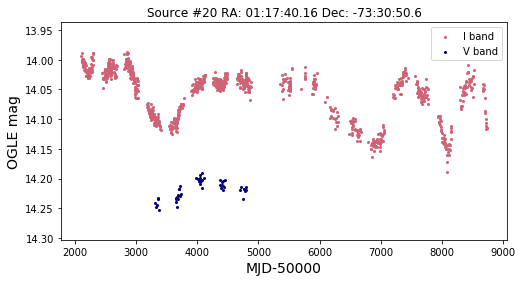

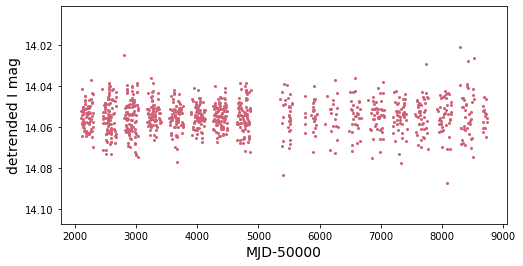

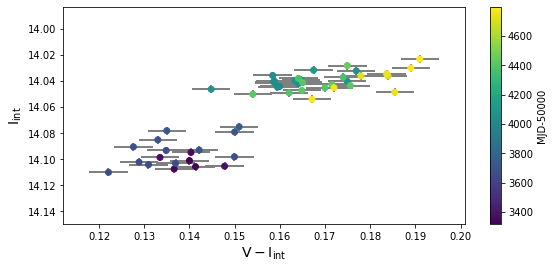

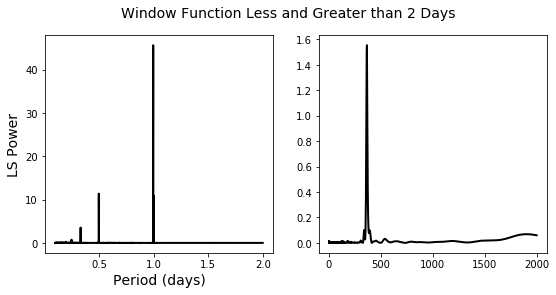

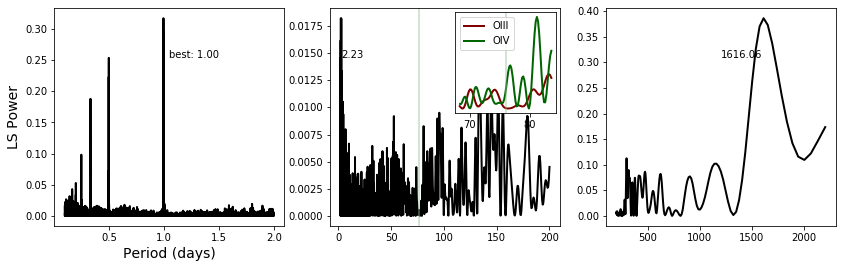

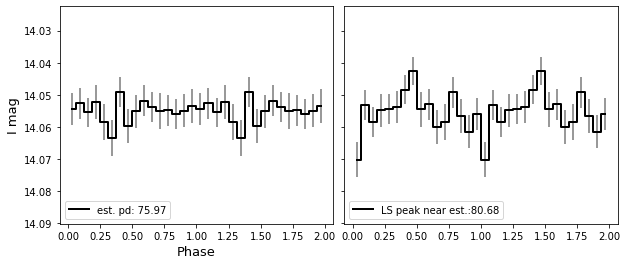

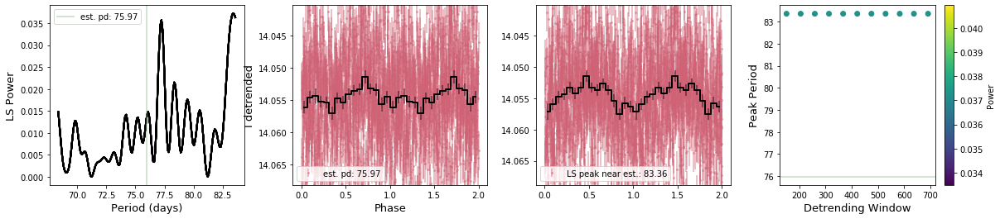

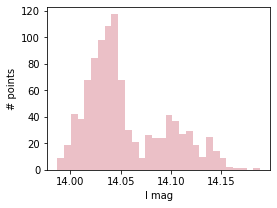

In [48]:
basic(15,pbins=16,saveall=save) 

Source number: 21
RA,Dec (deg): 12.0591135, -73.16776
Established period: 22.5
NS spin period: 25.55
Separation: 0.3827734346044463
I and V-I correlation: 0.6742002022243393
V and V-I correlation: 0.8736934128945111
Phase-folding with established orbital period and highest peak within five days of that value...
Repeating periodogram and phase-fold after detrending
Window shown in phase-fold: 45


max I band:  15.931
min I band:  15.511
I range:  0.41999999999999993
I stdev:  0.08437130342459512
max V band:  16.088
min V band:  15.599
V range:  0.48900000000000077
V stdev:  0.12681425717253644


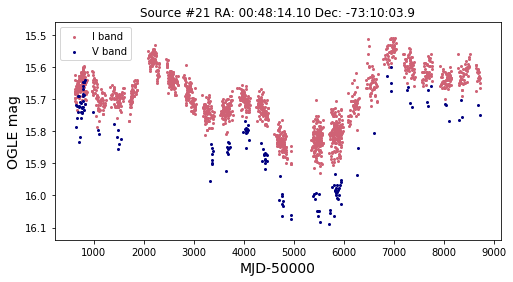

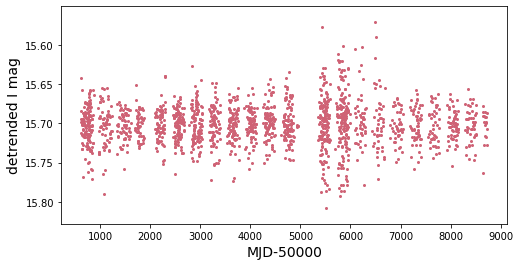

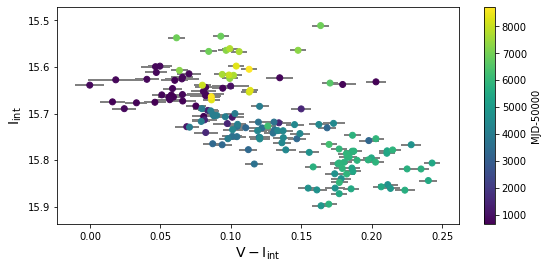

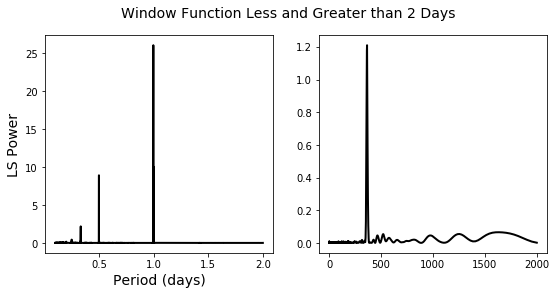

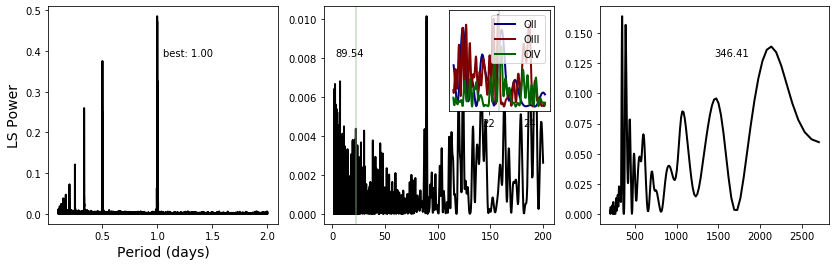

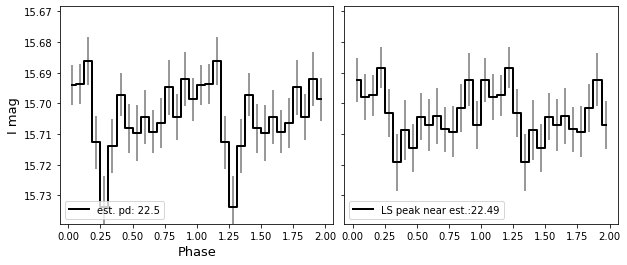

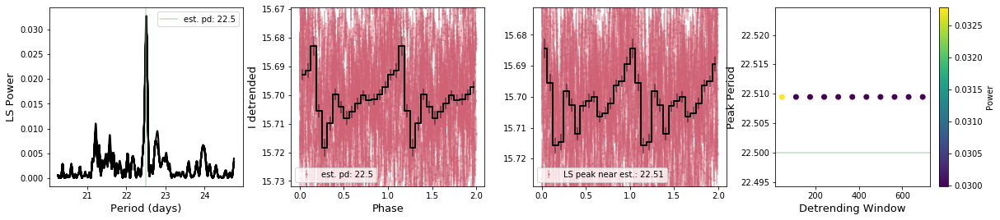

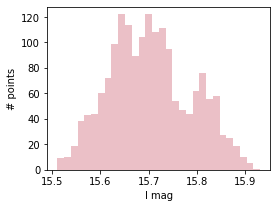

In [49]:
basic(16,pbins=16,saveall=save) 

Source number: 23
RA,Dec (deg): 13.480083, -72.44603
Established period: 137.36
NS spin period: 46.63
Separation: 0.6475291035939916
I and V-I correlation: -0.9273513917435414
V and V-I correlation: -0.8016300560930327
Phase-folding with established orbital period and highest peak within five days of that value...
Repeating periodogram and phase-fold after detrending
Window shown in phase-fold: 275


max I band:  15.038
min I band:  14.489
I range:  0.5489999999999995
I stdev:  0.09382432234945837
max V band:  15.041
min V band:  14.712
V range:  0.3290000000000006
V stdev:  0.05706732455276843


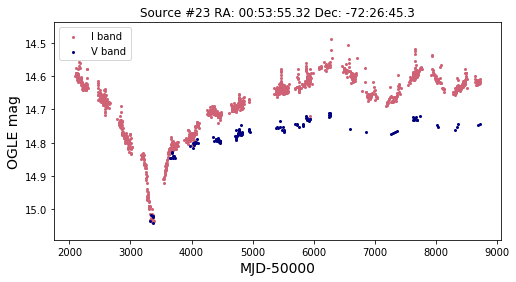

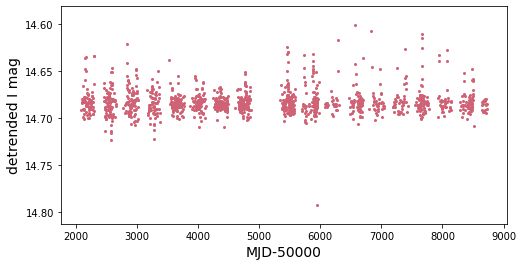

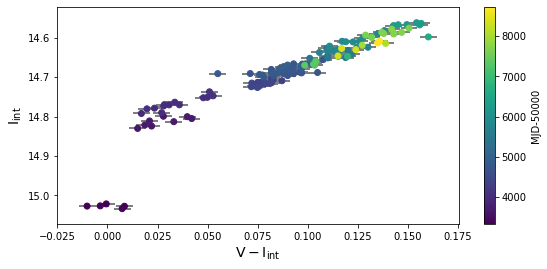

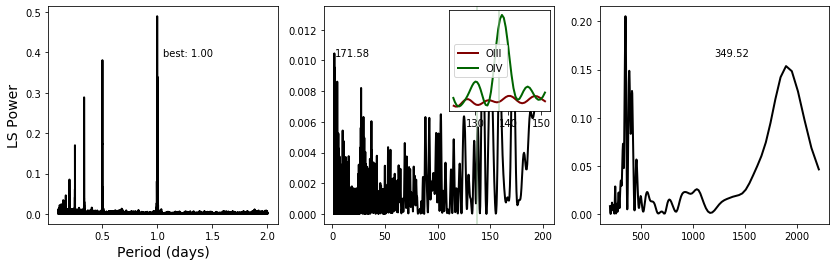

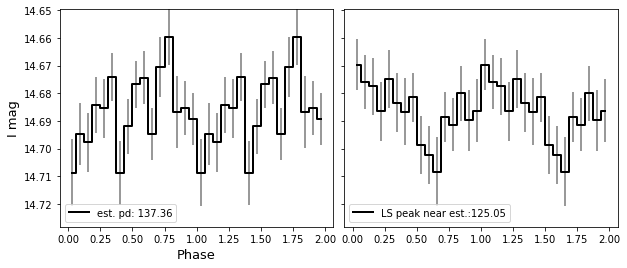

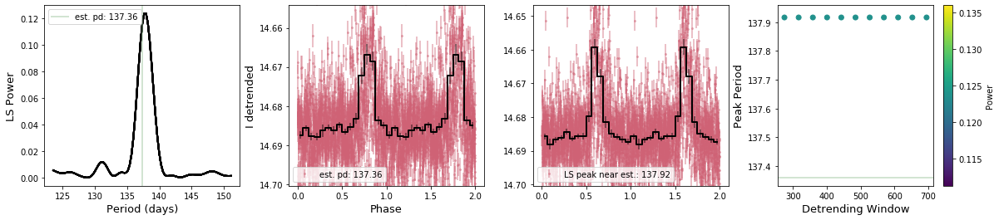

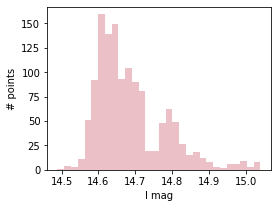

In [50]:
#did 17 in examples
basic(18,pbins=16,saveall=save) 

Source number: 24
RA,Dec (deg): 13.734498, -72.44646
Established period: 62.1
NS spin period: 59.07
Separation: 1.0903290717742153
I and V-I correlation: -0.9664953395224388
V and V-I correlation: -0.8812431463201372
Phase-folding with established orbital period and highest peak within five days of that value...
Repeating periodogram and phase-fold after detrending
Window shown in phase-fold: 125


max I band:  15.832
min I band:  15.042
I range:  0.7900000000000009
I stdev:  0.1773279291038697
max V band:  15.635
min V band:  15.251
V range:  0.38400000000000034
V stdev:  0.09836510688014943


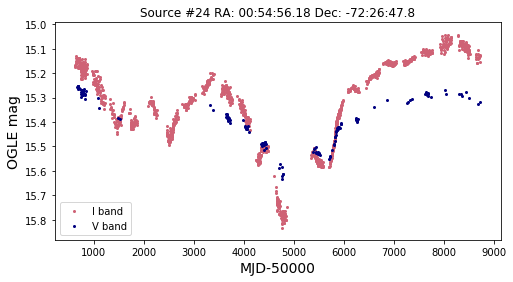

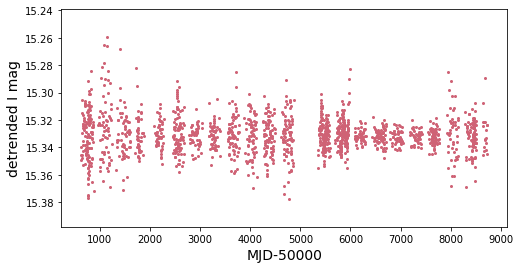

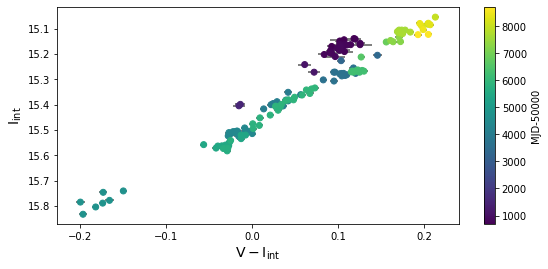

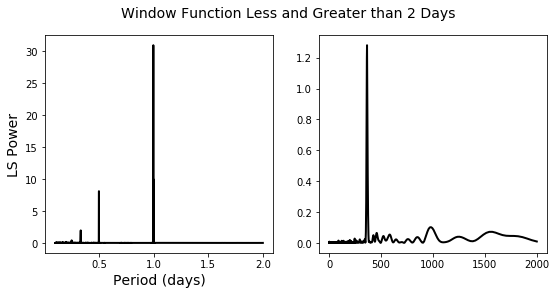

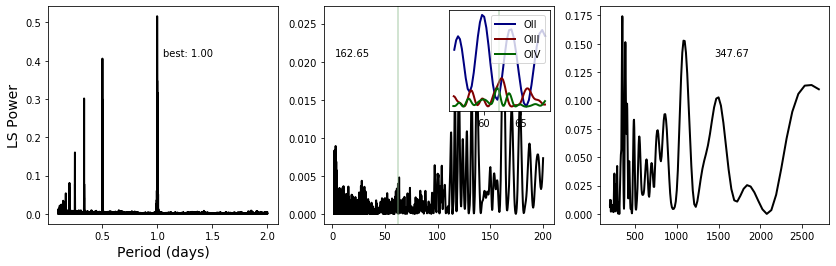

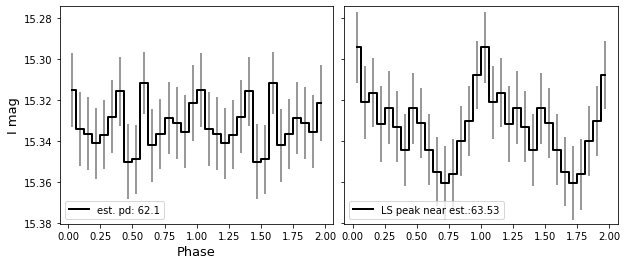

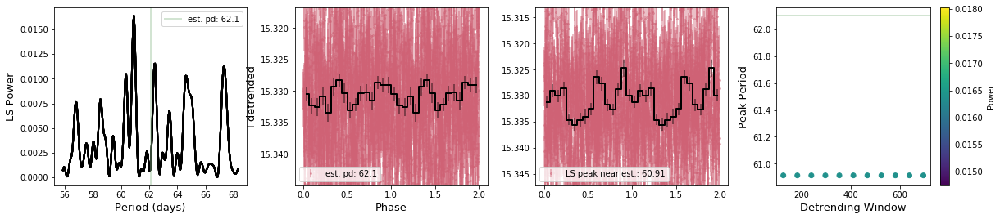

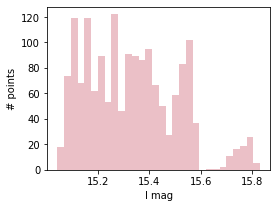

In [51]:
basic(19,pbins=16,saveall=save) 

Source number: 25
RA,Dec (deg): 16.802626, -72.59272
Established period: 110.6
NS spin period: 65.78
Separation: 0.2959192778047304
empty file for OIII I
I and V-I correlation: 0.09169053904024185
V and V-I correlation: 0.5637549161121175
Phase-folding with established orbital period and highest peak within five days of that value...
Repeating periodogram and phase-fold after detrending
Window shown in phase-fold: 221


max I band:  16.438
min I band:  15.699
I range:  0.738999999999999
I stdev:  0.11126326387333538
max V band:  16.09
min V band:  15.733
V range:  0.3569999999999993
V stdev:  0.1174724680603568


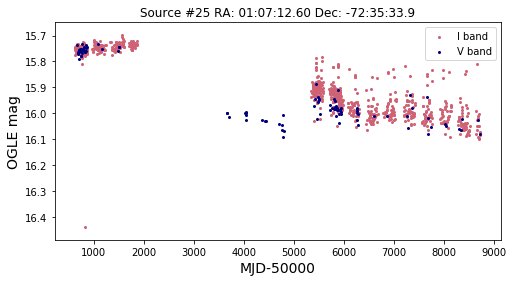

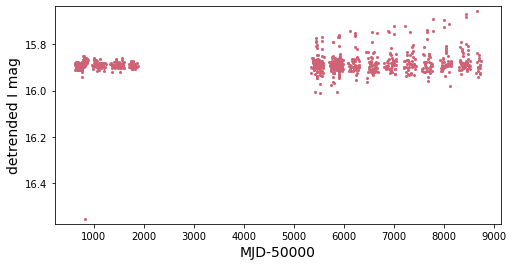

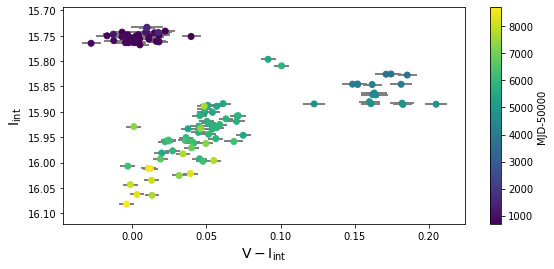

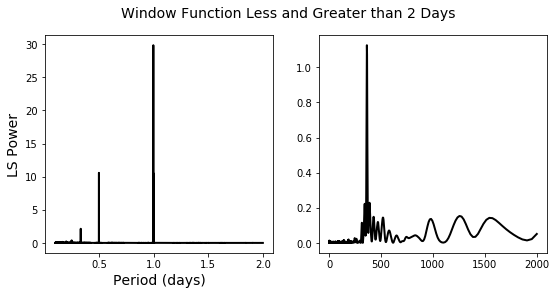

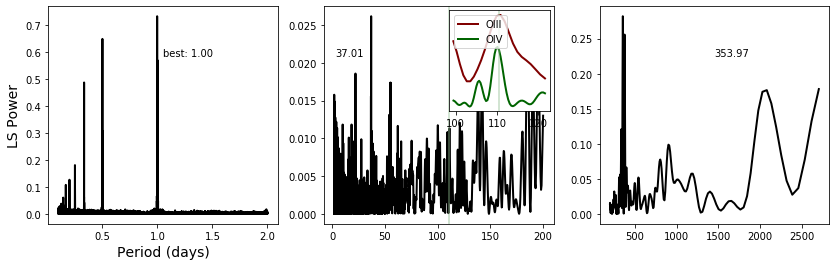

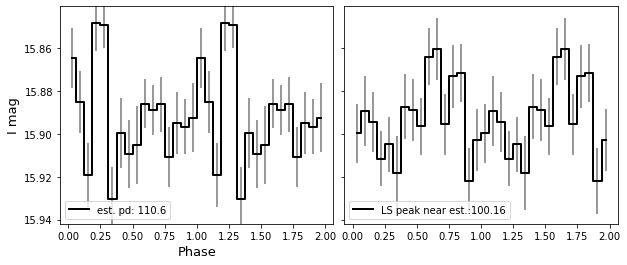

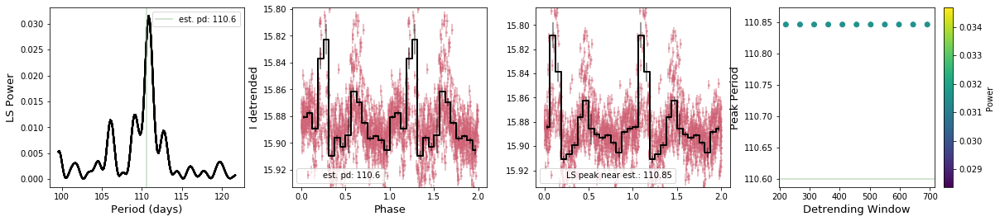

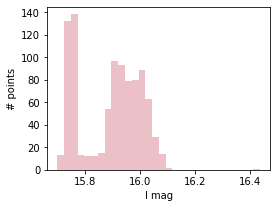

In [52]:
basic(20,pbins=16,saveall=save) #fix limits; in indiv analysis, try lower periods

Source number: 26
RA,Dec (deg): 12.263891, -72.847824
Established period: 33.38
NS spin period: 74.67
Separation: 0.1813335761297484
I and V-I correlation: -0.3892159716416162
V and V-I correlation: 0.482141243063691
Phase-folding with established orbital period and highest peak within five days of that value...
Repeating periodogram and phase-fold after detrending
Window shown in phase-fold: 67


max I band:  16.947
min I band:  16.59
I range:  0.3569999999999993
I stdev:  0.04874549714866689
max V band:  17.126
min V band:  16.842
V range:  0.2840000000000025
V stdev:  0.04826511097870676


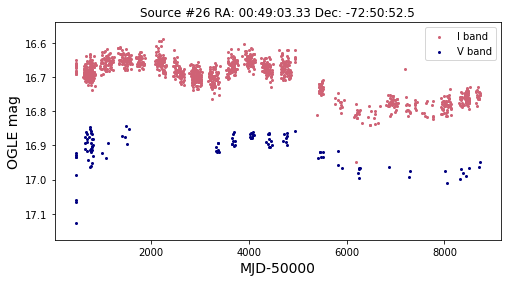

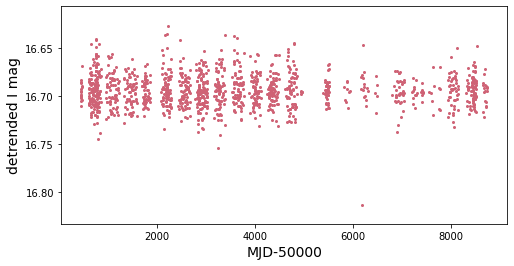

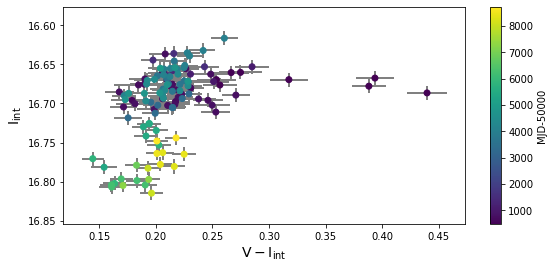

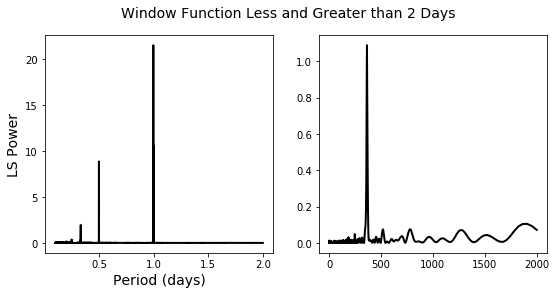

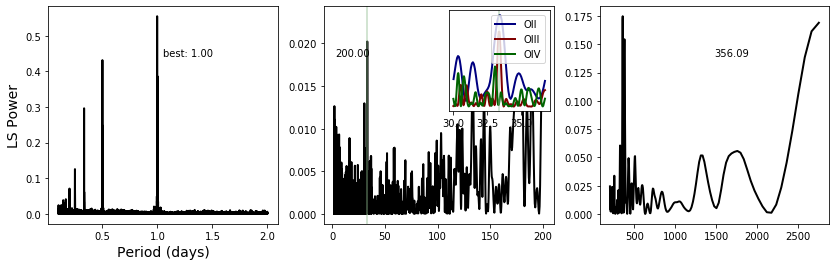

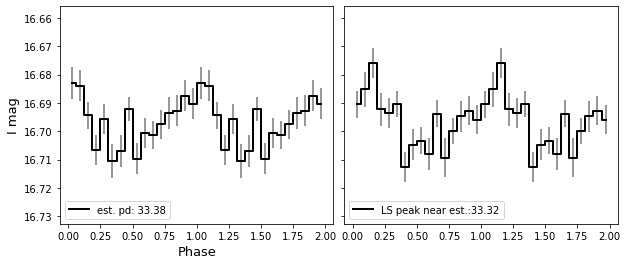

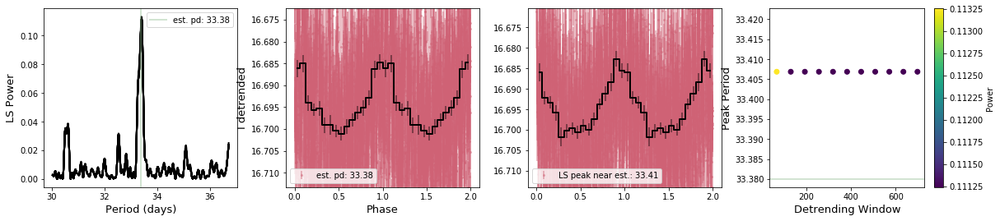

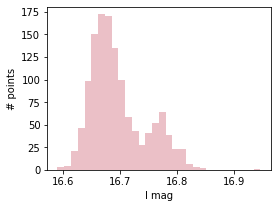

In [53]:
basic(21,pbins=16,saveall=save) 

Source number: 27
RA,Dec (deg): 13.037084, -72.63416
Established period: 362.3
NS spin period: 82.4
Separation: 0.3330362838593329
I and V-I correlation: -0.9086555042418574
V and V-I correlation: -0.7772043187778405
Phase-folding with established orbital period and highest peak within five days of that value...
Repeating periodogram and phase-fold after detrending
Window shown in phase-fold: 725


max I band:  15.556
min I band:  14.696
I range:  0.8599999999999994
I stdev:  0.29289769154267836
max V band:  15.571
min V band:  14.976
V range:  0.5949999999999989
V stdev:  0.20093992192941484


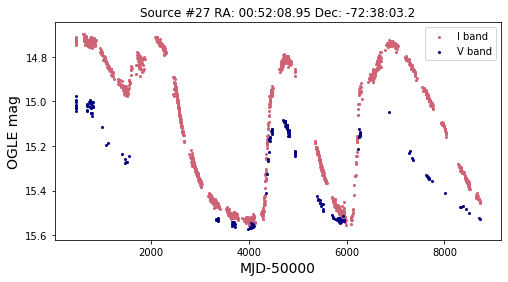

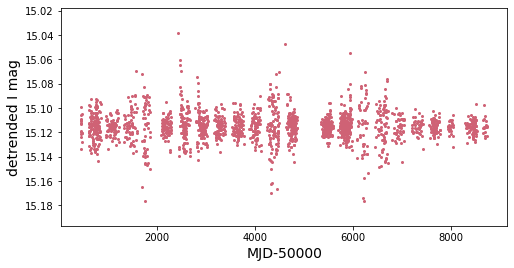

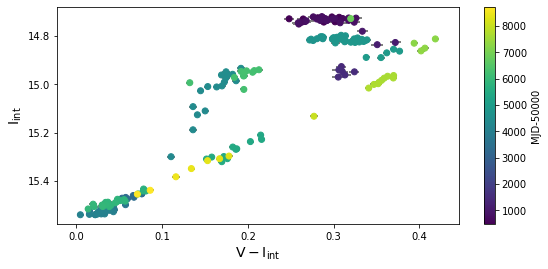

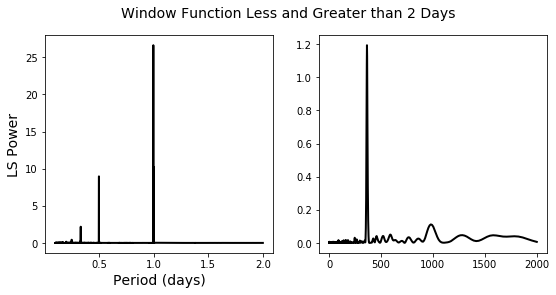

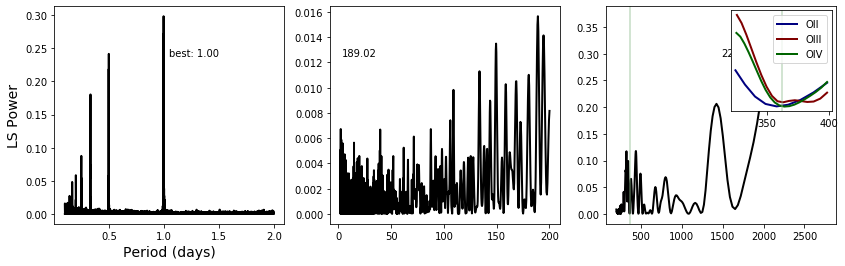

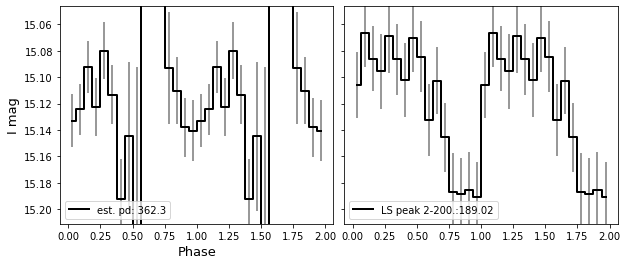

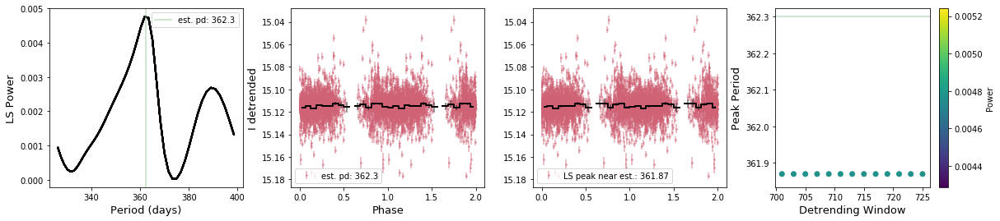

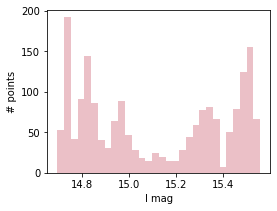

In [55]:
basic(22,pbins=16,saveall=save,medlim=False) #error from nans in maxa/mina -- for now not using medlim, but build this fix into the basic function

Source number: 28
RA,Dec (deg): 12.737854, -72.22597
Established period: 88.3
NS spin period: 91.12
Separation: 0.9175874109513925
I and V-I correlation: -0.19384500140770167
V and V-I correlation: 0.5100391042312166
Phase-folding with established orbital period and highest peak within five days of that value...
Repeating periodogram and phase-fold after detrending
Window shown in phase-fold: 177


max I band:  14.931
min I band:  14.689
I range:  0.2419999999999991
I stdev:  0.0255988259460188
max V band:  15.066
min V band:  14.961
V range:  0.10500000000000043
V stdev:  0.026840700011052876


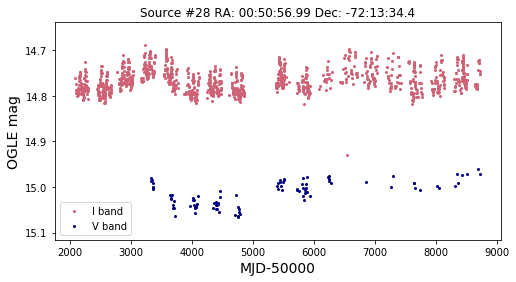

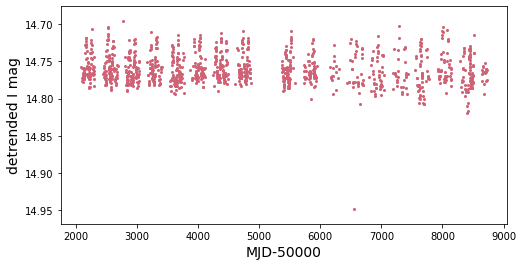

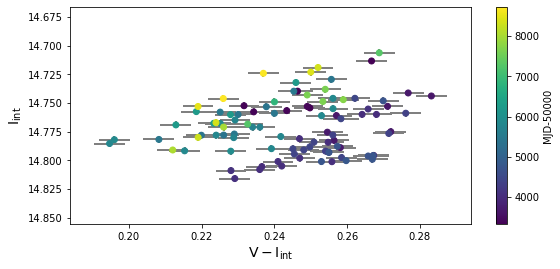

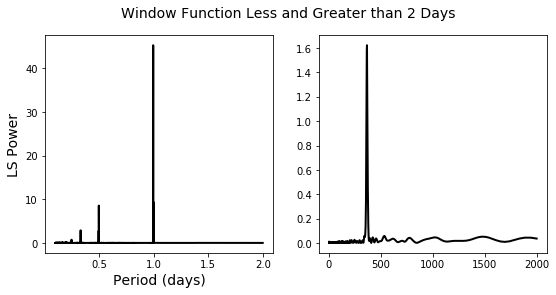

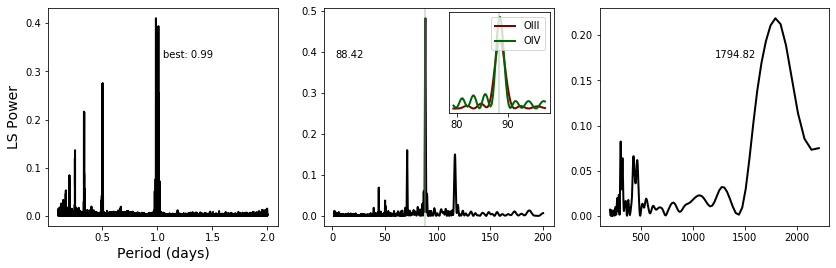

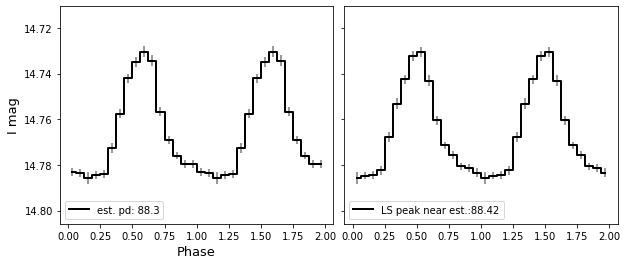

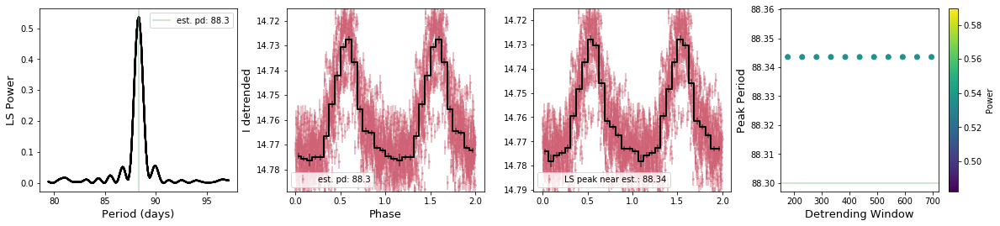

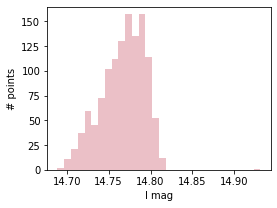

In [56]:
basic(23,pbins=16,saveall=save) 

Source number: 30
RA,Dec (deg): 14.362833, -73.42208
Established period: 21.95
NS spin period: 101.16
Separation: 0.09157770298445858
I and V-I correlation: -0.8565184040914818
V and V-I correlation: -0.4252439926010499
Phase-folding with established orbital period and highest peak within five days of that value...
Repeating periodogram and phase-fold after detrending
Window shown in phase-fold: 108


max I band:  15.682
min I band:  15.413
I range:  0.26900000000000013
I stdev:  0.04720481374155966
max V band:  15.773
min V band:  15.617
V range:  0.1559999999999988
V stdev:  0.02898682544622942


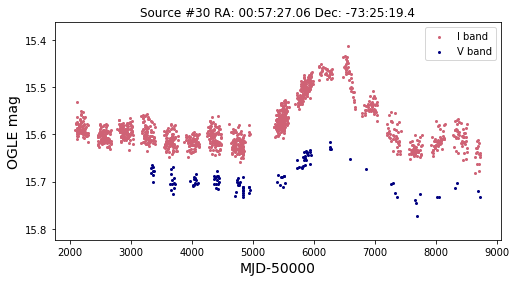

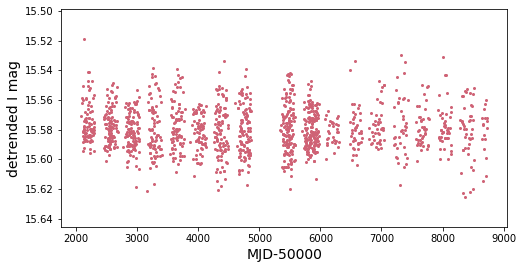

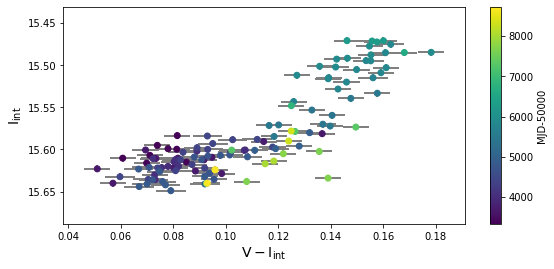

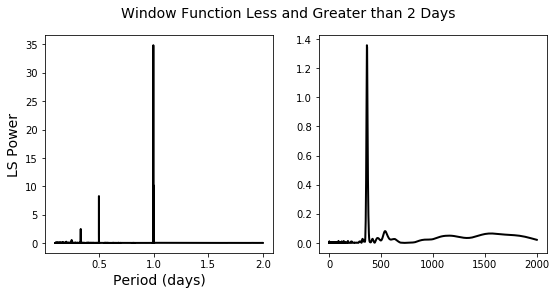

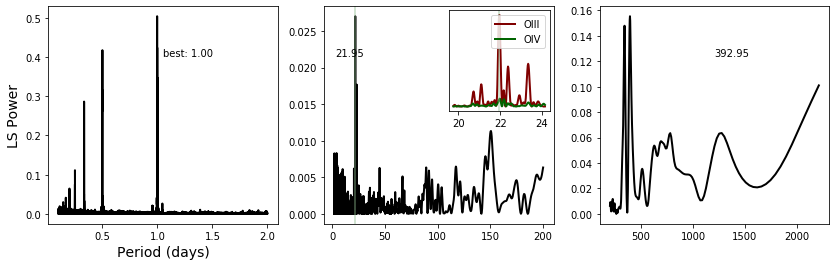

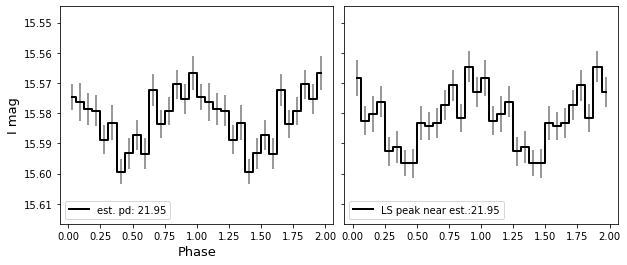

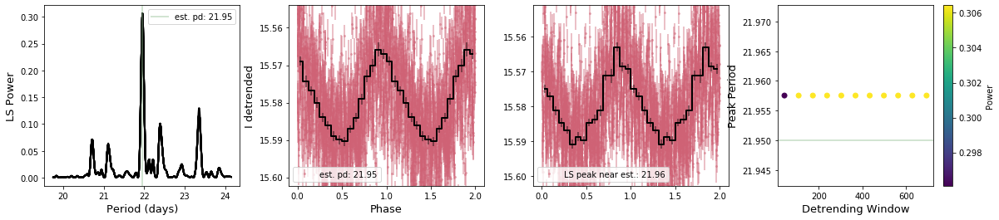

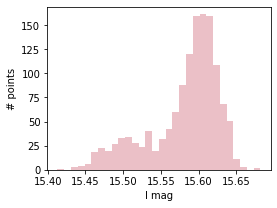

In [57]:
basic(24,pbins=16,saveall=save) 

Source number: 32
RA,Dec (deg): 14.023825, -72.3665
Established period: 197.0
NS spin period: 140.1
Separation: nan
I and V-I correlation: -0.9535305675696865
V and V-I correlation: -0.8651057918416414
Phase-folding with established orbital period and highest peak within five days of that value...
Repeating periodogram and phase-fold after detrending
Window shown in phase-fold: 395


max I band:  16.171
min I band:  15.236
I range:  0.9349999999999987
I stdev:  0.29953886813843494
max V band:  16.045
min V band:  15.558
V range:  0.4870000000000019
V stdev:  0.15741729167667975


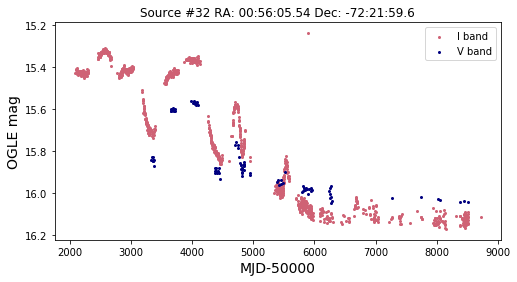

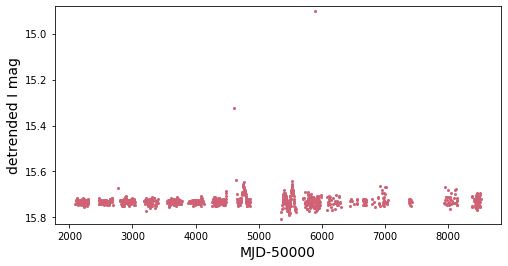

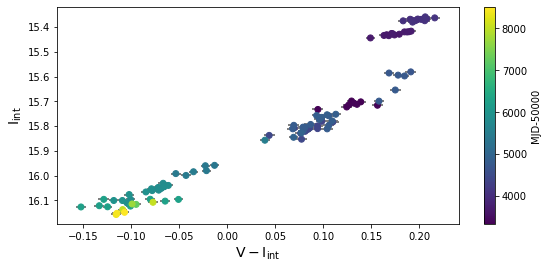

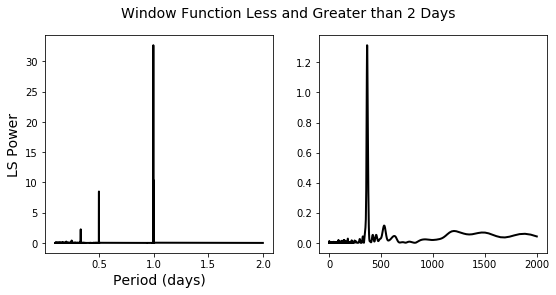

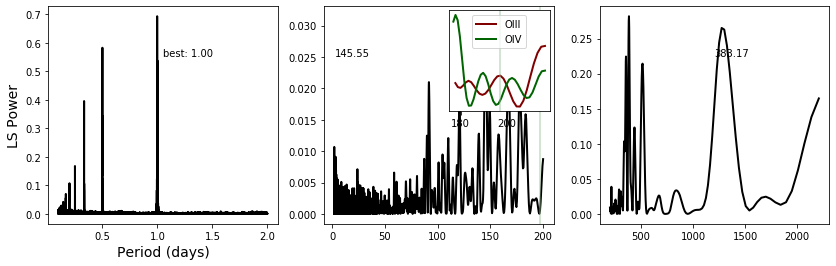

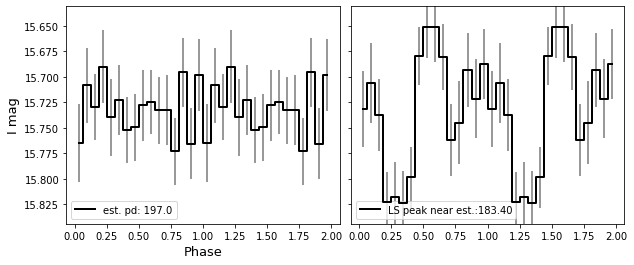

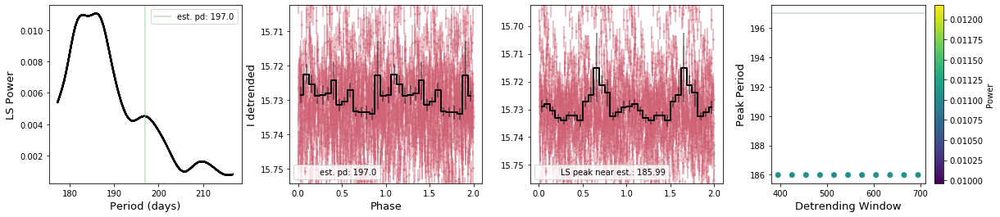

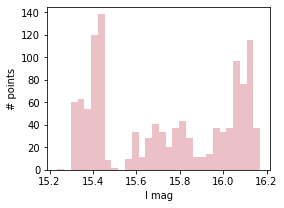

In [58]:
basic(26,pbins=16,saveall=save) 

Source number: 34
RA,Dec (deg): 14.45975, -72.13239
Established period: nan
NS spin period: 152.34
Separation: 0.690086673577844
I and V-I correlation: -0.8996473434922264
V and V-I correlation: -0.4705792987062251
using best period from middle periodogram to phase-fold data, after detrending with 701
running periodogram on detrended data


max I band:  15.852
min I band:  15.339
I range:  0.5129999999999999
I stdev:  0.0915189838984039
max V band:  15.89
min V band:  15.633
V range:  0.25700000000000145
V stdev:  0.039630464164122074


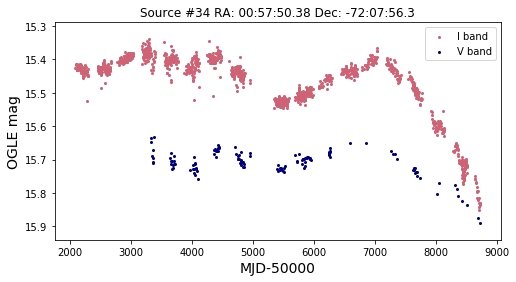

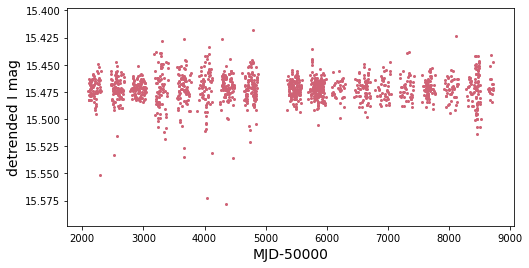

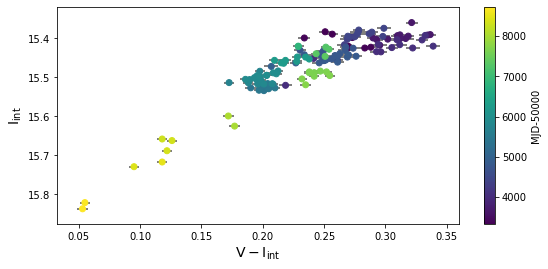

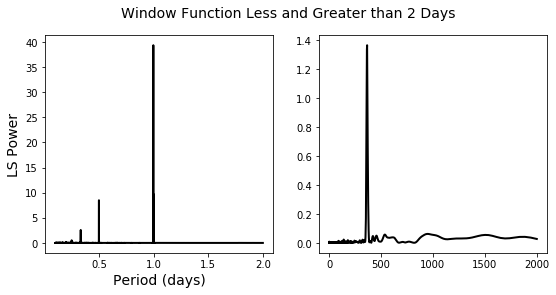

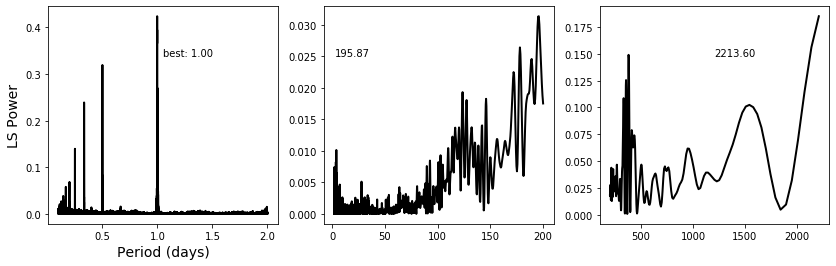

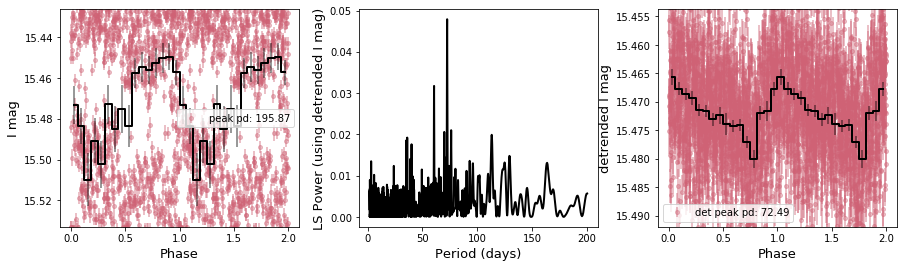

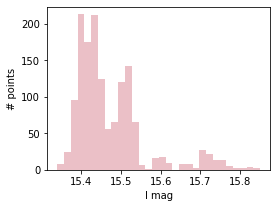

In [59]:
basic(27,pbins=16,saveall=save) 

Source number: 35
RA,Dec (deg): 16.930262, -71.99825
Established period: nan
NS spin period: 153.99
Separation: nan
I and V-I correlation: -0.44719767996792303
V and V-I correlation: -0.2921974309963761
using best period from middle periodogram to phase-fold data, after detrending with 701
running periodogram on detrended data


max I band:  16.948
min I band:  15.842
I range:  1.1059999999999999
I stdev:  0.24444782050103298
max V band:  16.83
min V band:  15.852
V range:  0.977999999999998
V stdev:  0.2426598591429968


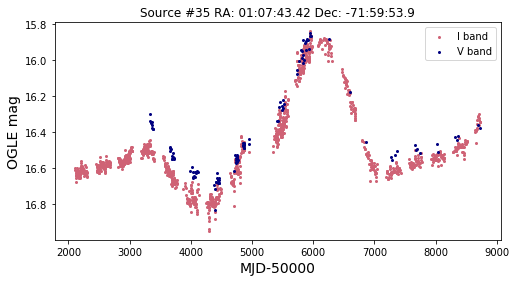

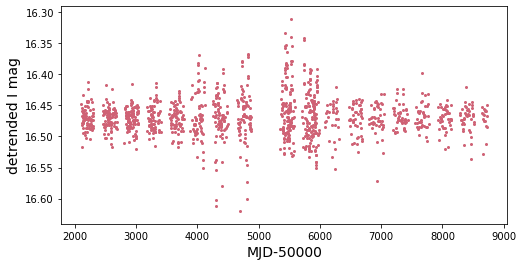

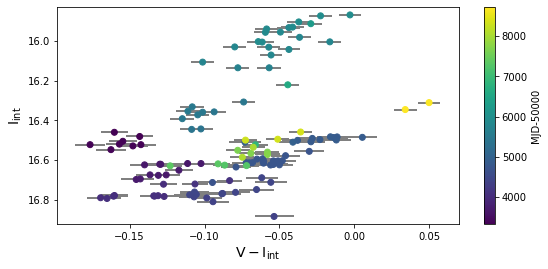

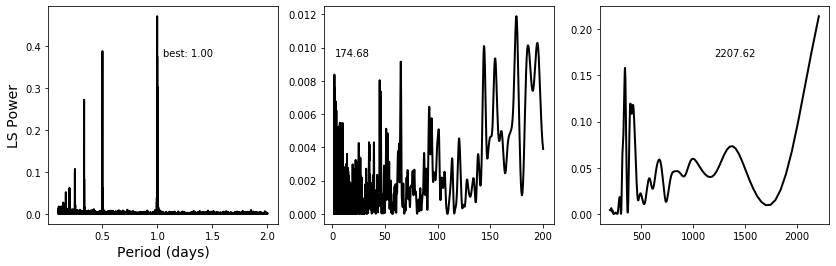

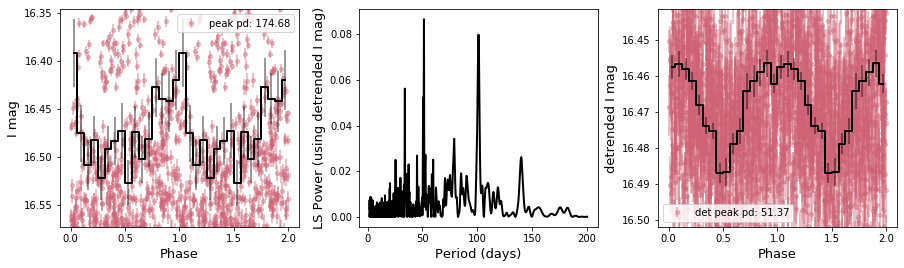

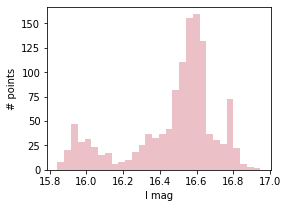

In [60]:
basic(28,pbins=16,saveall=save) 

Source number: 36
RA,Dec (deg): 13.229781, -71.96826
Established period: 68.54
NS spin period: 169.3
Separation: nan
I and V-I correlation: -0.5628075429487736
V and V-I correlation: 0.42389085197099036
Phase-folding with established orbital period and highest peak within five days of that value...
Repeating periodogram and phase-fold after detrending
Window shown in phase-fold: 137


max I band:  15.472
min I band:  15.28
I range:  0.19200000000000017
I stdev:  0.034089280710712454
max V band:  15.669
min V band:  15.515
V range:  0.15399999999999991
V stdev:  0.024681088570835993


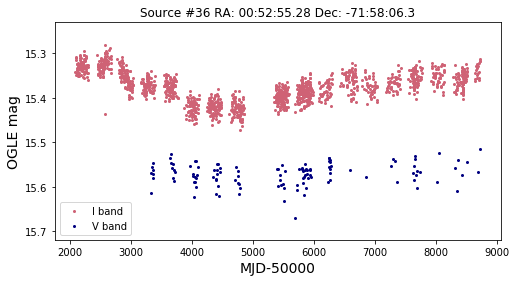

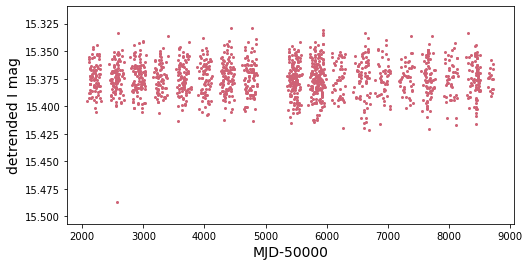

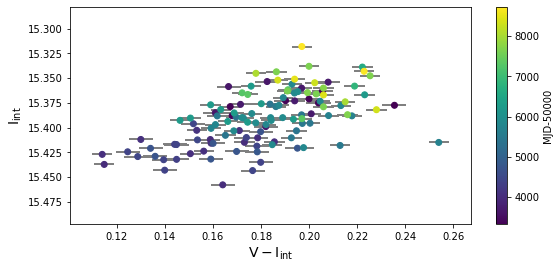

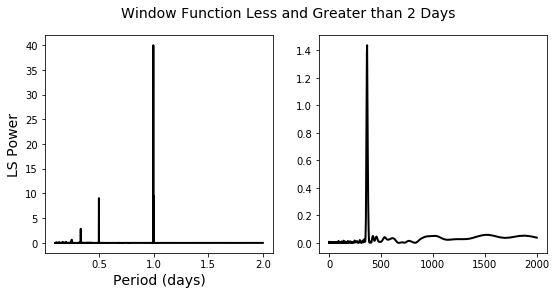

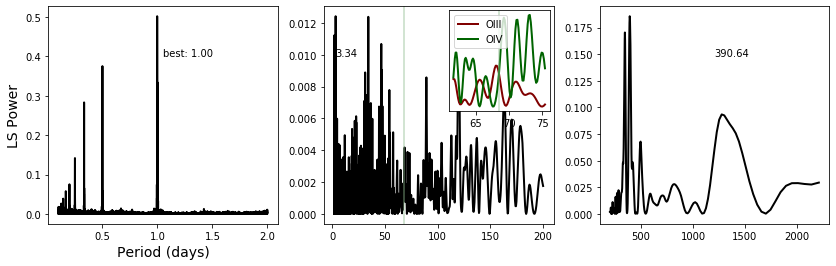

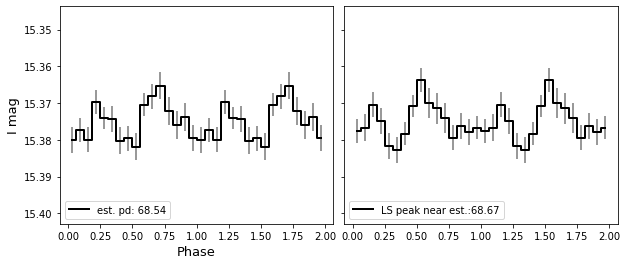

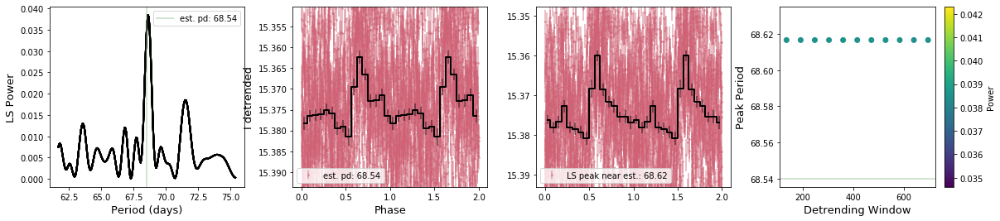

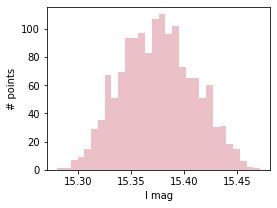

In [61]:
basic(29,pbins=16,saveall=save) 

Source number: 37
RA,Dec (deg): 12.96625, -73.175835
Established period: 67.88
NS spin period: 172.0
Separation: 0.9273925558014638
I and V-I correlation: -0.9336360429069598
V and V-I correlation: 0.047453376633395085
Phase-folding with established orbital period and highest peak within five days of that value...
Repeating periodogram and phase-fold after detrending
Window shown in phase-fold: 135


max I band:  14.749
min I band:  14.203
I range:  0.5460000000000012
I stdev:  0.08095801394877851
max V band:  14.569
min V band:  14.402
V range:  0.1670000000000016
V stdev:  0.021807134183604783


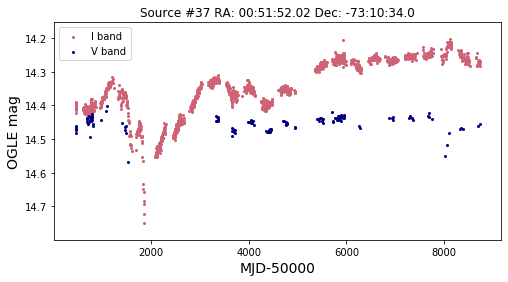

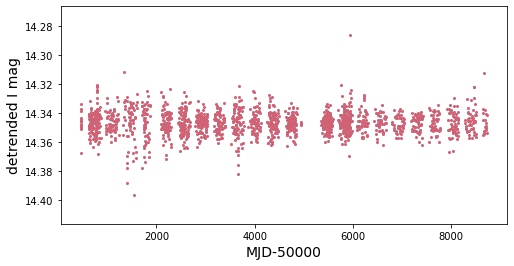

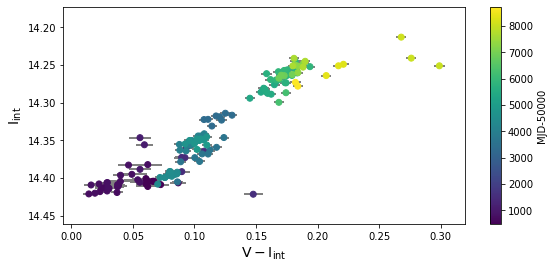

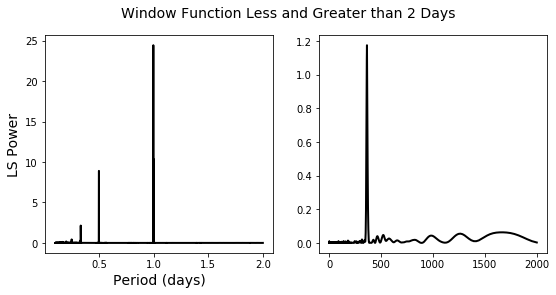

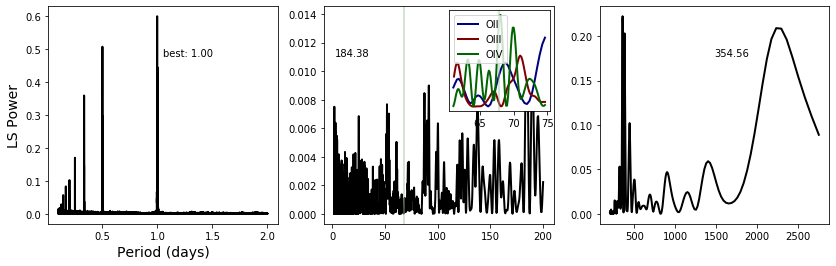

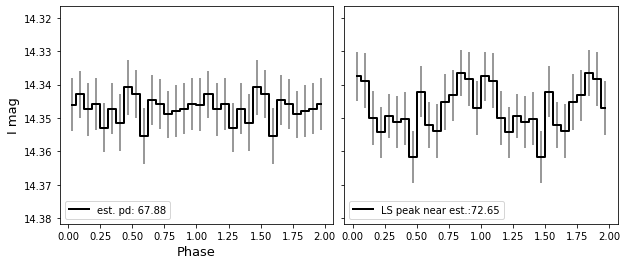

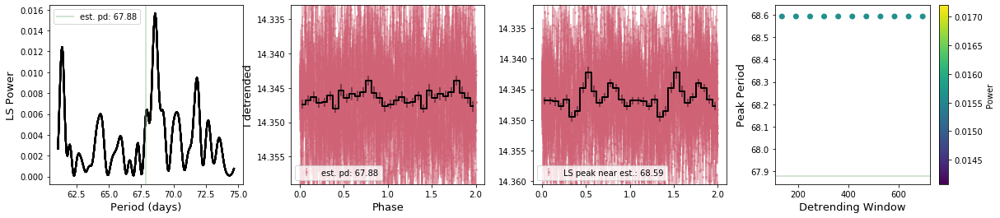

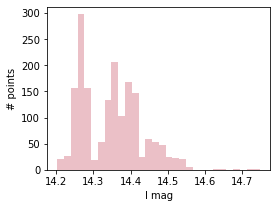

In [62]:
basic(30,pbins=16,saveall=save) 

Source number: 38
RA,Dec (deg): 15.467725, -72.39261
Established period: nan
NS spin period: 175.4
Separation: 0.7364043183292862
I and V-I correlation: -0.6957365004457309
V and V-I correlation: 0.6189396891999773
using best period from middle periodogram to phase-fold data, after detrending with 701
running periodogram on detrended data


max I band:  14.9
min I band:  14.678
I range:  0.22199999999999953
I stdev:  0.04005141235208628
max V band:  15.331
min V band:  14.957
V range:  0.3739999999999988
V stdev:  0.033884701635207314


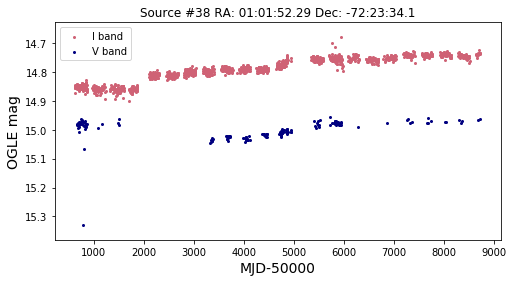

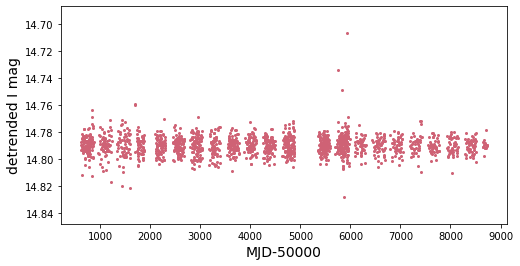

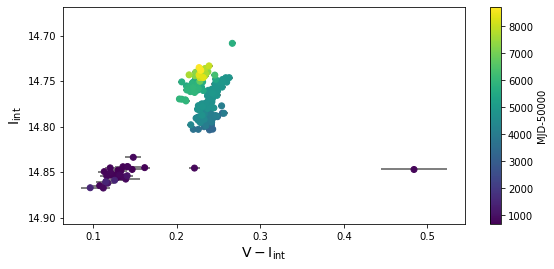

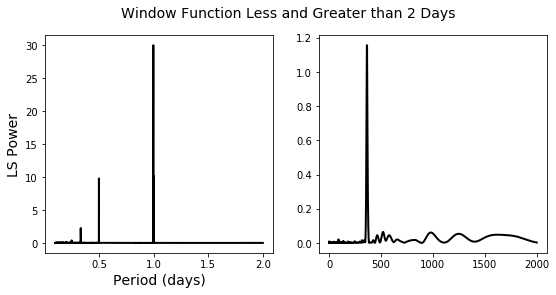

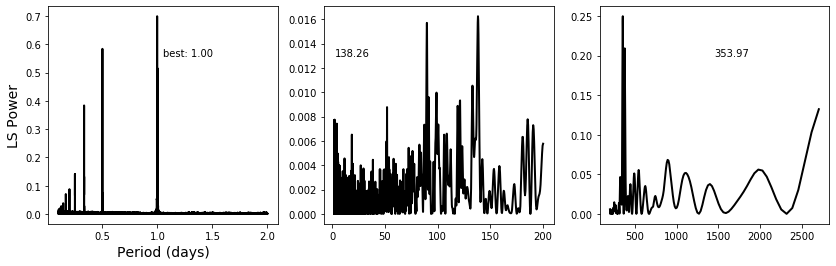

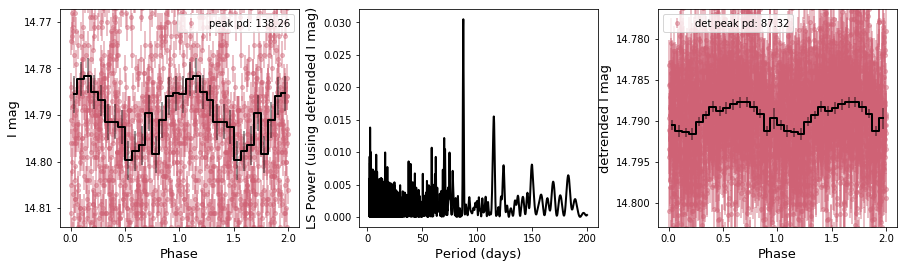

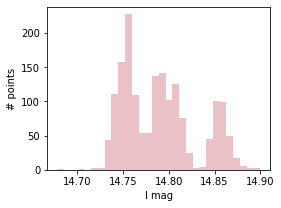

In [63]:
basic(31,pbins=16,saveall=save) 

Source number: 39
RA,Dec (deg): 14.837658, -72.388115
Established period: 71.98
NS spin period: 201.9
Separation: 0.2821638866877138
I and V-I correlation: -0.9643611604893421
V and V-I correlation: -0.896294920125472
Phase-folding with established orbital period and highest peak within five days of that value...
Repeating periodogram and phase-fold after detrending
Window shown in phase-fold: 143


max I band:  14.864
min I band:  14.508
I range:  0.35600000000000165
I stdev:  0.0815012528918754
max V band:  14.864
min V band:  14.668
V range:  0.1960000000000015
V stdev:  0.0538520590087274


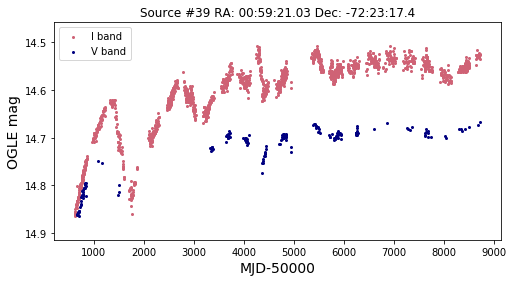

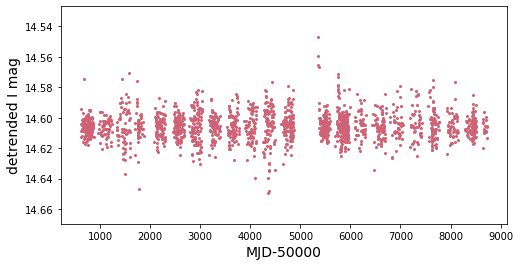

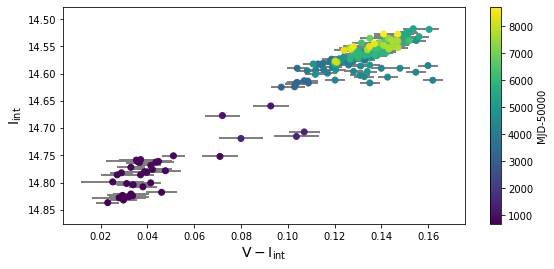

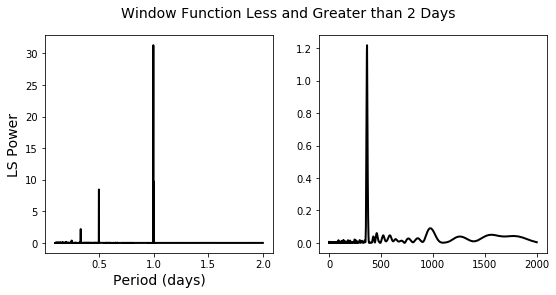

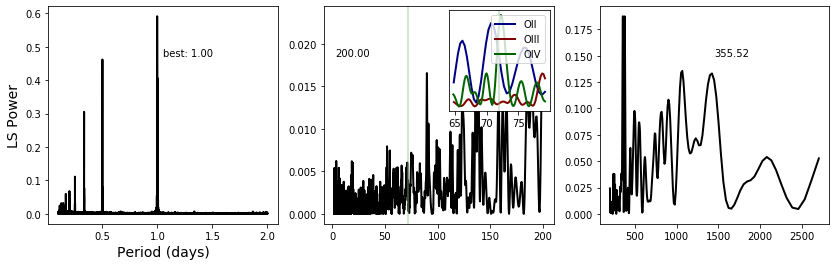

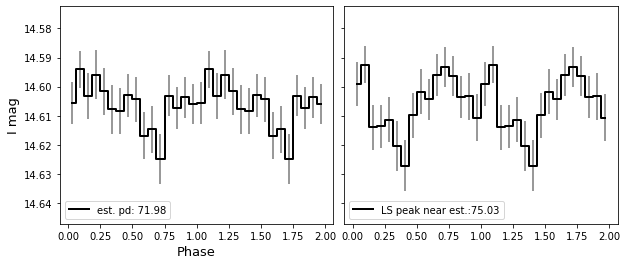

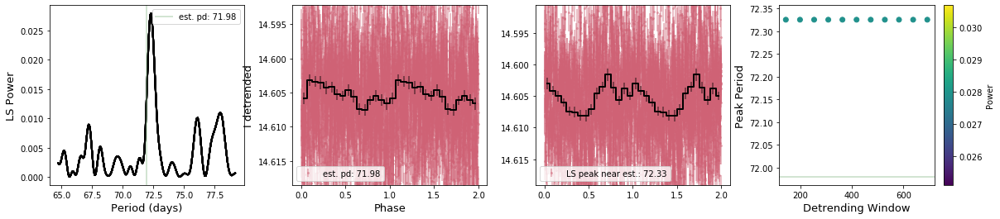

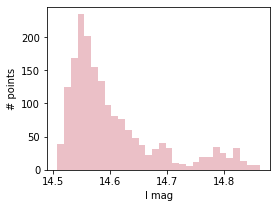

In [64]:
basic(32,pbins=16,saveall=save) 

Source number: 40
RA,Dec (deg): 14.870287, -72.6179
Established period: 224.0
NS spin period: 202.52
Separation: 0.6262391149527577
I and V-I correlation: -0.1328150587093624
V and V-I correlation: 0.7082723127854512
Phase-folding with established orbital period and highest peak within five days of that value...
Repeating periodogram and phase-fold after detrending
Window shown in phase-fold: 449


max I band:  15.461
min I band:  15.201
I range:  0.2599999999999998
I stdev:  0.054399220161783966
max V band:  16.126
min V band:  15.179
V range:  0.947000000000001
V stdev:  0.07259780056296469


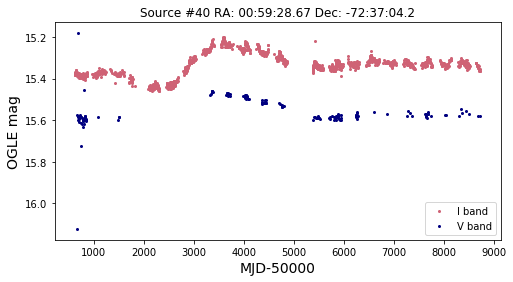

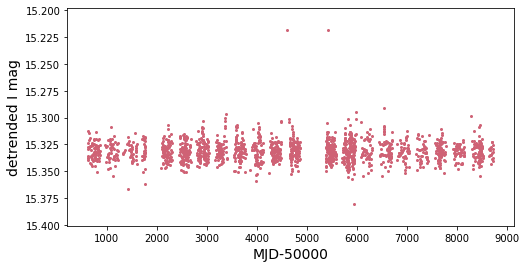

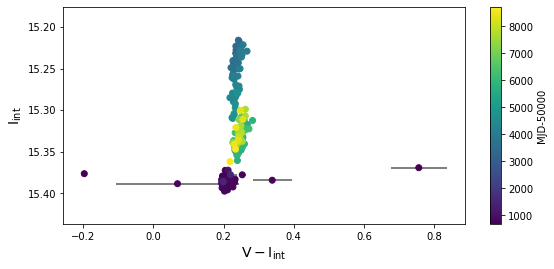

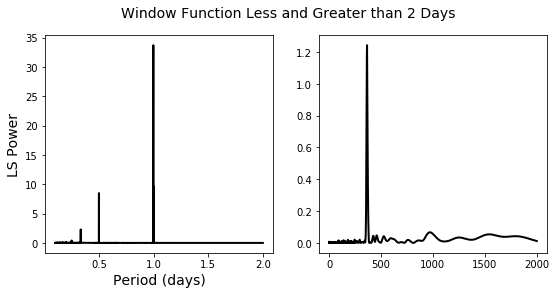

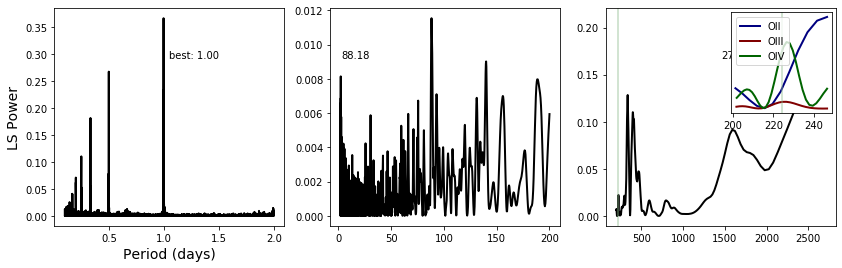

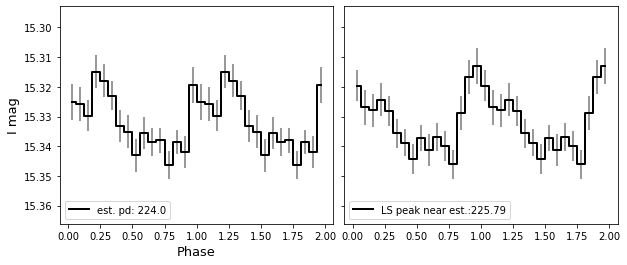

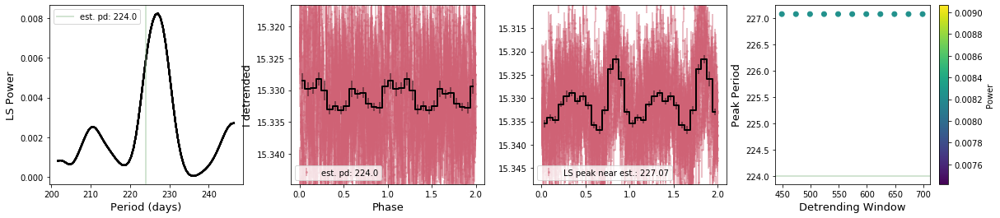

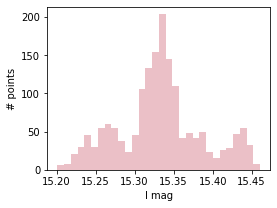

In [65]:
basic(33,pbins=16,saveall=save) #error

Source number: 41
RA,Dec (deg): 12.546373, -73.006966
Established period: 29.91
NS spin period: 214.03
Separation: 1.5814828543947794
I and V-I correlation: 0.008207309264156904
V and V-I correlation: 0.1943980841976312
Phase-folding with established orbital period and highest peak within five days of that value...
Repeating periodogram and phase-fold after detrending
Window shown in phase-fold: 59


max I band:  15.773
min I band:  15.049
I range:  0.7240000000000002
I stdev:  0.20818184410753487
max V band:  15.7
min V band:  14.998
V range:  0.702
V stdev:  0.2208849806177537


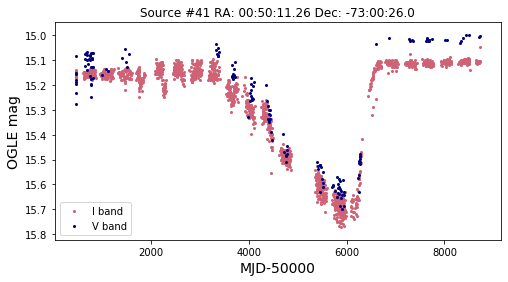

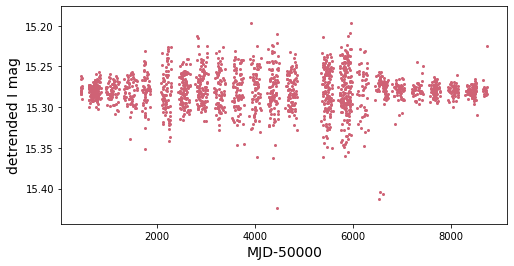

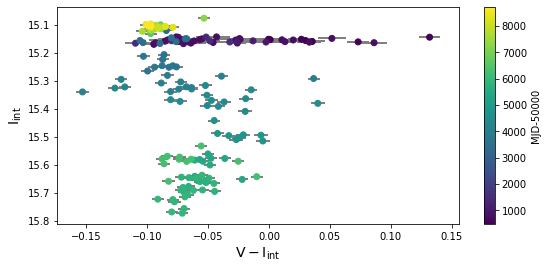

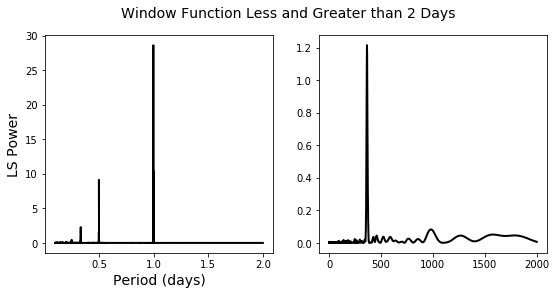

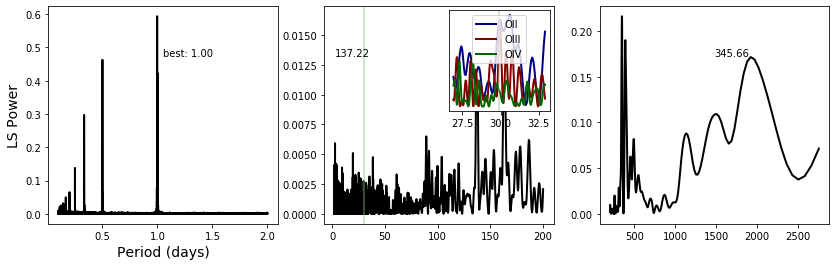

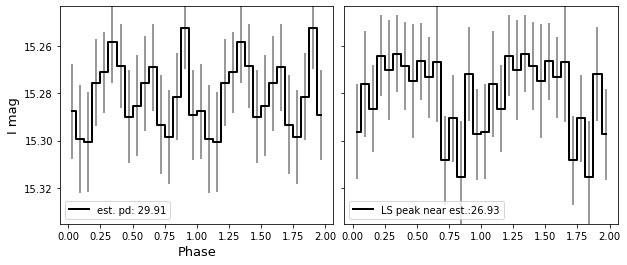

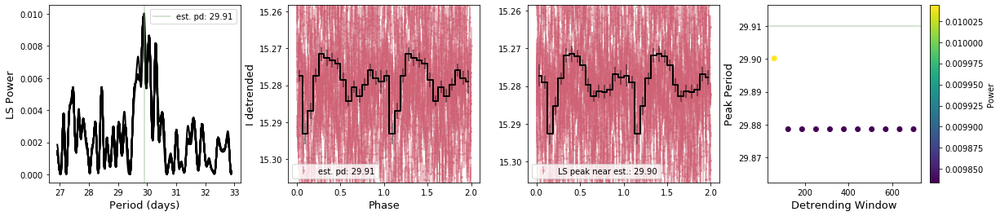

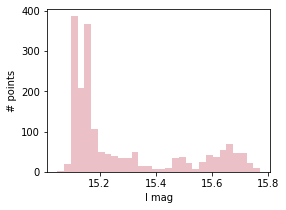

In [66]:
basic(34,pbins=16,saveall=save) 

Source number: 44
RA,Dec (deg): 14.455669, -72.0432
Established period: 64.8
NS spin period: 280.4
Separation: 1.1730494581195174
I and V-I correlation: -0.3307595869470501
V and V-I correlation: 0.18286634755303952
Phase-folding with established orbital period and highest peak within five days of that value...
Repeating periodogram and phase-fold after detrending
Window shown in phase-fold: 129


max I band:  15.516
min I band:  15.249
I range:  0.26699999999999946
I stdev:  0.06577033615797583
max V band:  15.707
min V band:  15.439
V range:  0.2680000000000007
V stdev:  0.06304302923645508


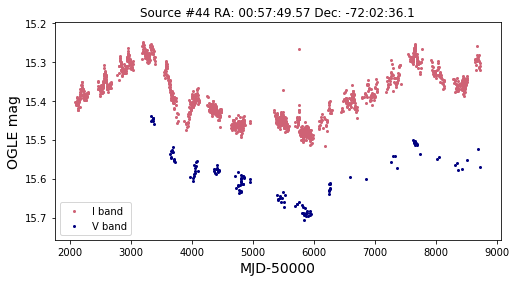

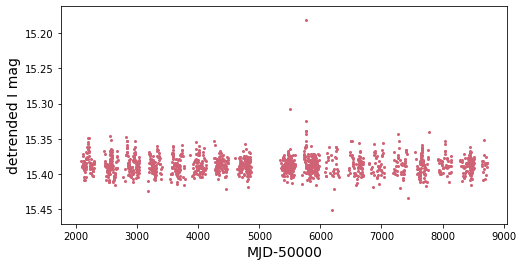

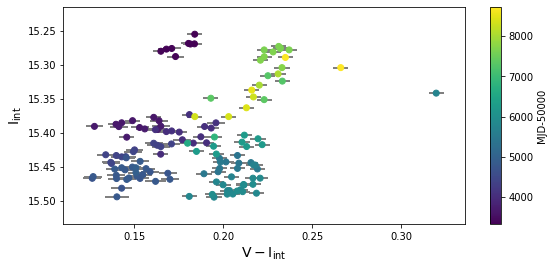

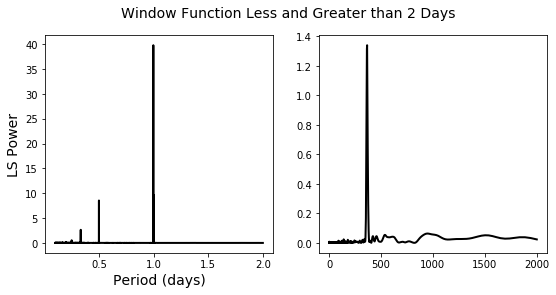

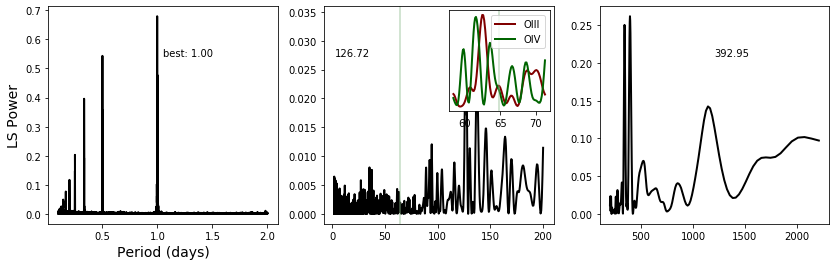

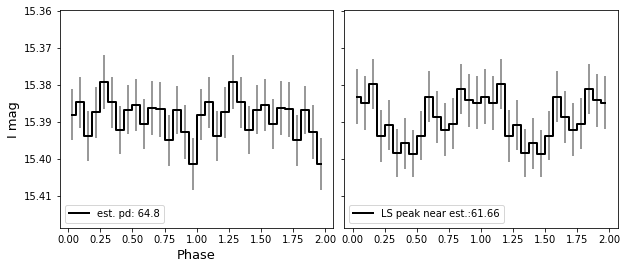

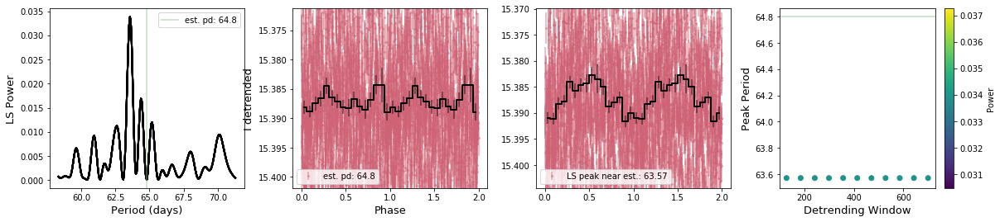

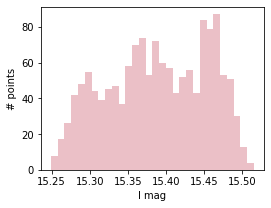

In [67]:
basic(35,pbins=16,saveall=save) 

Source number: 45
RA,Dec (deg): 14.553074, -72.513435
Established period: 59.77
NS spin period: 291.33
Separation: 0.41709698577795423
I and V-I correlation: -0.8021221876899689
V and V-I correlation: -0.33698392814060957
Phase-folding with established orbital period and highest peak within five days of that value...
Repeating periodogram and phase-fold after detrending
Window shown in phase-fold: 119


max I band:  14.69
min I band:  14.401
I range:  0.2889999999999997
I stdev:  0.04683437454272839
max V band:  14.928
min V band:  14.802
V range:  0.12600000000000122
V stdev:  0.029054857790808086


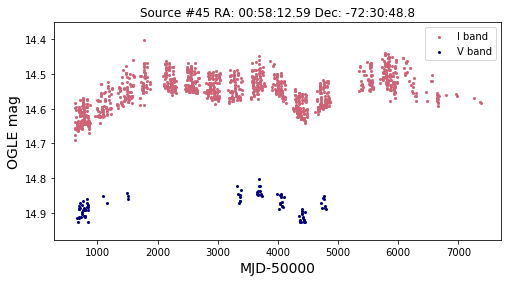

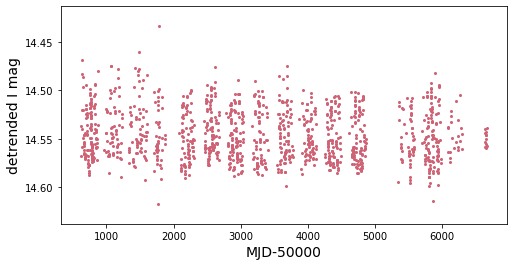

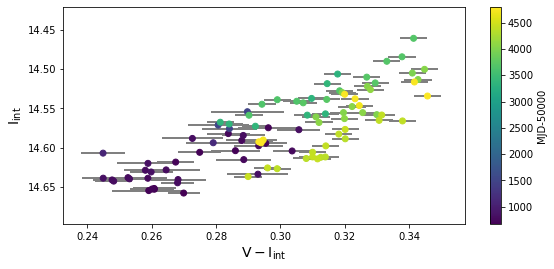

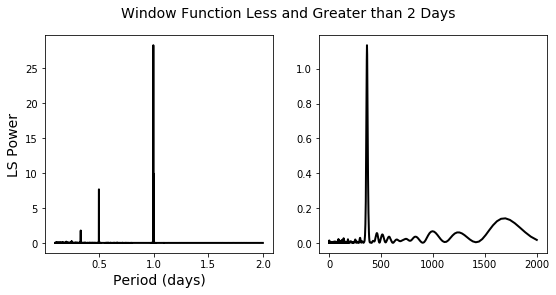

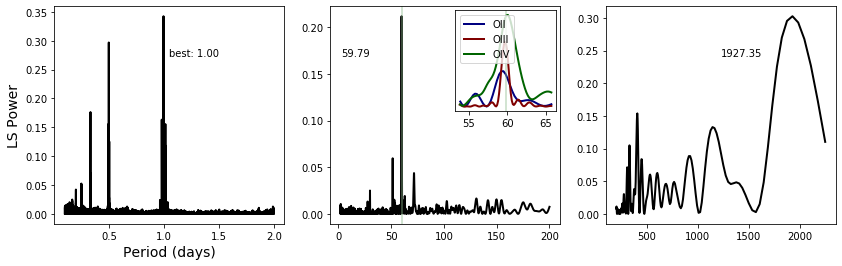

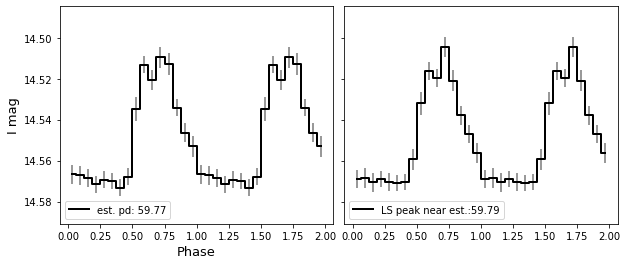

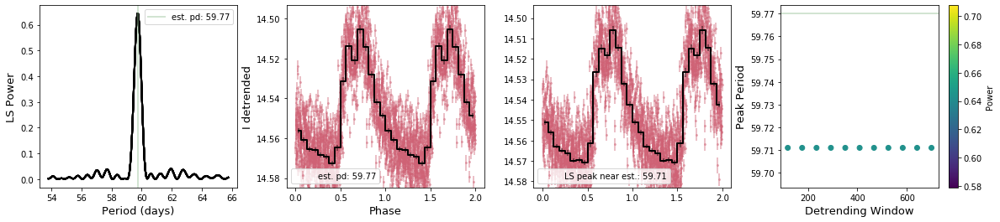

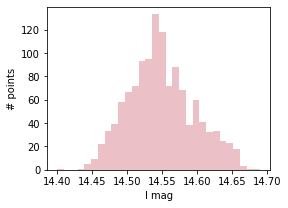

In [68]:
basic(36,pbins=16,saveall=save) 

Source number: 46
RA,Dec (deg): 12.700255, -73.30488
Established period: nan
NS spin period: 292.7
Separation: 0.6973619196184568
I and V-I correlation: -0.8678520855167449
V and V-I correlation: -0.7253066994414351
using best period from middle periodogram to phase-fold data, after detrending with 701
running periodogram on detrended data


max I band:  15.953
min I band:  14.896
I range:  1.0569999999999986
I stdev:  0.3013052126646709
max V band:  15.831
min V band:  15.133
V range:  0.6980000000000004
V stdev:  0.21363505112138753


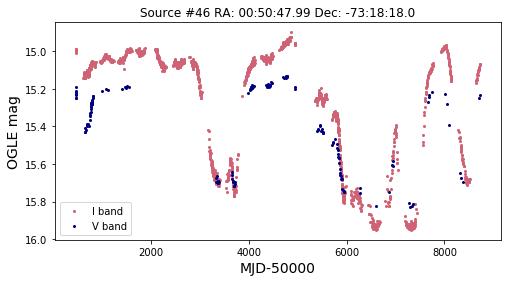

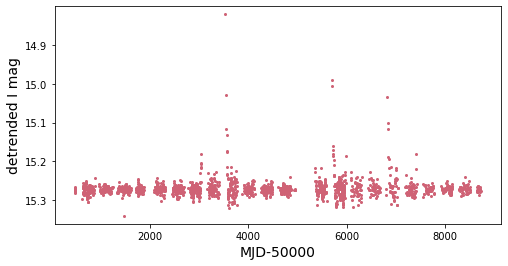

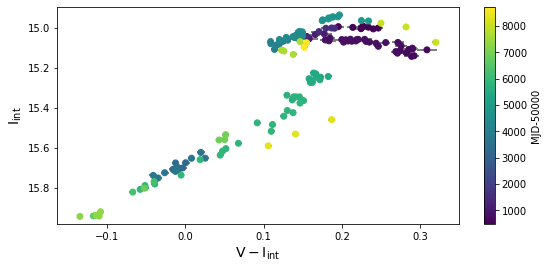

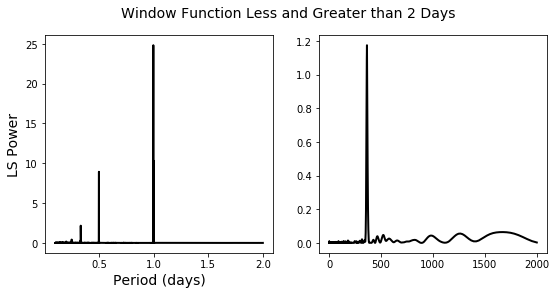

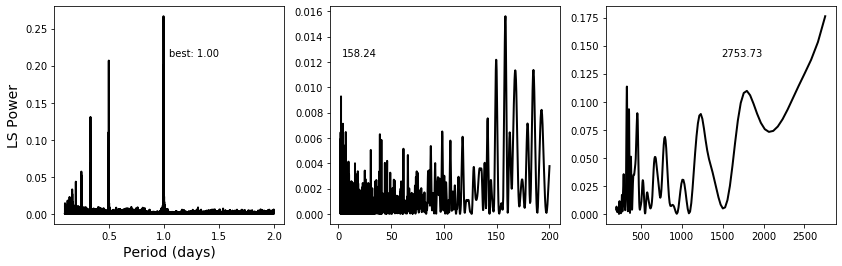

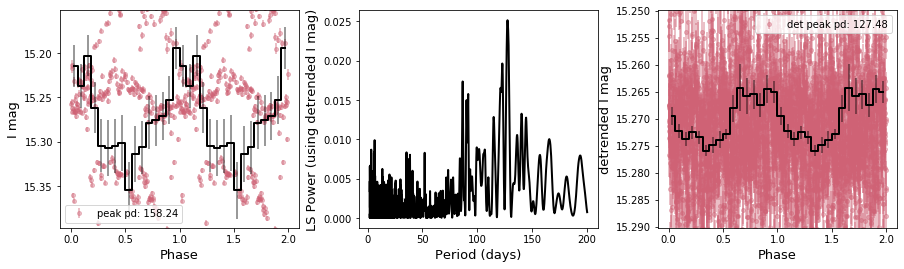

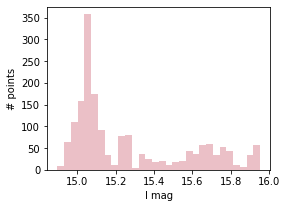

In [69]:
basic(37,pbins=16,saveall=save) 

Source number: 47
RA,Dec (deg): 15.26147, -72.11614
Established period: 344.0
NS spin period: 304.5
Separation: 0.8300844587673507
I and V-I correlation: -0.8153045136698245
V and V-I correlation: 0.7684901282287183
Phase-folding with established orbital period and highest peak within five days of that value...
Repeating periodogram and phase-fold after detrending
Window shown in phase-fold: 689


max I band:  15.622
min I band:  15.488
I range:  0.13400000000000034
I stdev:  0.02040542178041749
max V band:  15.783
min V band:  15.706
V range:  0.07699999999999996
V stdev:  0.017455126480298375


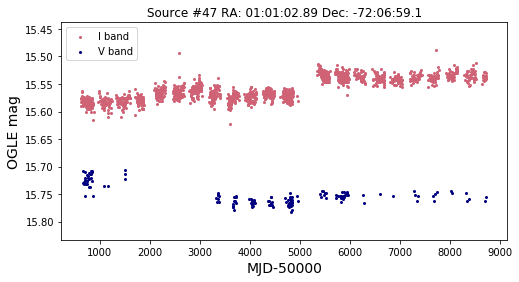

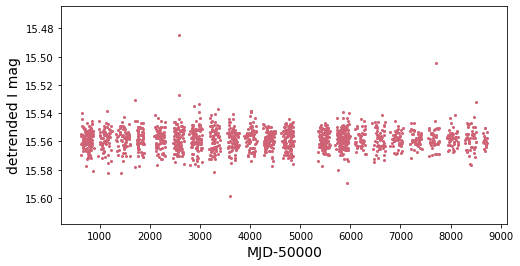

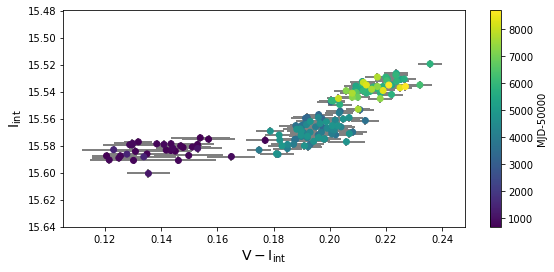

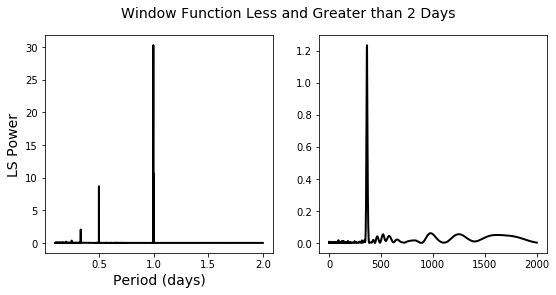

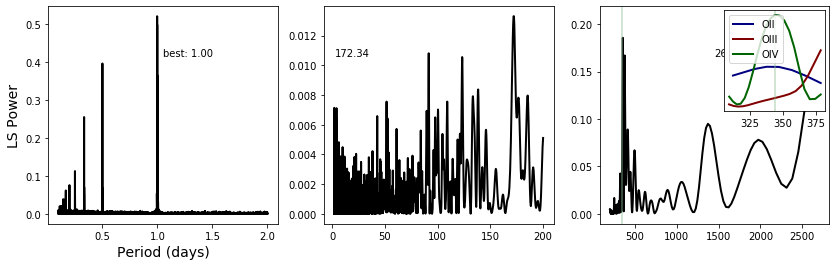

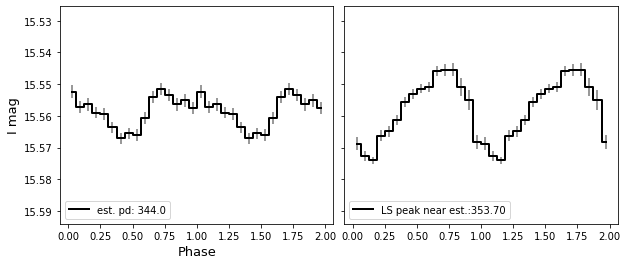

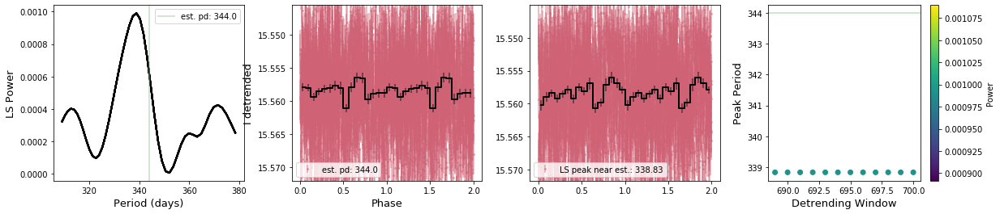

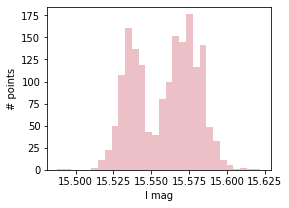

In [70]:
basic(38,pbins=16,saveall=save) #check calibration; use larger detrending windows

Source number: 48
RA,Dec (deg): 13.064167, -73.32083
Established period: 1163.0
NS spin period: 305.69
Separation: nan
I and V-I correlation: -0.9708981007790428
V and V-I correlation: -0.7540319474968079
Phase-folding with established orbital period and highest peak within five days of that value...
Repeating periodogram and phase-fold after detrending
Window shown in phase-fold: 2327


max I band:  16.156
min I band:  15.492
I range:  0.6639999999999979
I stdev:  0.12397650458894773
max V band:  16.008
min V band:  15.741
V range:  0.26699999999999946
V stdev:  0.05122137401081268


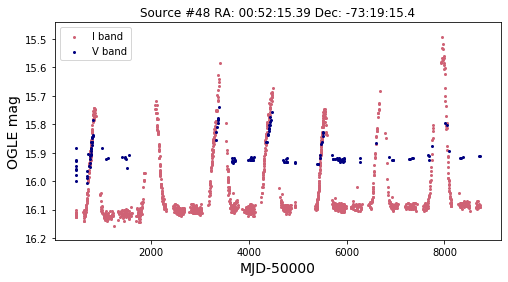

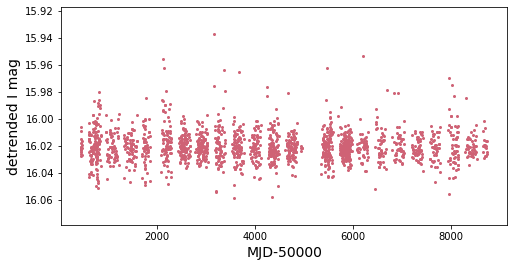

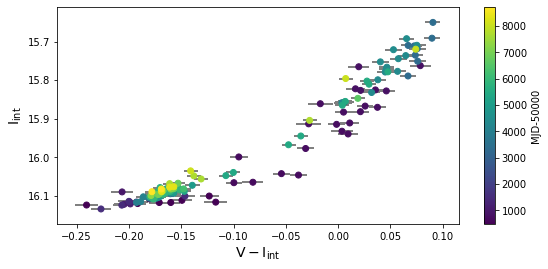

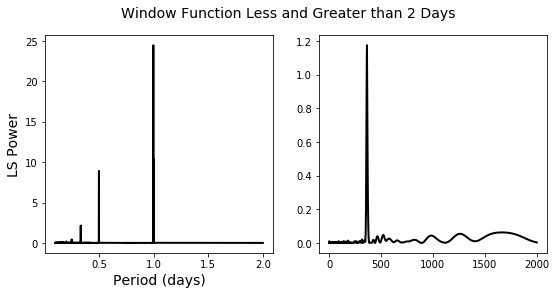

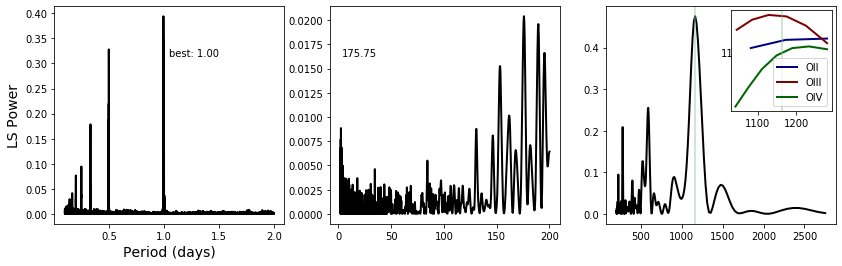

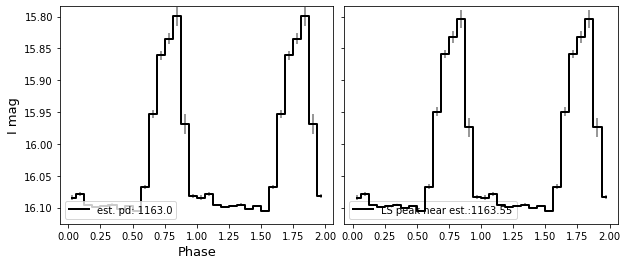

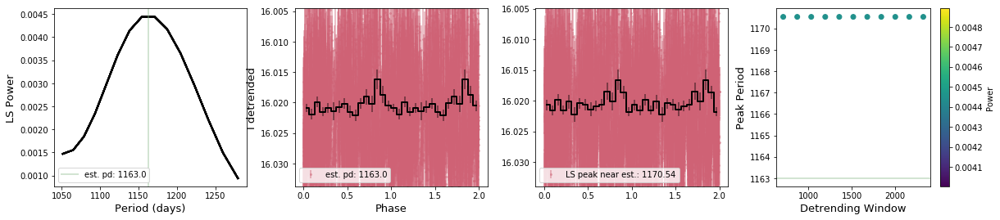

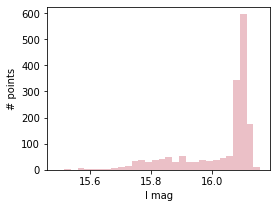

In [71]:
basic(39,pbins=16,saveall=save) #look into 175 day period; otherwise shouldn't detrend

Source number: 49
RA,Dec (deg): 12.685833, -73.26806
Established period: 116.6
NS spin period: 323.2
Separation: 0.4671011406475931
I and V-I correlation: 0.11155486877389752
V and V-I correlation: 0.9805012467253508
Phase-folding with established orbital period and highest peak within five days of that value...
Repeating periodogram and phase-fold after detrending
Window shown in phase-fold: 233


max I band:  15.43
min I band:  15.135
I range:  0.29499999999999993
I stdev:  0.04219818187223118
max V band:  18.028
min V band:  15.342
V range:  2.685999999999998
V stdev:  0.2140718354123578


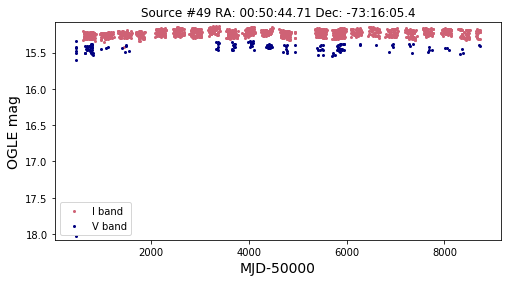

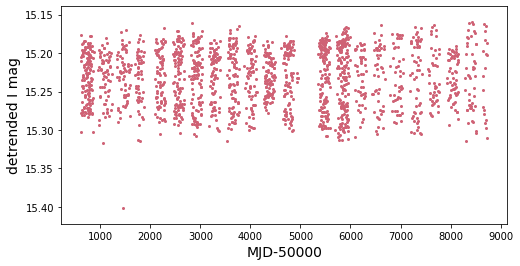

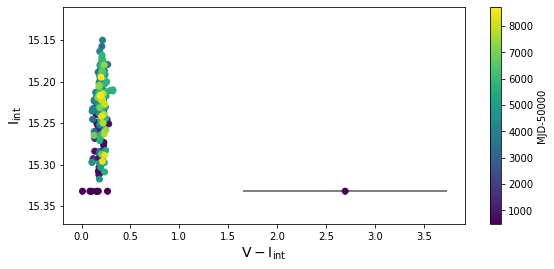

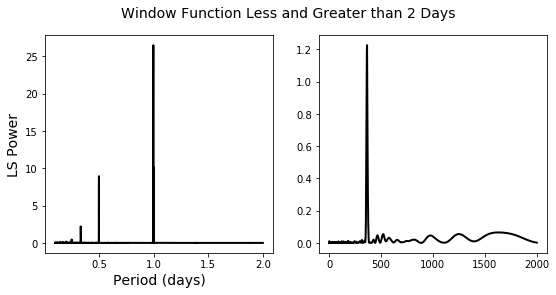

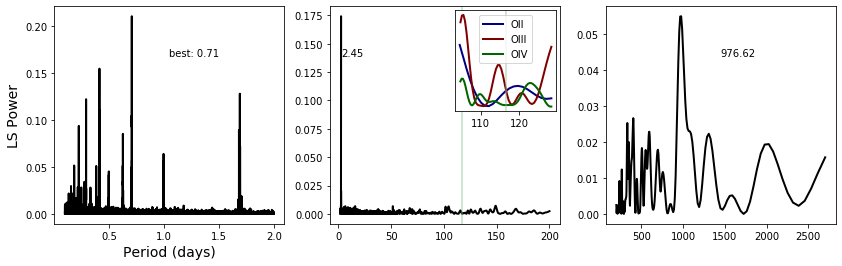

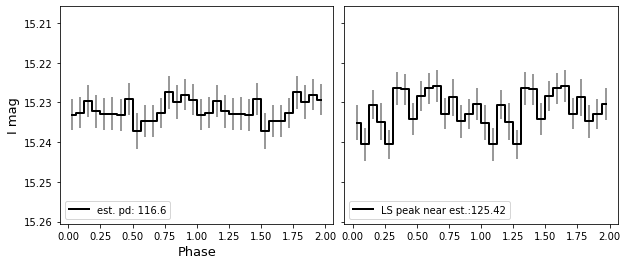

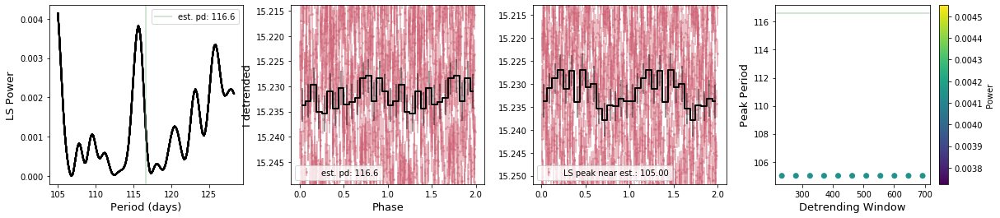

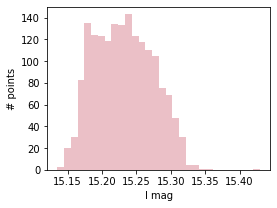

In [72]:
basic(40,pbins=16,saveall=save) #re-do without V outlier at some point

Source number: 50
RA,Dec (deg): 13.21725, -72.287445
Established period: 45.9
NS spin period: 325.4
Separation: 0.375829580201356
I and V-I correlation: -0.3076089999036358
V and V-I correlation: -0.14108535704213498
Phase-folding with established orbital period and highest peak within five days of that value...
Repeating periodogram and phase-fold after detrending
Window shown in phase-fold: 151


max I band:  16.943
min I band:  16.137
I range:  0.8060000000000009
I stdev:  0.23761270166267262
max V band:  16.78
min V band:  16.06
V range:  0.7200000000000024
V stdev:  0.21121192591284443


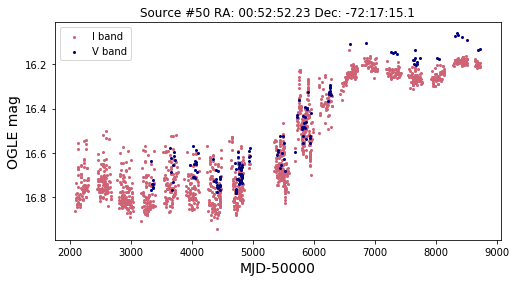

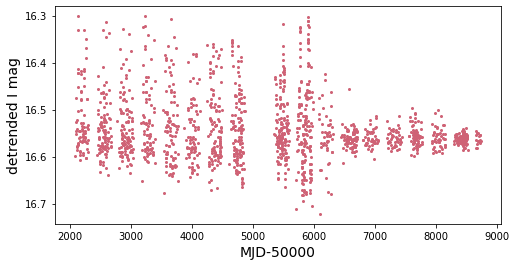

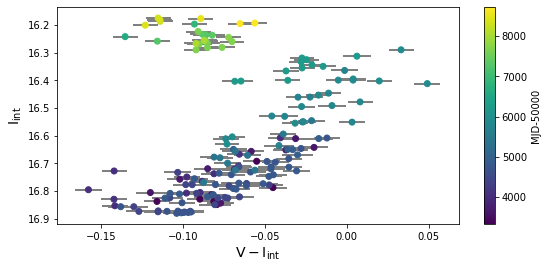

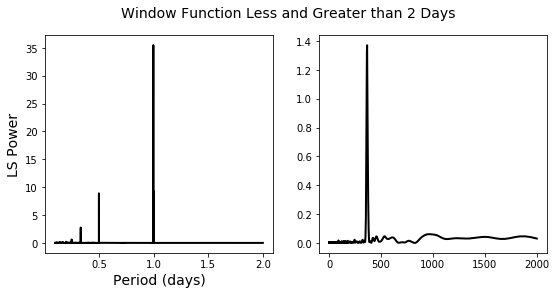

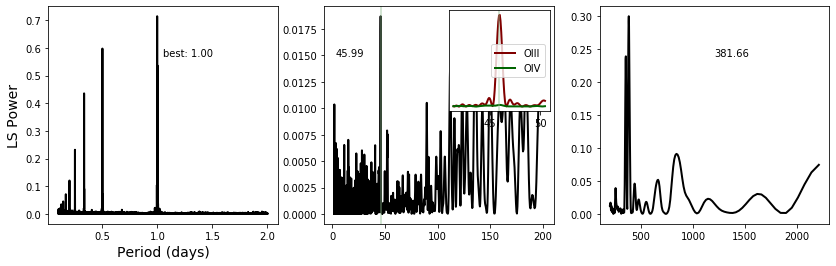

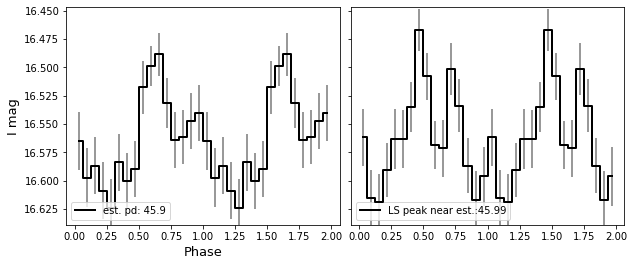

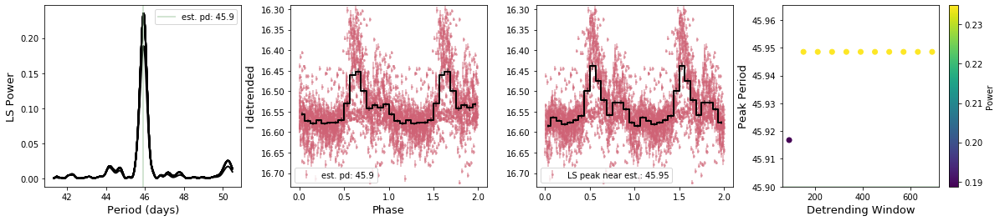

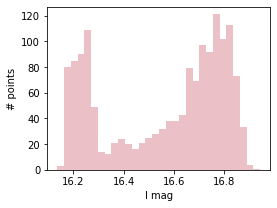

In [73]:
basic(41,pbins=16,saveall=save,medlim=False) 

In [74]:
# basic(42,pbins=16,saveall=save) #error here from reading in table --> look into table

Source number: 52
RA,Dec (deg): 15.808084, -72.154
Established period: 94.4
NS spin period: 345.2
Separation: 0.046253789717849166
I and V-I correlation: -0.9785549907580339
V and V-I correlation: -0.9517984312008556
Phase-folding with established orbital period and highest peak within five days of that value...
Repeating periodogram and phase-fold after detrending
Window shown in phase-fold: 189


max I band:  15.706
min I band:  14.638
I range:  1.0679999999999996
I stdev:  0.3699604288081181
max V band:  15.44
min V band:  14.763
V range:  0.6769999999999996
V stdev:  0.2626095422555576


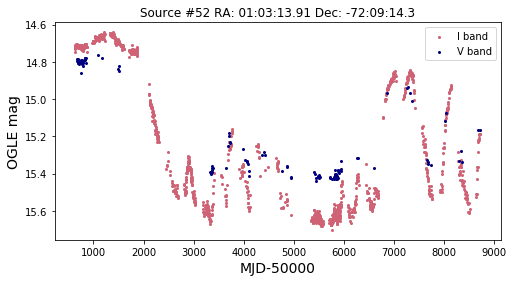

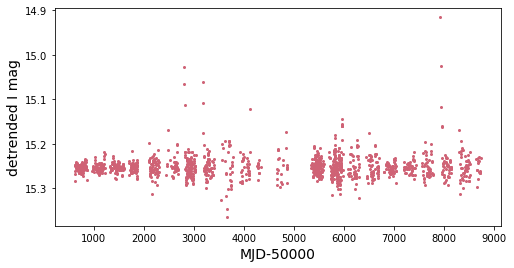

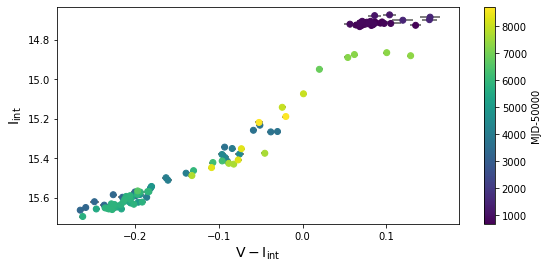

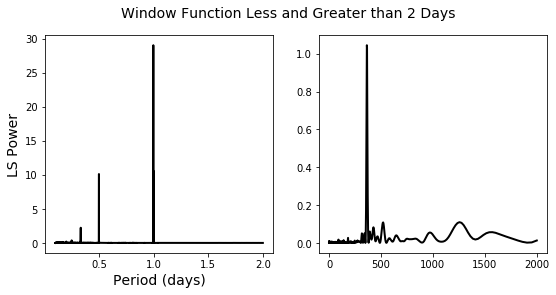

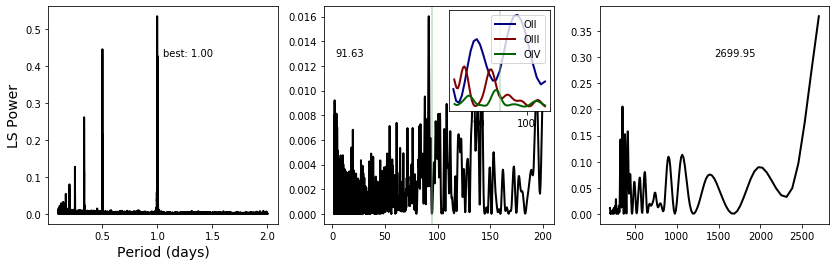

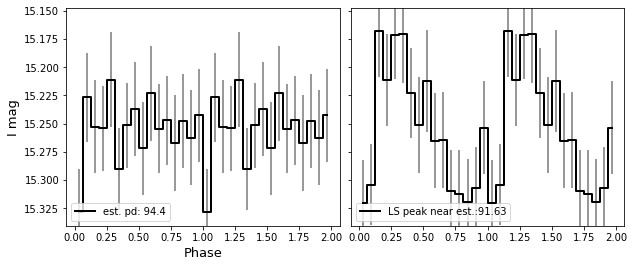

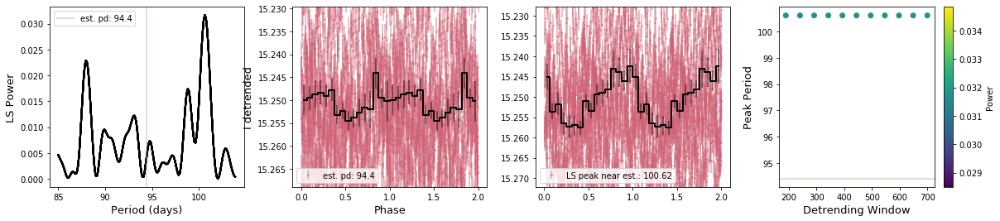

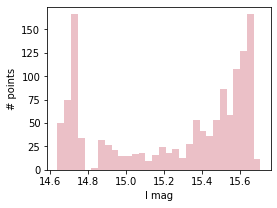

In [75]:
basic(43,pbins=16,saveall=save) 

Source number: 53
RA,Dec (deg): 15.336185, -72.188614
Established period: 74.96
NS spin period: 455.0
Separation: 0.022983953412039876
I and V-I correlation: -0.9742088876621257
V and V-I correlation: -0.8733781158456216
Phase-folding with established orbital period and highest peak within five days of that value...
Repeating periodogram and phase-fold after detrending
Window shown in phase-fold: 149


max I band:  15.942
min I band:  15.124
I range:  0.8179999999999996
I stdev:  0.20838471610448372
max V band:  15.754
min V band:  15.417
V range:  0.33699999999999974
V stdev:  0.09185714537016472


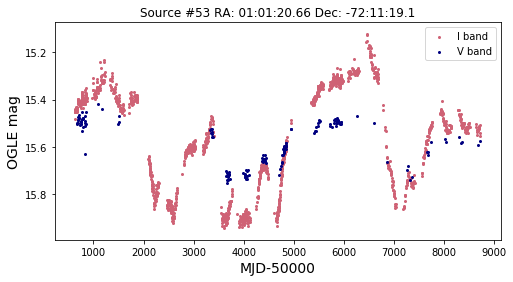

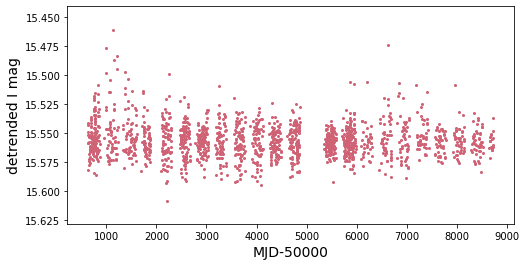

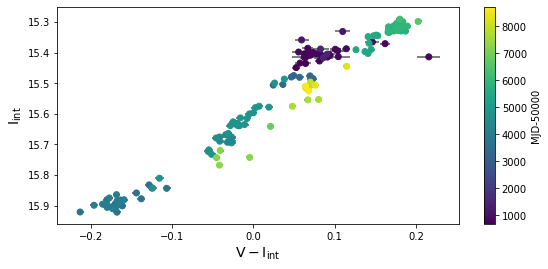

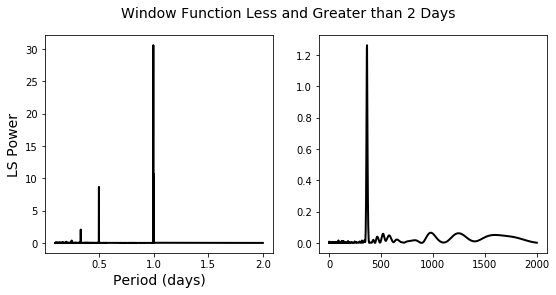

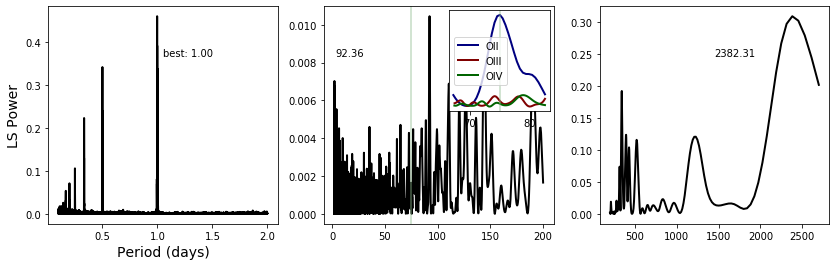

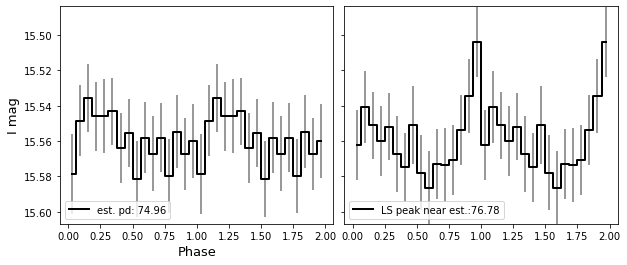

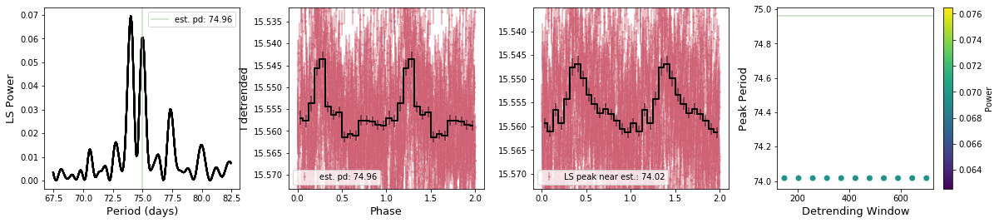

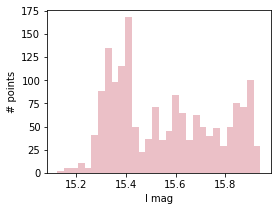

In [76]:
basic(44,pbins=16,saveall=save) 

Source number: 54
RA,Dec (deg): 13.733069, -72.75302
Established period: 265.3
NS spin period: 499.2
Separation: 0.4530185028467763
I and V-I correlation: -0.9237937740981867
V and V-I correlation: 0.5490350308625792
Phase-folding with established orbital period and highest peak within five days of that value...
Repeating periodogram and phase-fold after detrending
Window shown in phase-fold: 531


max I band:  14.848
min I band:  14.695
I range:  0.15300000000000047
I stdev:  0.03379515414677893
max V band:  15.037
min V band:  14.959
V range:  0.07800000000000118
V stdev:  0.01693277246566304


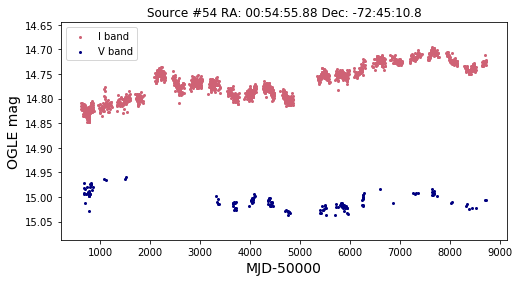

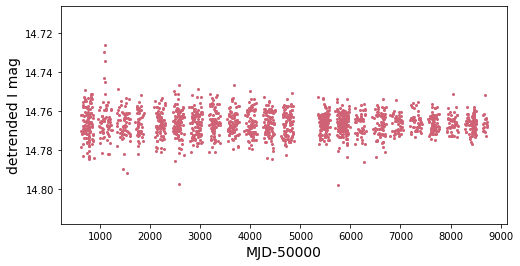

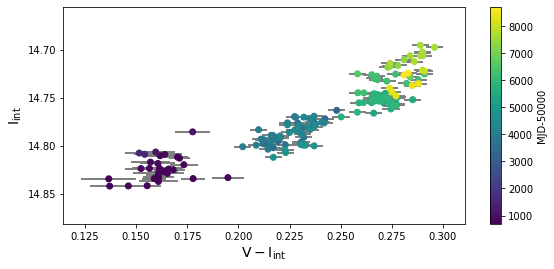

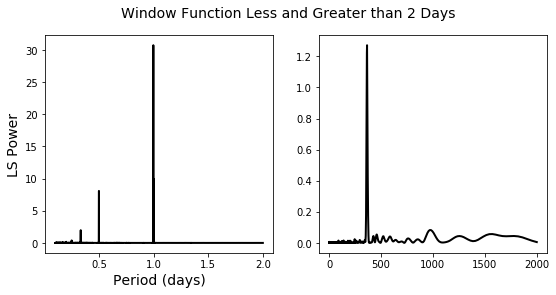

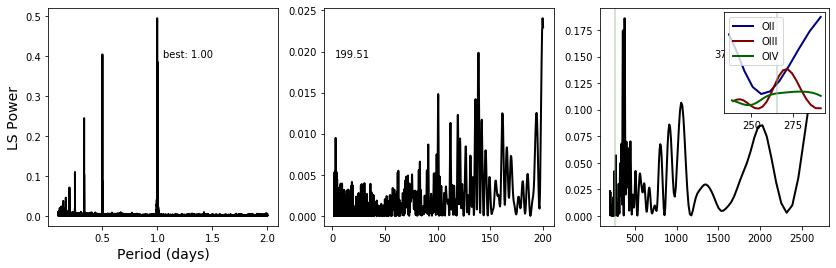

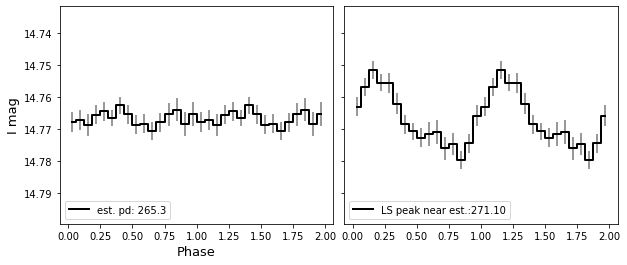

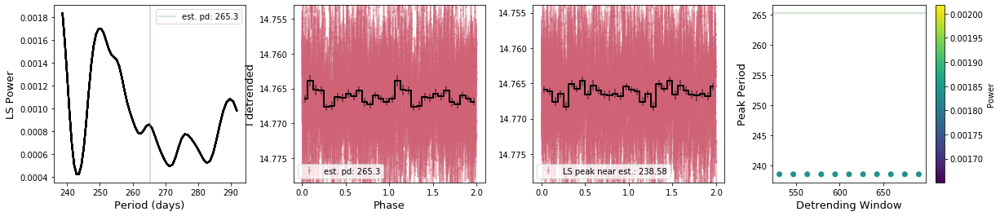

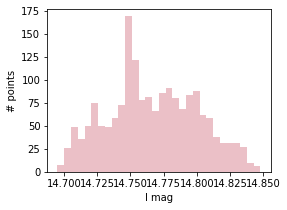

In [77]:
basic(45,pbins=16,saveall=save) #look into 199.51

Source number: 55
RA,Dec (deg): 15.697975, -72.0808
Established period: nan
NS spin period: 522.5
Separation: 1.0825526293151113
I and V-I correlation: -0.9784986197610509
V and V-I correlation: -0.8992727263873777
using best period from middle periodogram to phase-fold data, after detrending with 701
running periodogram on detrended data


max I band:  16.323
min I band:  15.53
I range:  0.793000000000001
I stdev:  0.16862670513393746
max V band:  16.006
min V band:  15.627
V range:  0.37899999999999956
V stdev:  0.08029740848947102


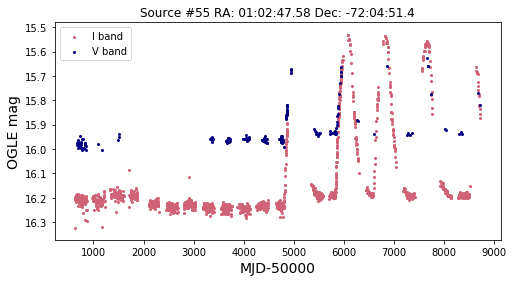

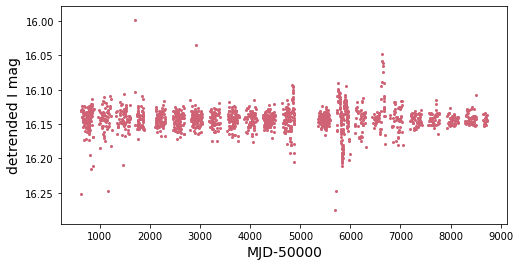

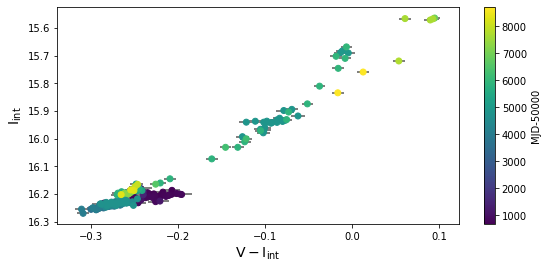

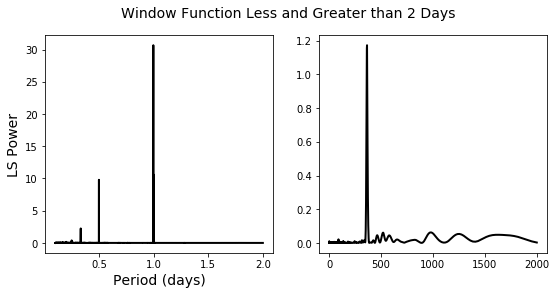

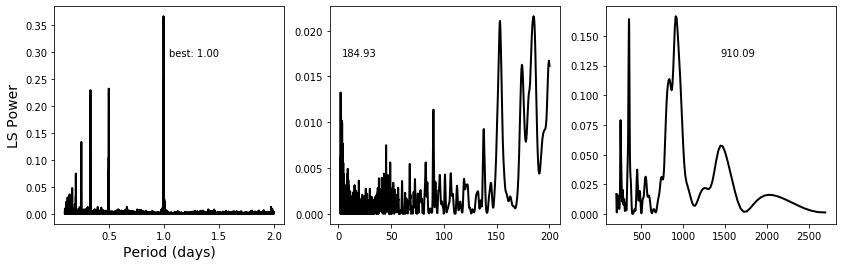

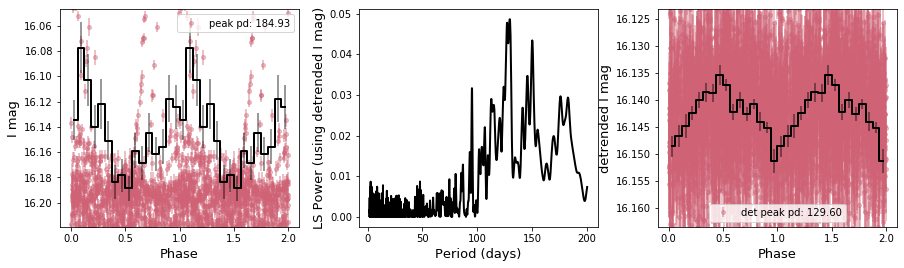

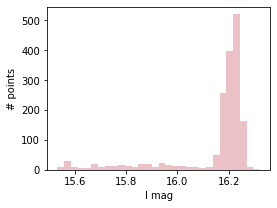

In [78]:
basic(46,pbins=16,saveall=save) #check that this is the same source

Source number: 56
RA,Dec (deg): 14.400833, -72.32611
Established period: 151.0
NS spin period: 565.0
Separation: 0.6676884237679841
I and V-I correlation: -0.13487099077743647
V and V-I correlation: 0.869350429450435
Phase-folding with established orbital period and highest peak within five days of that value...
Repeating periodogram and phase-fold after detrending
Window shown in phase-fold: 303


max I band:  15.895
min I band:  15.636
I range:  0.25900000000000034
I stdev:  0.025057228199954144
max V band:  16.129
min V band:  15.93
V range:  0.19900000000000162
V stdev:  0.04143523063444496


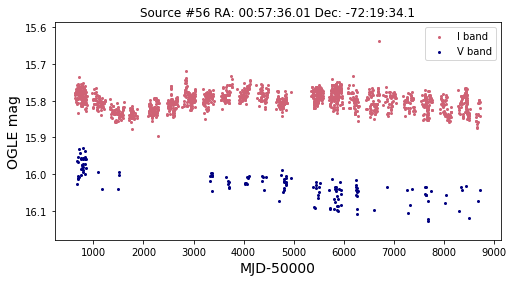

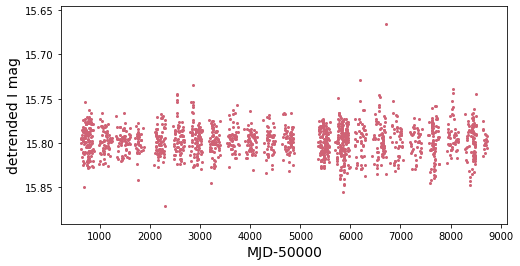

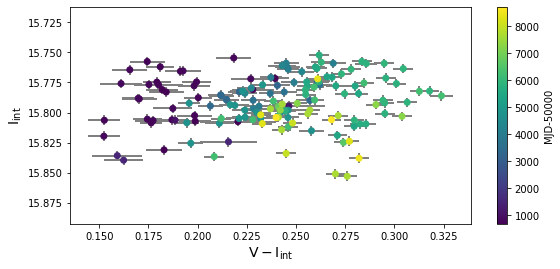

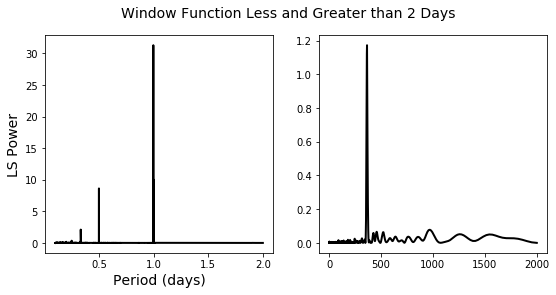

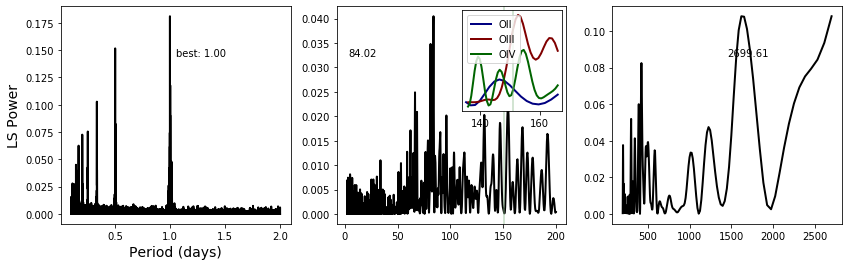

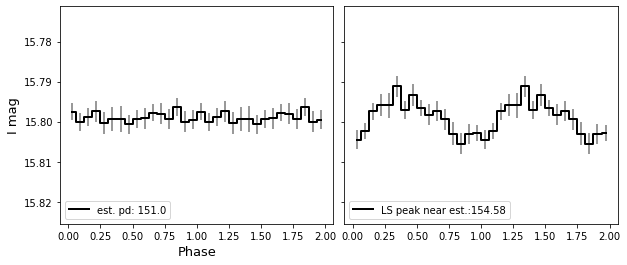

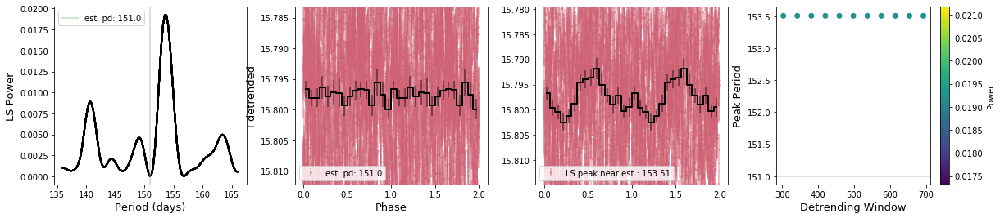

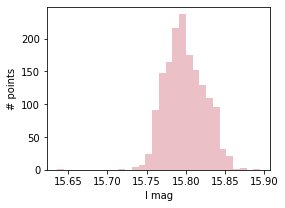

In [79]:
basic(47,pbins=16,saveall=save) 

Source number: 57
RA,Dec (deg): 13.897454, -72.485176
Established period: nan
NS spin period: 644.6
Separation: 0.8191807638607439
I and V-I correlation: -0.6687374569794301
V and V-I correlation: -0.21199712351210293
using best period from middle periodogram to phase-fold data, after detrending with 701
running periodogram on detrended data


max I band:  15.406
min I band:  14.454
I range:  0.952
I stdev:  0.17340324912036056
max V band:  14.903
min V band:  14.631
V range:  0.27200000000000024
V stdev:  0.07935137696121616


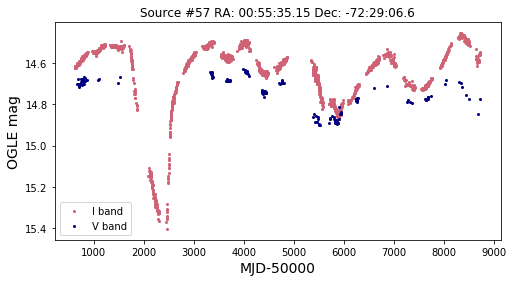

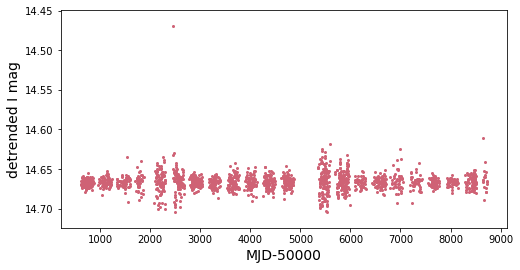

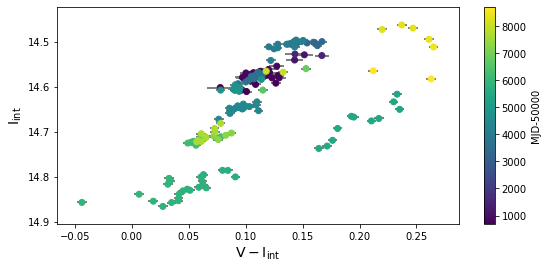

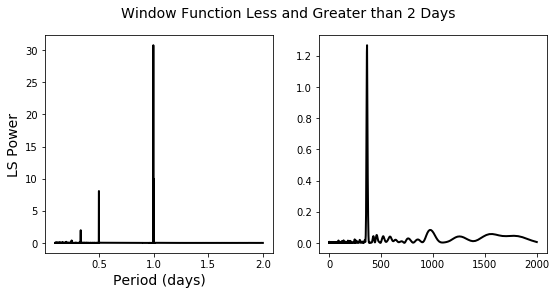

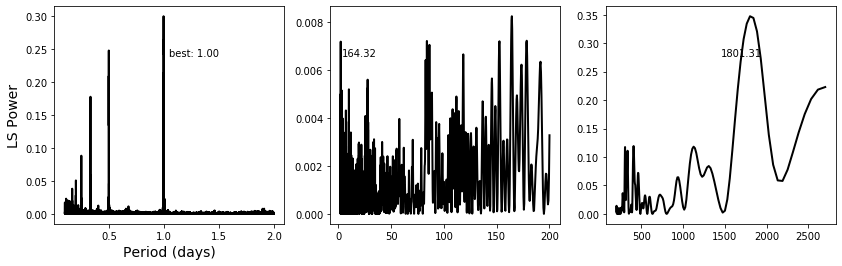

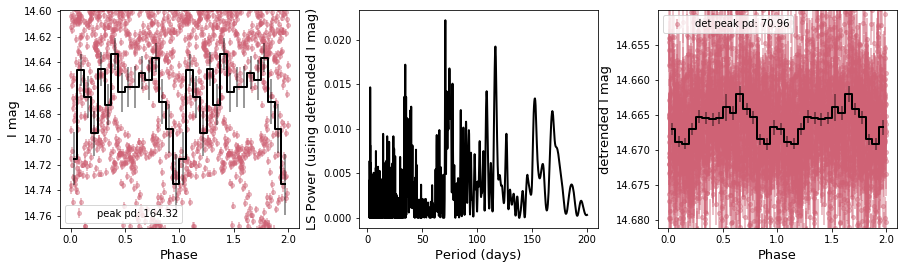

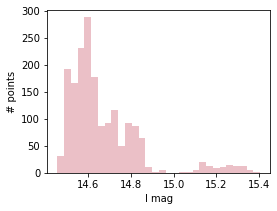

In [80]:
basic(48,pbins=16,saveall=save) 

Source number: 58
RA,Dec (deg): 13.826359, -72.64776
Established period: 412.0
NS spin period: 701.6
Separation: 0.7236213078134346
I and V-I correlation: -0.20537467673685186
V and V-I correlation: 0.7572808895955526
Phase-folding with established orbital period and highest peak within five days of that value...
Repeating periodogram and phase-fold after detrending
Window shown in phase-fold: 825


max I band:  15.816
min I band:  15.623
I range:  0.1930000000000014
I stdev:  0.026893917177306874
max V band:  16.131
min V band:  15.938
V range:  0.19299999999999962
V stdev:  0.034855399497007514


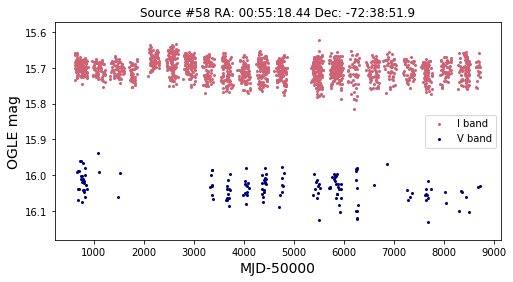

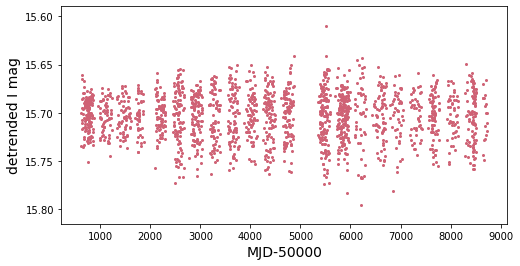

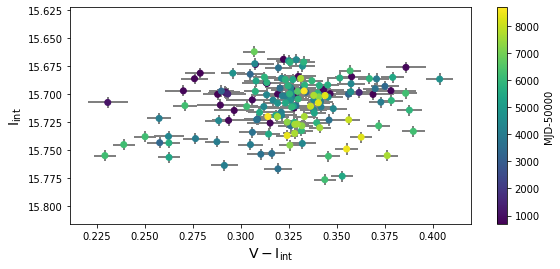

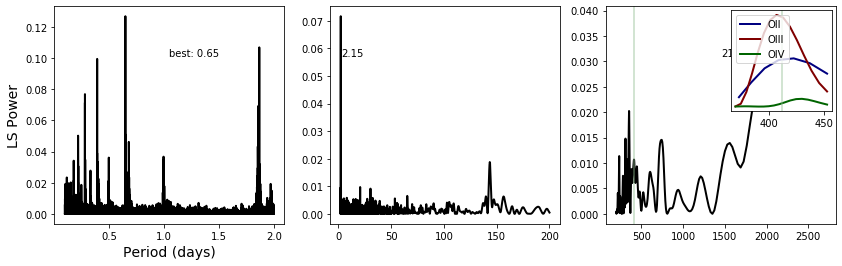

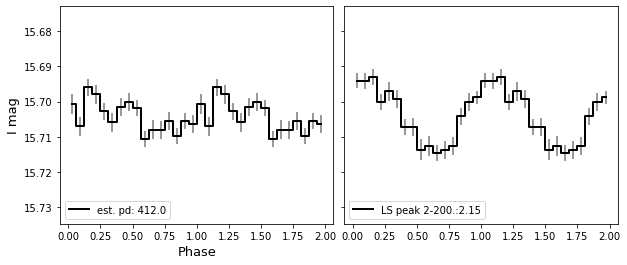

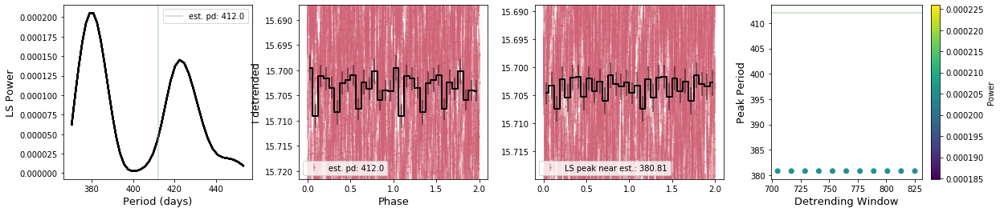

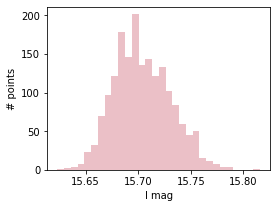

In [81]:
basic(49,pbins=16,saveall=save) 

Source number: 59
RA,Dec (deg): 16.480871, -72.06368
Established period: nan
NS spin period: 726.0
Separation: 1.6814697416375097
I and V-I correlation: -0.4396991513307721
V and V-I correlation: 0.7398436434797936
using best period from middle periodogram to phase-fold data, after detrending with 701
running periodogram on detrended data


max I band:  15.551
min I band:  15.388
I range:  0.16300000000000026
I stdev:  0.023778889227362994
max V band:  15.729
min V band:  15.596
V range:  0.13299999999999912
V stdev:  0.02805078399400685


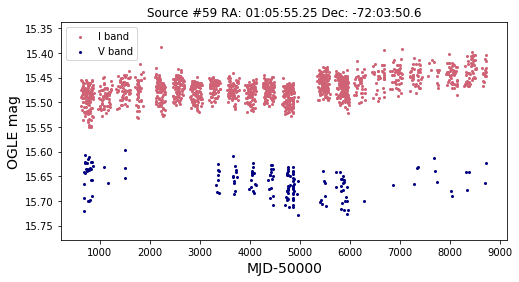

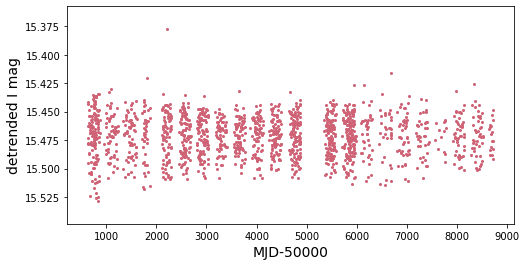

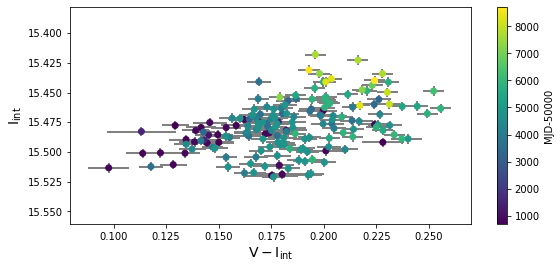

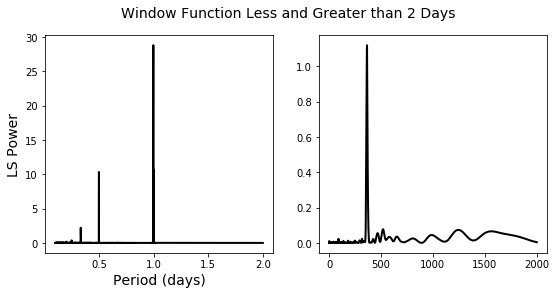

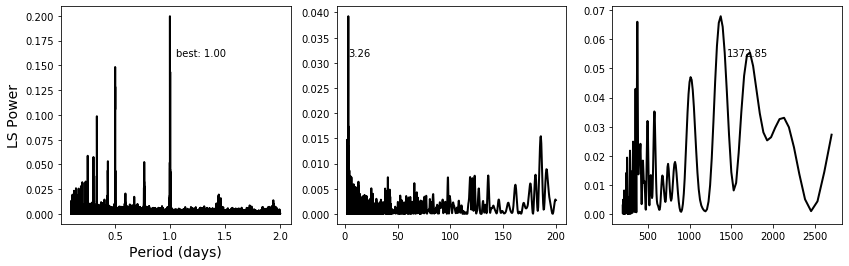

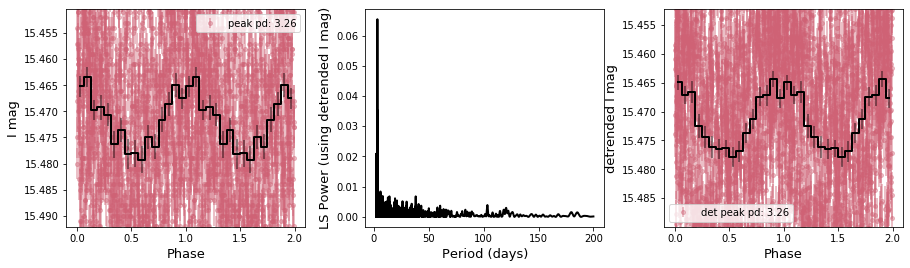

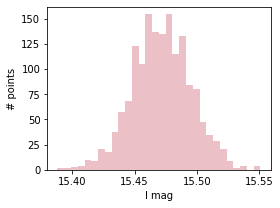

In [82]:
basic(50,pbins=16,saveall=save) 

Source number: 60
RA,Dec (deg): 12.425474, -73.38738
Established period: 390.0
NS spin period: 755.5
Separation: 0.5314121167733278
I and V-I correlation: -0.7903821327759735
V and V-I correlation: -0.572353612041409
Phase-folding with established orbital period and highest peak within five days of that value...
Repeating periodogram and phase-fold after detrending
Window shown in phase-fold: 781


max I band:  14.773
min I band:  14.05
I range:  0.722999999999999
I stdev:  0.09112032412293081
max V band:  15.129
min V band:  14.628
V range:  0.5009999999999994
V stdev:  0.07230441818373819


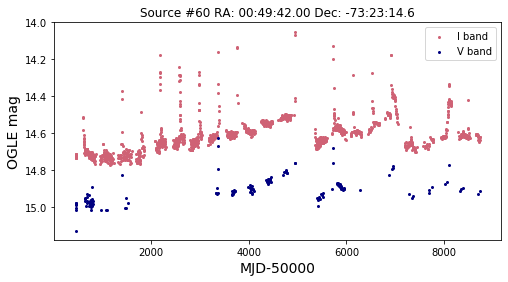

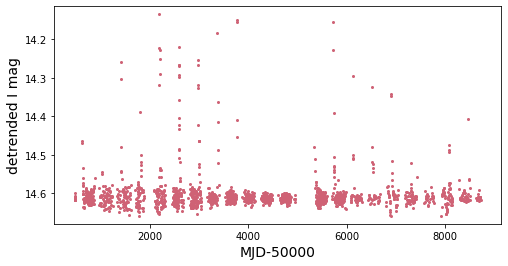

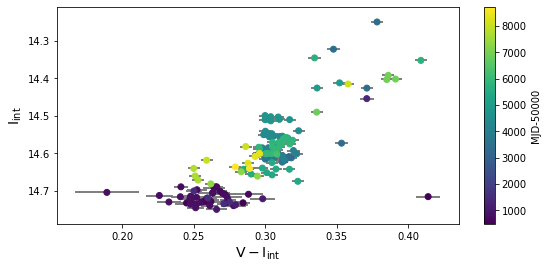

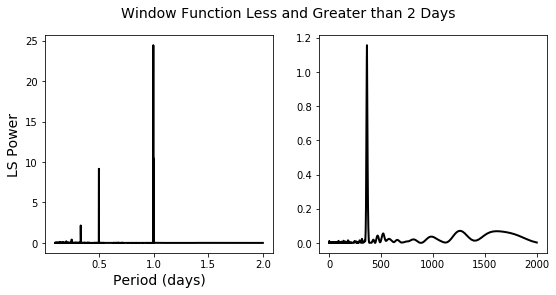

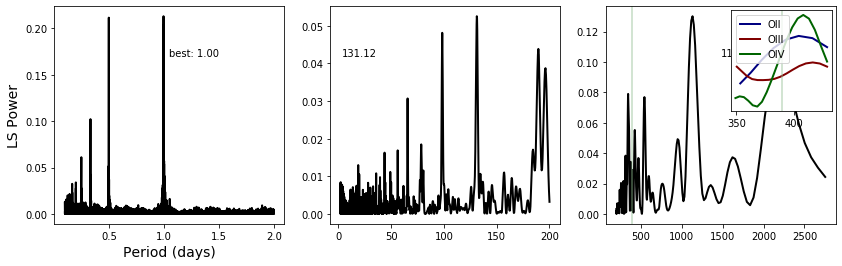

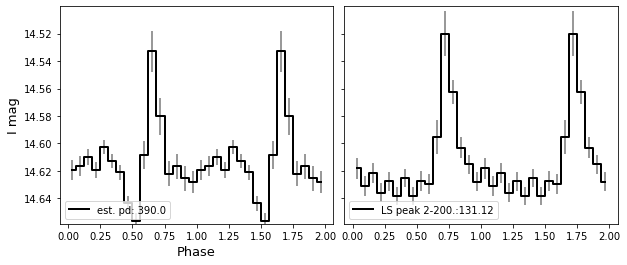

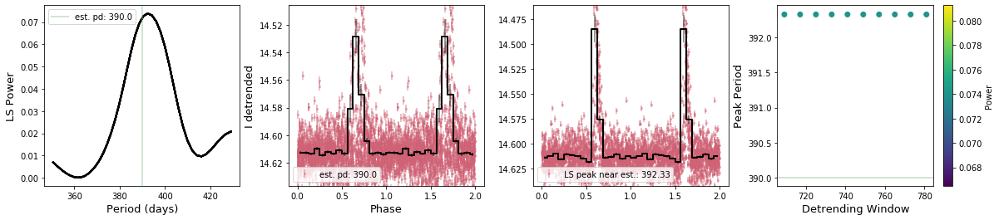

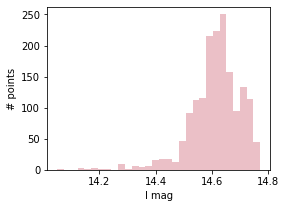

In [83]:
basic(51,pbins=16,saveall=save) 

Source number: 62
RA,Dec (deg): 15.527875, -71.68772
Established period: 101.94
NS spin period: 967.0
Separation: 0.21500342107582393
I and V-I correlation: -0.7709091623384245
V and V-I correlation: -0.4095687062907695
Phase-folding with established orbital period and highest peak within five days of that value...
Repeating periodogram and phase-fold after detrending
Window shown in phase-fold: 203


max I band:  14.872
min I band:  14.089
I range:  0.7829999999999995
I stdev:  0.12061247600828501
max V band:  14.798
min V band:  14.295
V range:  0.5030000000000001
V stdev:  0.08240343525619025


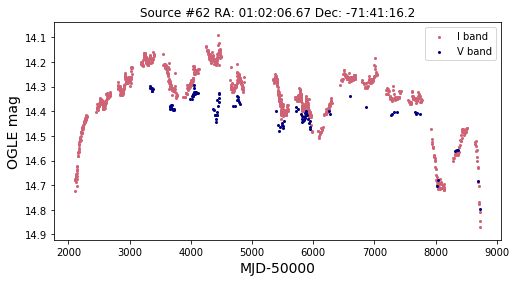

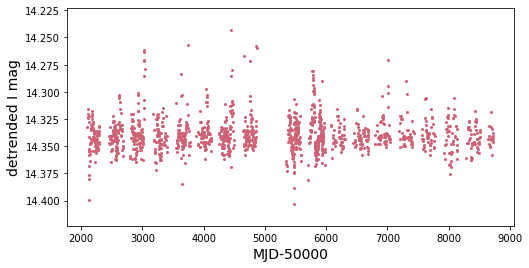

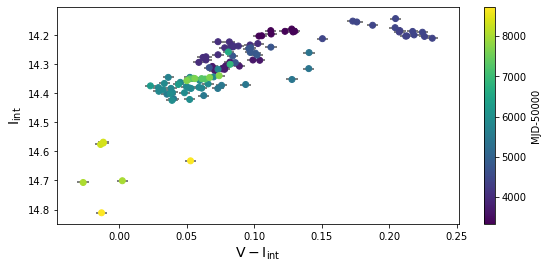

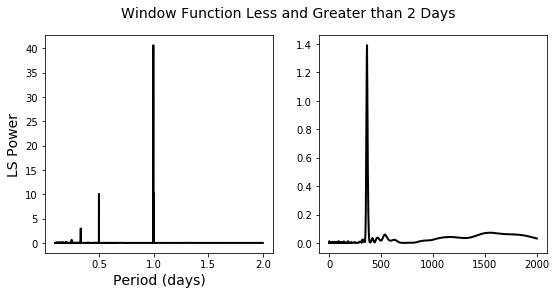

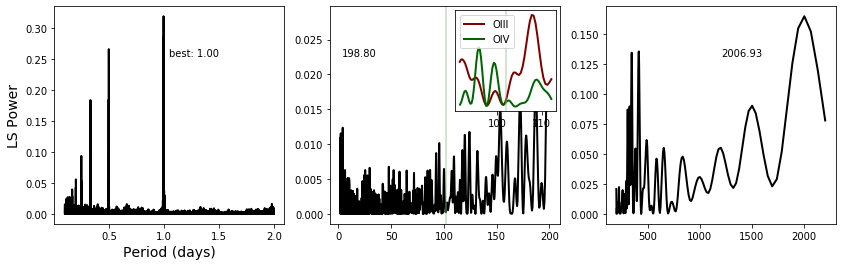

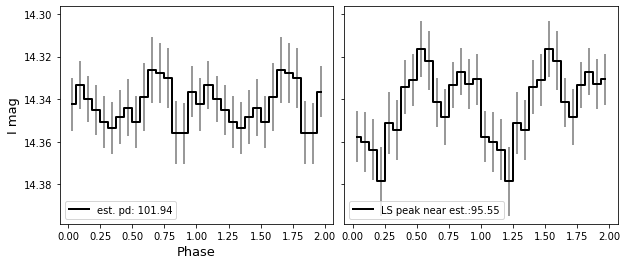

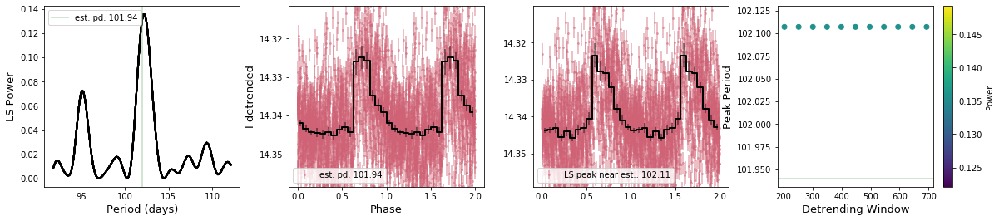

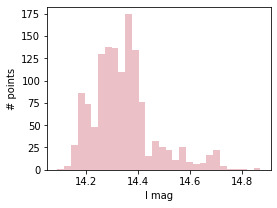

In [84]:
basic(52,pbins=16,saveall=save) 

Source number: 63
RA,Dec (deg): 21.941542, -73.54903
Established period: nan
NS spin period: 1062.0
Separation: 0.13478893533990055
I and V-I correlation: -0.949075347309229
V and V-I correlation: -0.871228200471551
using best period from middle periodogram to phase-fold data, after detrending with 701
running periodogram on detrended data


max I band:  14.242
min I band:  13.659
I range:  0.5830000000000002
I stdev:  0.04576946281649492
max V band:  14.466
min V band:  14.077
V range:  0.38899999999999935
V stdev:  0.053669946320042176


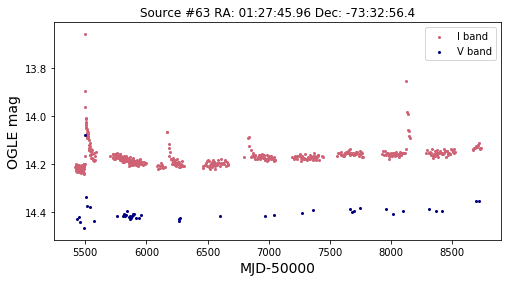

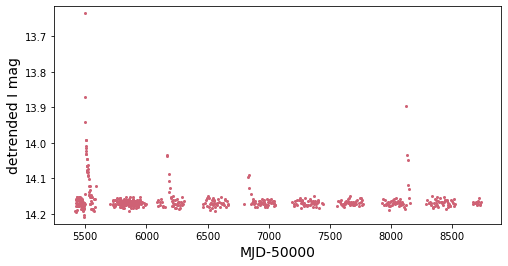

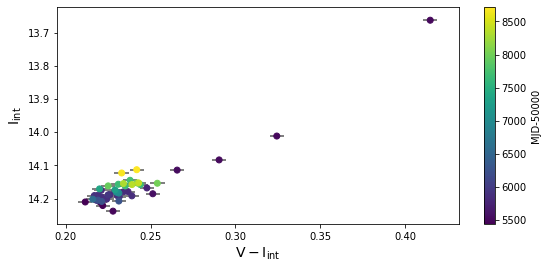

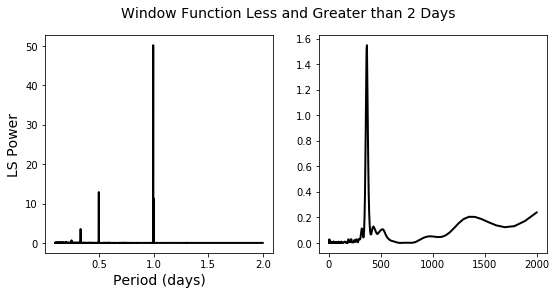

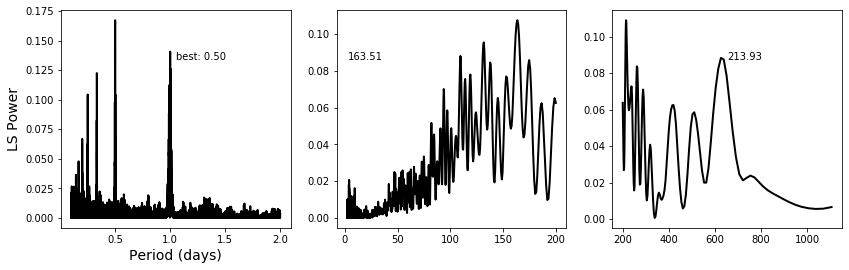

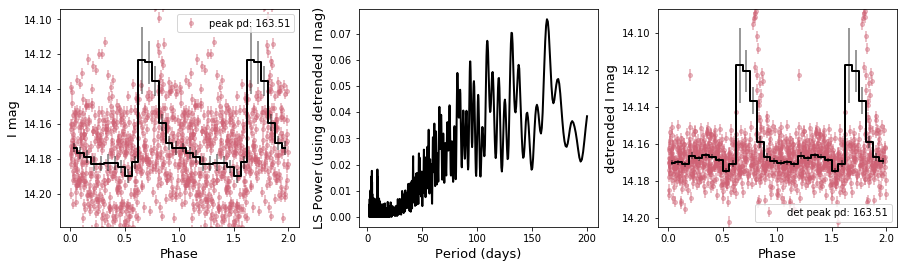

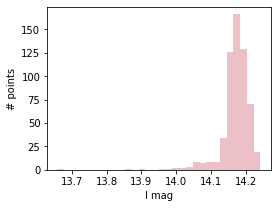

In [85]:
basic(53,pbins=16,saveall=save) 

Source number: 64
RA,Dec (deg): 15.906292, -72.0258
Established period: nan
NS spin period: 1323.0
Separation: 0.3875389193454174
I and V-I correlation: -0.4388904144939015
V and V-I correlation: 0.5195263979783094
using best period from middle periodogram to phase-fold data, after detrending with 701
running periodogram on detrended data


max I band:  14.665
min I band:  14.479
I range:  0.18599999999999994
I stdev:  0.02984407479612393
max V band:  14.727
min V band:  14.562
V range:  0.16500000000000092
V stdev:  0.03415353164324986


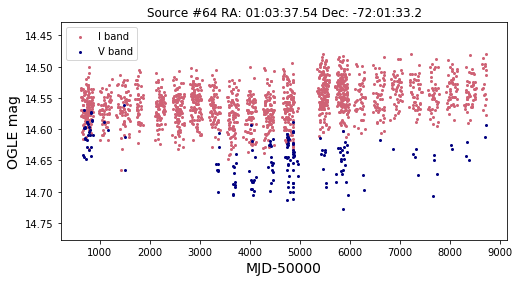

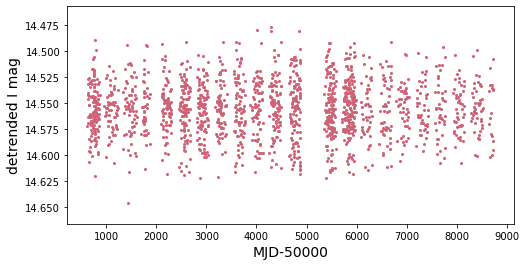

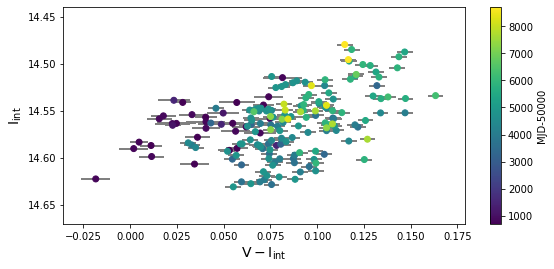

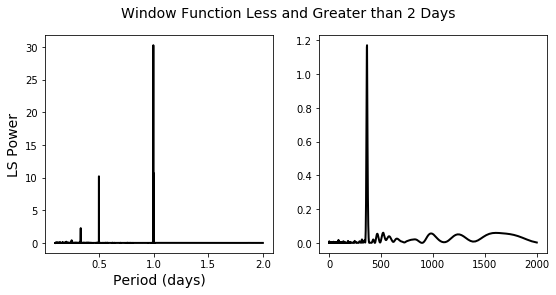

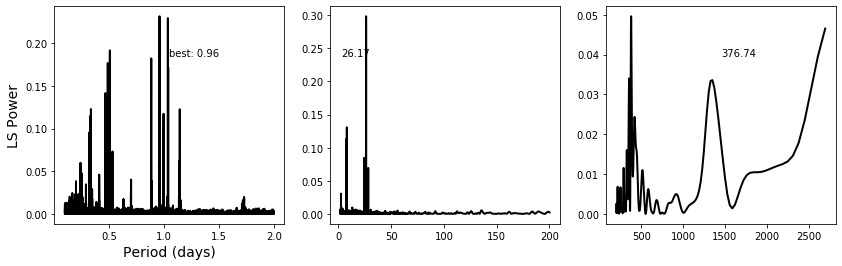

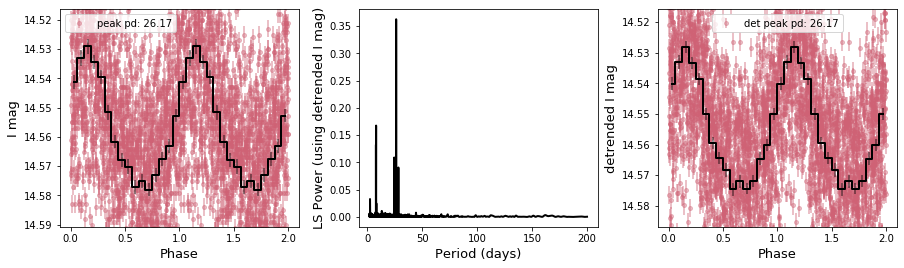

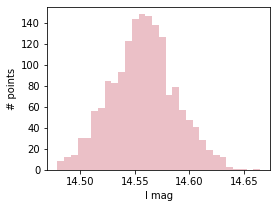

In [86]:
basic(54,pbins=16,saveall=save) 

Source number: 65
RA,Dec (deg): 13.692583, -72.42306
Established period: nan
NS spin period: 4693.0
Separation: 1.0349996195972824
I and V-I correlation: -0.16860135254047037
V and V-I correlation: 0.951775471776383
using best period from middle periodogram to phase-fold data, after detrending with 701
running periodogram on detrended data


max I band:  15.426
min I band:  15.295
I range:  0.13100000000000023
I stdev:  0.02955587032997475
max V band:  15.684
min V band:  14.883
V range:  0.8010000000000002
V stdev:  0.07328052752461406


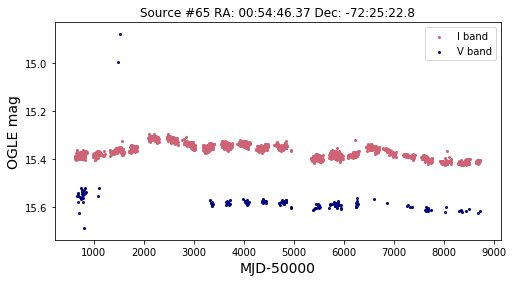

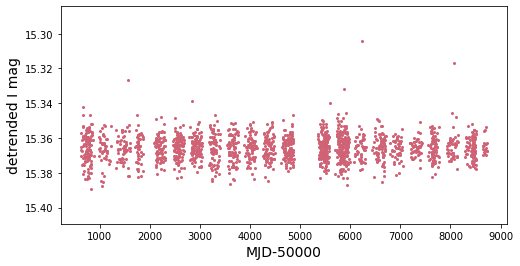

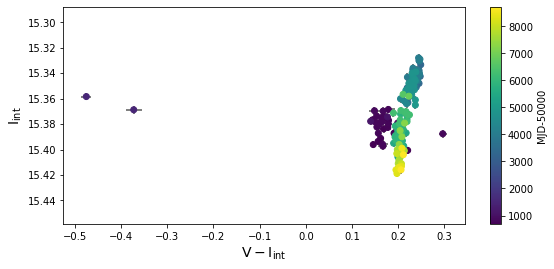

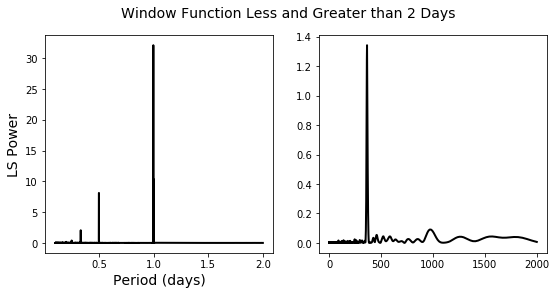

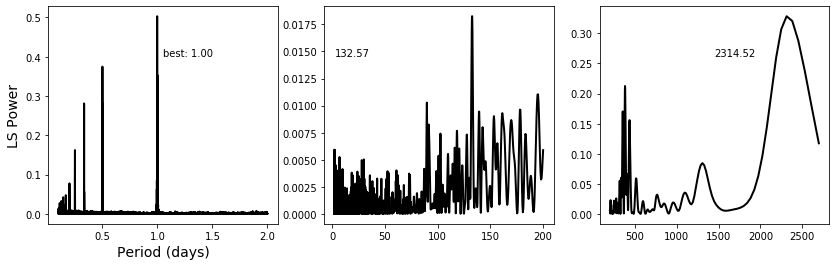

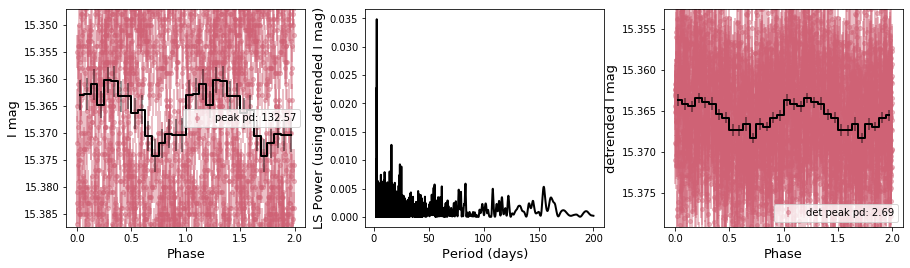

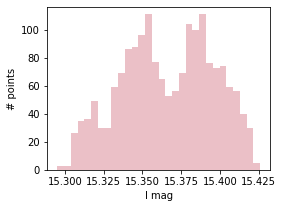

In [87]:
basic(55,pbins=16,saveall=save) 

Source number: 125
RA,Dec (deg): 15.482444, -72.54349
Established period: 36.41
NS spin period: nan
Separation: 0.4561186471617218
I and V-I correlation: -0.8744251563223343
V and V-I correlation: -0.7590429450237982
Phase-folding with established orbital period and highest peak within five days of that value...
Repeating periodogram and phase-fold after detrending
Window shown in phase-fold: 135


max I band:  14.44
min I band:  13.506
I range:  0.9339999999999993
I stdev:  0.22958150518580372
max V band:  14.297
min V band:  13.658
V range:  0.6390000000000011
V stdev:  0.1798246457259509


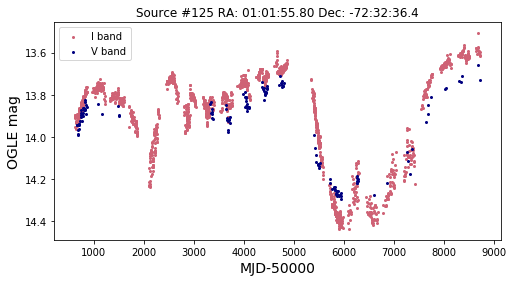

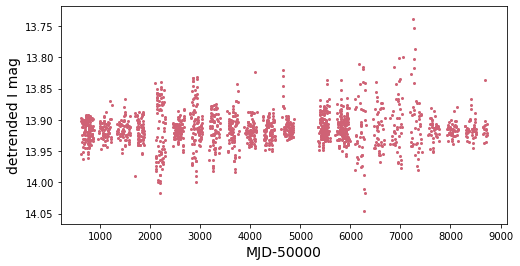

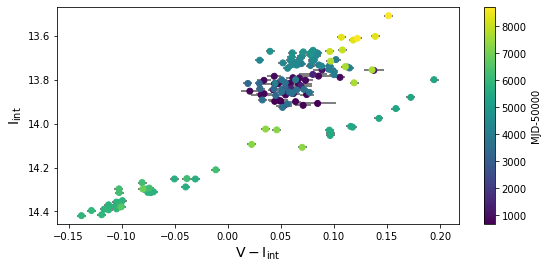

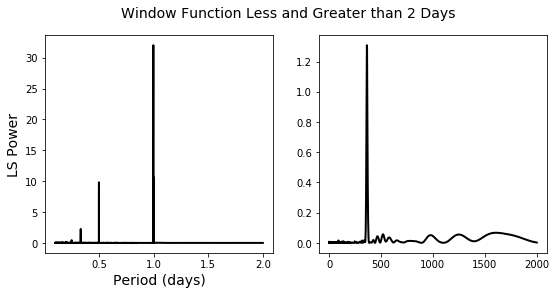

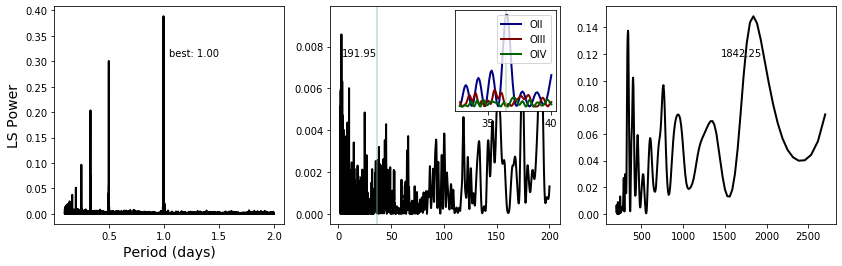

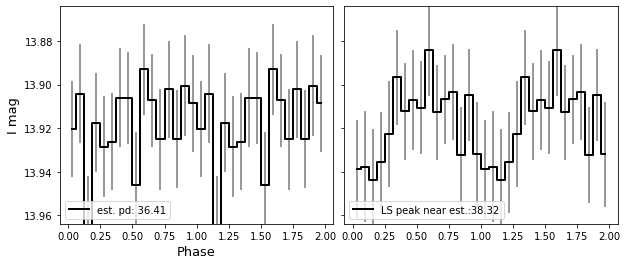

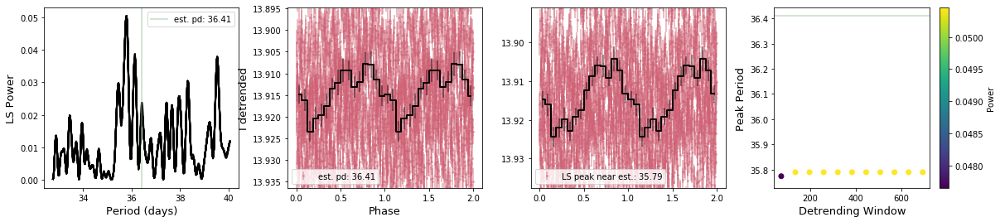

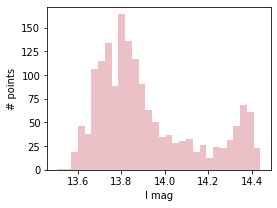

In [88]:
basic(56,pbins=16,saveall=save) 

Source number: 142
RA,Dec (deg): 20.864399, -73.356514
Established period: 119.8
NS spin period: nan
Separation: 1.3645475547581647
I and V-I correlation: -0.39587280551306564
V and V-I correlation: 0.7707790909498434
Phase-folding with established orbital period and highest peak within five days of that value...
Repeating periodogram and phase-fold after detrending
Window shown in phase-fold: 239


max I band:  15.527
min I band:  15.046
I range:  0.48099999999999987
I stdev:  0.05623848417344712
max V band:  15.562
min V band:  15.205
V range:  0.3569999999999993
V stdev:  0.08736986118639661


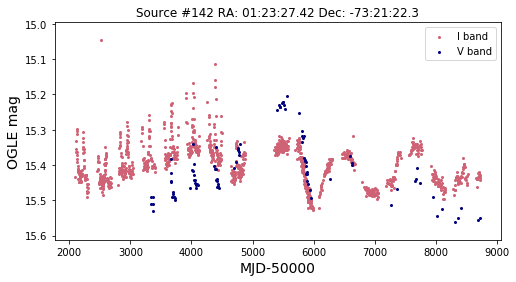

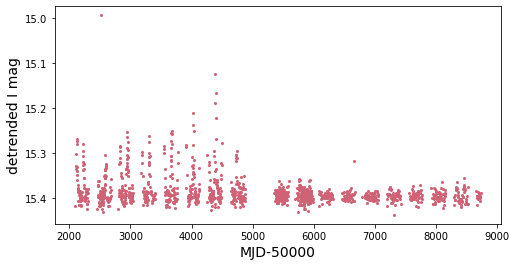

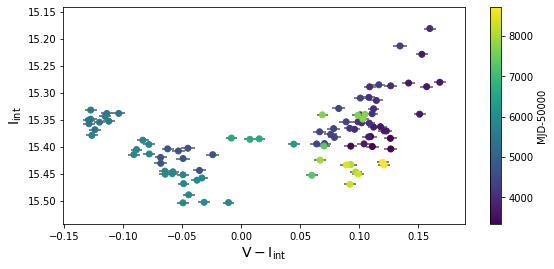

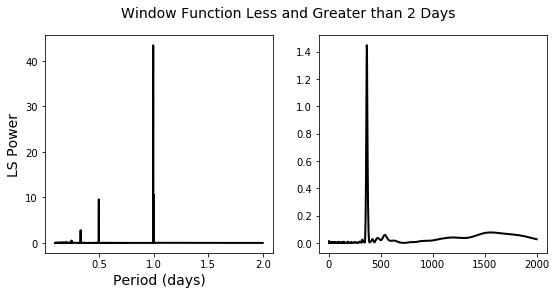

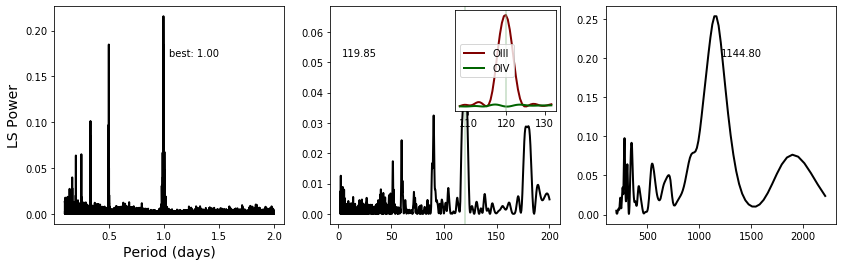

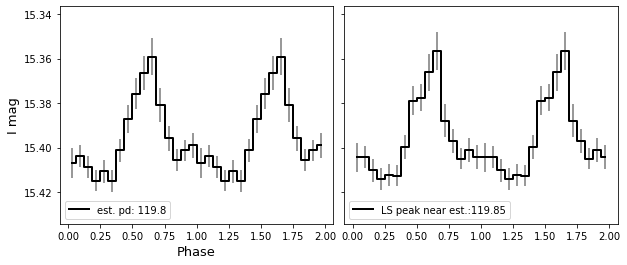

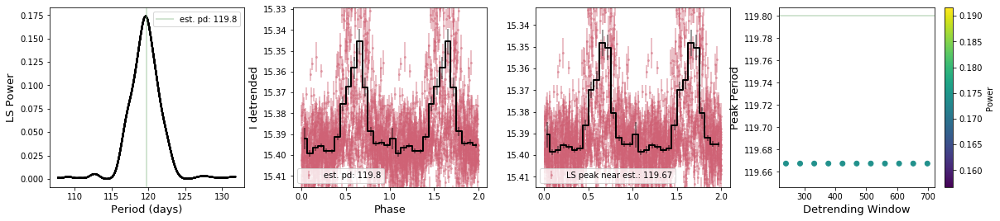

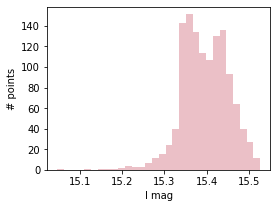

In [89]:
basic(57,pbins=16,saveall=save) #check that this is the same source

In [90]:
len(full)

109

In [91]:
len(cross)

58

## write out summary table and peak dictionary
- only rewrite peak dict if all sources run!

In [92]:
#write table back out
summ.to_csv('summtab.csv',index=False)

In [93]:
np.save('part1peaks.npy', peak_dict)

# basic analysis of summary table
- doesn't yet include sources that had error before (mostly b/c est. periods above 200 days)

- will continue with this analysis -- can just read tables back in

- write basic code to just check for correlations between all variables

In [ ]:
ilist,vlist = o.getIV(4,cross,plot=True,zooms=False,figsize=(8,4),mult=(3,8),offset=10,stack=False,save=False)
iband,vband = vstack(ilist),vstack(vlist)
    
#rspline detrending
flatten, trend = wotan.flatten(iband['MJD-50000'],iband['I mag'],method='rspline',window_length=200,break_tolerance=50,return_trend=True)
        
#add detrended column: original - trend + mean
mean = np.mean(iband['I mag'])
detr = iband['I mag'] - trend + mean
iband['I detrend'] = detr
#for periodogram, use temp table that takes out nan detrended values
itemp = iband[np.isnan(iband['I detrend'])==False]
#also ignore outliers by greater than a mag
plt.figure(figsize=(8,4))
plt.scatter(itemp['MJD-50000'],itemp['I detrend'],color=pink,s=4)
plt.ylabel('detrended I mag',fontsize=14)
plt.xlabel('MJD-50000',fontsize=14)
maxdet,mindet = np.max(itemp['I detrend']),np.min(itemp['I detrend'])
plt.ylim(maxdet+0.02,mindet-0.02)
    
#color-mag plots
interp = o.colormag(iband,vband,ctime=True,retint=True,figsize=(9,8),save=False) 

In [ ]:
#fit V vs. V-I and I vs. V-I
i = interp[:700]
v = vband['V mag'][:700]
vi = v-i
mod = np.polyfit(vi,i,1)
mod2 = np.polyfit(vi,v,1)

In [ ]:
mod[0]-mod2[0]

In [ ]:
mod2[0]

In [ ]:
plt.scatter(vi,i)
plt.plot(vi,mod[0]*vi+mod[1])
plt.plot(vi,mod2[0]*vi+mod2[1])

plt.scatter(vi,v)

In [ ]:
full[:4]

In [ ]:
len(summ)

In [ ]:
summ.columns

for sources that already had established period, compare to best period post-detrending (with max power from various windows)

In [ ]:
def sf(file,dpi=200,fdir='Figs/'):
    plt.savefig(fdir+file+'.png',dpi=dpi,bbox_inches='tight')

In [ ]:
xs = np.arange(220)
nonzero = summ[summ['est. period']!=0]
nonzero = nonzero[nonzero['best auto det pd']!=0]

plt.scatter(nonzero['est. period'],nonzero['best auto det pd'],color='black')
plt.plot(xs,xs,color='darkseagreen',alpha=0.4,label='y=x')
plt.legend()
plt.ylim(0,220)
plt.xlim(0,220)
plt.xlabel('Established Period',fontsize=13)
plt.ylabel('Best Pd Post-Detrending',fontsize=13)
sf('new_old_pds')

In [ ]:
np.max(summ['est. period'])

In [ ]:
#residual plot (remember, though, that there's a restriction on how much it CAN change)
plt.scatter(nonzero['est. period'],nonzero['best auto det pd']-nonzero['est. period'],color='black')
plt.axhline(0,color='red',alpha=0.4)
plt.ylabel('Detrended Best - Established Period',fontsize=14)
plt.xlabel('Established Period',fontsize=14)

In [ ]:
plt.scatter(summ['mean I'],summ['mean V'],color='black')

In [ ]:
plt.scatter(summ['stdev I'],summ['stdev V'],c=summ['I V-I slope'])
plt.colorbar(label='I vs. V-I slope')
plt.ylabel('V stdev',fontsize=13)
plt.xlabel('I stdev',fontsize=13)
sf('I_V_stdev')

In [ ]:
plt.scatter(summ['I skew'],summ['V skew'],color='black')

In [ ]:
plt.scatter(summ['I kurtosis'],summ['V kurtosis'],c=summ['I skew'])
plt.ylim(-4,15)
plt.xlim(-4,15)
plt.colorbar()

Corbet

In [ ]:
plt.scatter(nonzero['best auto det pd'],nonzero['spin period'],color='black')
